In [1]:
import math
import torch
import gpytorch
import numpy as np
from matplotlib import pyplot as plt

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Generate data

In [2]:
def double_sig_model(xi, theta):
    # Mathematical definition of the double sigmoid. This is used to generate "synthetic" data.
    a1, a2, a3, a4, a5, a6, a7 = theta[0], theta[1], theta[2], theta[3], theta[4], theta[5], theta[6]
    return a1 + (a2-a1)/(1+math.exp(-a3*(xi-a4))) + (a5-a2)/(1+math.exp(-a6*(xi-a7)))

In [3]:
num_points = 250

theta = np.array([0.0, 0.4, 0.15, 50, 1, 0.293, 150])
x = torch.from_numpy(np.arange(num_points)).float()
f = np.array([double_sig_model(xi, theta) for xi in x])
noise = np.random.normal(loc=0, scale=0.1, size=num_points)
y = torch.from_numpy(f + noise).float()

# samples = np.random.permutation(num_points)
# train_samples = samples[125:126]
test_samples = np.delete(x, 125).numpy()

train_x, train_y, test_x, test_y = x[125:126], y[125:126], x[test_samples], y[test_samples]
train_x, train_y = train_x[train_x.argsort()], train_y[train_x.argsort()]
test_x, test_y = test_x[test_x.argsort()], test_y[test_x.argsort()]

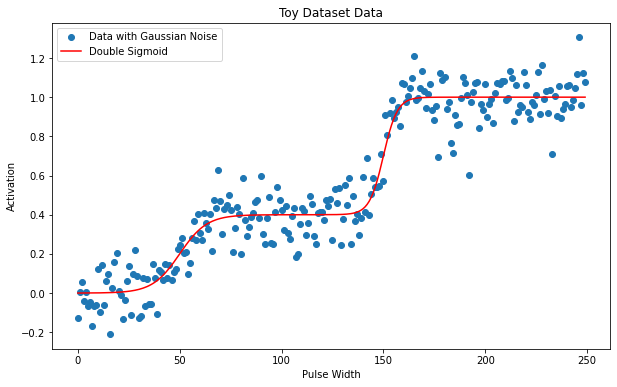

In [4]:
plt.figure(figsize=(10,6))
plt.scatter(x, y, label = 'Data with Gaussian Noise')
plt.plot(f, color = 'red', label = 'Double Sigmoid')
plt.title('Toy Dataset Data')
plt.xlabel('Pulse Width')
plt.ylabel('Activation')
plt.legend()
plt.show()

In [5]:
class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(ExactGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel())

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

In [6]:
def plot_preds(model, likelihood, return_means): 
    model.eval()
    likelihood.eval()
    with torch.no_grad():
        # Initialize plot
        f, ax = plt.subplots(1, 2, figsize=(20, 6))
        #model returns a vector, likelihood converts to gaussian
        #from likelihood, one can obtain mean and variance 
        observed_train_pred = likelihood(model(train_x))
        observed_test_pred = likelihood(model(test_x))

        # Get upper and lower confidence bounds - 95%
        train_lower, train_upper = observed_train_pred.confidence_region()
        test_lower, test_upper = observed_test_pred.confidence_region()

        # Plot test data as black stars
        ax[0].plot(train_x.numpy(), train_y.numpy(), 'k*')
        ax[1].plot(test_x.numpy(), test_y.numpy(), 'k*')

        # Plot predictive means as blue line
        ax[0].plot(train_x.numpy(), observed_train_pred.mean.numpy(), 'b')
        ax[1].plot(test_x.numpy(), observed_test_pred.mean.numpy(), 'b')

        # Shade between the lower and upper confidence bounds
        ax[0].fill_between(train_x.numpy(), train_lower.numpy(), train_upper.numpy(), alpha=0.5)
        ax[0].legend(['Train Data', 'Mean', '95% Conf. Int.'])
#         ax[0].set_ylim([-0.3, 1.3])
        
        ax[1].fill_between(test_x.numpy(), test_lower.numpy(), test_upper.numpy(), alpha=0.5)
        ax[1].legend(['Test Data', 'Mean', '95% Conf. Int.'])
#         ax[1].set_ylim([-0.3, 1.3])
        plt.show()
        
        # find x value in test data that corresponds to the maximum posterior variance (train model on train_x, feed it test_x, get value of test_x that produce maximal posterior variance)
        max_posterior_variance_test = np.argmax((test_upper - test_lower).numpy())
        
        if return_means == True:
            # mean of distribution used to get MSE
            return(observed_train_pred.mean.numpy(), observed_test_pred.mean.numpy(), max_posterior_variance_test)
        else:
            return(observed_train_pred.confidence_region(), observed_test_pred.confidence_region())

In [7]:
def plot_preds2(model, likelihood): 
    model.eval()
    likelihood.eval()
    with torch.no_grad():
        # Initialize plot
        f, ax = plt.subplots(1, 2, figsize=(20, 6))
        observed_train_pred = likelihood(model(train_x))
        observed_test_pred = likelihood(model(test_x))

        # Get upper and lower confidence bounds
        train_lower, train_upper = observed_train_pred.confidence_region()
        test_lower, test_upper = observed_test_pred.confidence_region()

        # Plot test data as black stars
        ax[0].plot(train_x.numpy(), train_y.numpy(), 'k*')
        ax[1].plot(test_x.numpy(), test_y.numpy(), 'k*')

        # Plot predictive means as blue line
        ax[0].plot(train_x.numpy(), observed_train_pred.mean.numpy(), 'b')
        ax[1].plot(test_x.numpy(), observed_test_pred.mean.numpy(), 'b')

        # Shade between the lower and upper confidence bounds
        ax[0].fill_between(train_x.numpy(), train_lower.numpy(), train_upper.numpy(), alpha=0.5)
        ax[0].legend(['Train Data', 'Mean', '95% Conf. Int.'])
#         ax[0].set_ylim([-0.3, 1.3])
        
        ax[1].fill_between(test_x.numpy(), test_lower.numpy(), test_upper.numpy(), alpha=0.5)
        ax[1].legend(['Test Data', 'Mean', '95% Conf. Int.'])
#         ax[1].set_ylim([-0.3, 1.3])
        plt.show()
        
        return(observed_train_pred.confidence_region(), observed_test_pred.confidence_region())

BEFORE TRAINING
lengthscale: 25.000   noise: 0.693


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/gpytorch/models/exact_gp.py:273: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


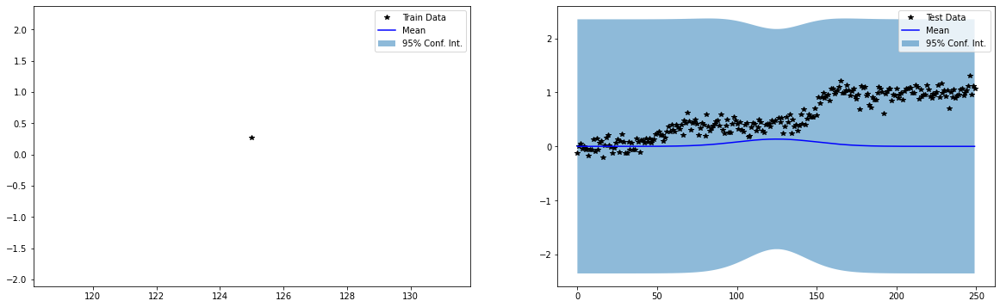

In [8]:
likelihood = gpytorch.likelihoods.GaussianLikelihood()
model = ExactGPModel(train_x, train_y, likelihood)

#set lengthscale
model.covar_module.base_kernel.lengthscale = 25

# Use the adam optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.1)  # Includes GaussianLikelihood parameters

# "Loss" for GPs - the marginal log likelihood
mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

print('BEFORE TRAINING')
print('lengthscale: %.3f   noise: %.3f' % (
    model.covar_module.base_kernel.lengthscale.item(),
    model.likelihood.noise.item()
))
_, test_conf = plot_preds(model, likelihood, False)

In [29]:
np.argmax((test_conf[1]-test_conf[0]).numpy())

0

In [33]:
# def plot_preds(model, likelihood): 
#     model.eval()
#     likelihood.eval()
#     with torch.no_grad():
#         # Initialize plot
#         f, ax = plt.subplots(1, 2, figsize=(20, 6))
#         observed_train_pred = likelihood(model(train_x))
#         observed_test_pred = likelihood(model(test_x))

#         # Get upper and lower confidence bounds
#         train_lower, train_upper = observed_train_pred.confidence_region()
#         test_lower, test_upper = observed_test_pred.confidence_region()

#         # Plot test data as black stars
#         ax[0].plot(train_x.numpy(), train_y.numpy(), 'k*')
#         ax[1].plot(test_x.numpy(), test_y.numpy(), 'k*')

#         # Plot predictive means as blue line
#         ax[0].plot(train_x.numpy(), observed_train_pred.mean.numpy(), 'b')
#         ax[1].plot(test_x.numpy(), observed_test_pred.mean.numpy(), 'b')

#         # Shade between the lower and upper confidence bounds
#         ax[0].fill_between(train_x.numpy(), train_lower.numpy(), train_upper.numpy(), alpha=0.5)
#         ax[0].legend(['Train Data', 'Mean', '95% Conf. Int.'])
# #         ax[0].set_ylim([-0.3, 1.3])
        
#         ax[1].fill_between(test_x.numpy(), test_lower.numpy(), test_upper.numpy(), alpha=0.5)
#         ax[1].legend(['Test Data', 'Mean', '95% Conf. Int.'])
# #         ax[1].set_ylim([-0.3, 1.3])
#         plt.show()
    
#         max_posterior_variance_test = np.argmax((test_upper - test_lower).numpy())
        
        
#         return(observed_train_pred.mean.numpy(), observed_test_pred.mean.numpy(), max_posterior_variance_test)

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


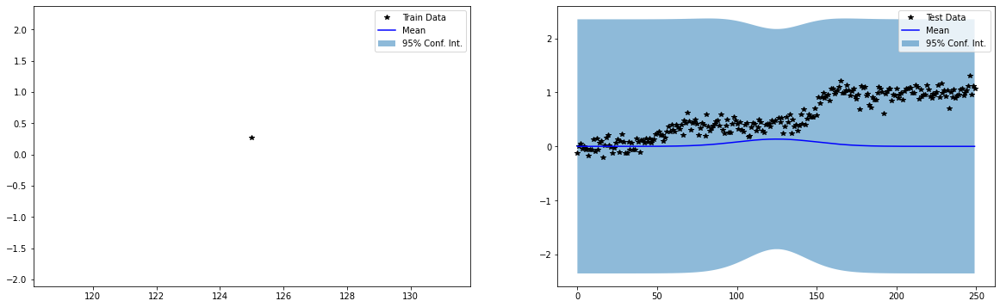

BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


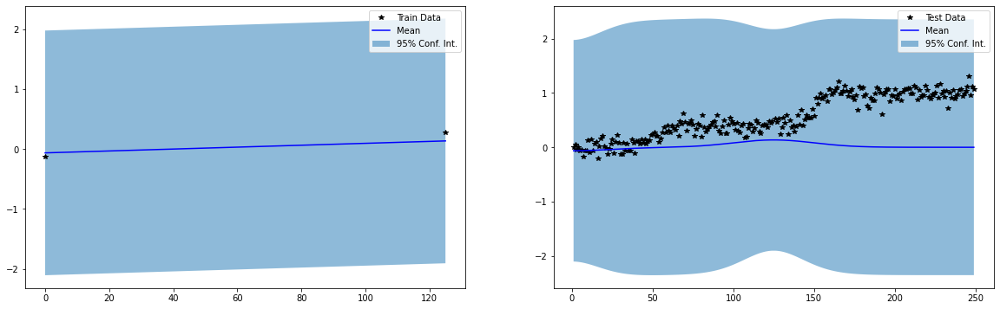

BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


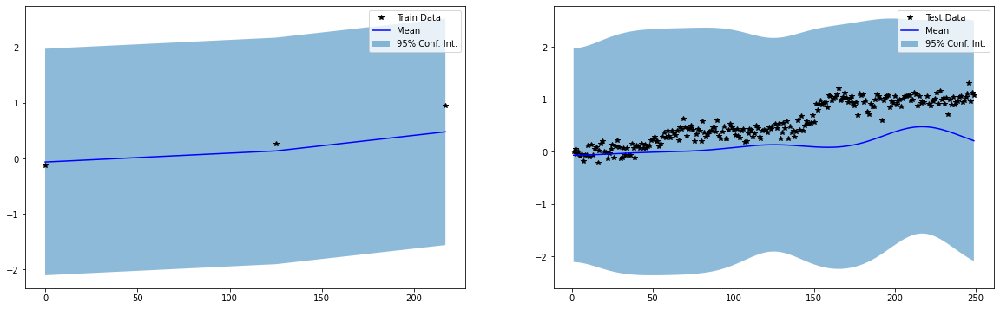

BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


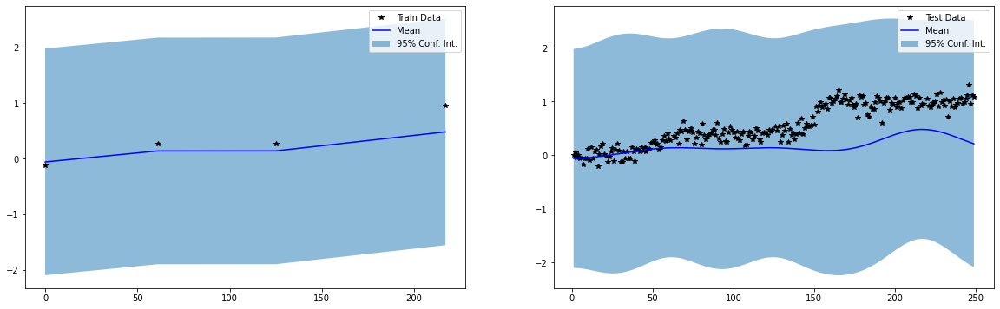

BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


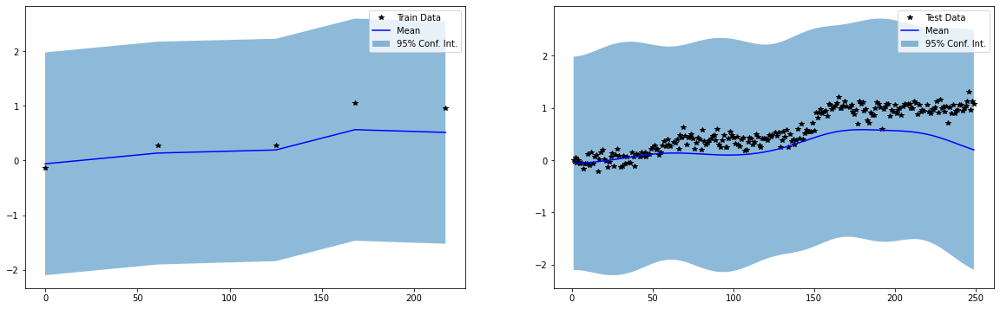

BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


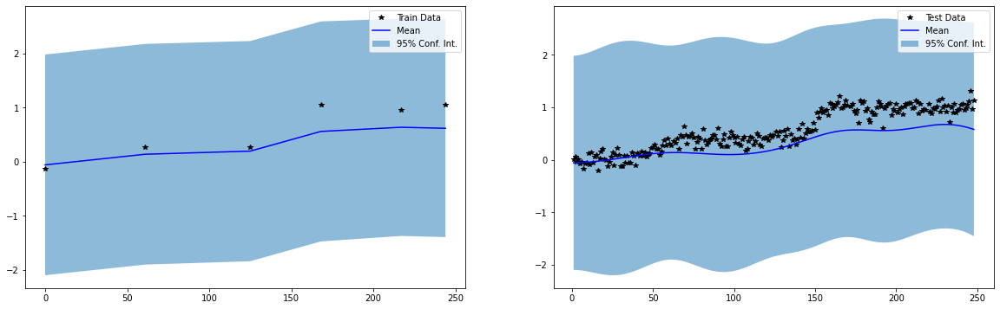

BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


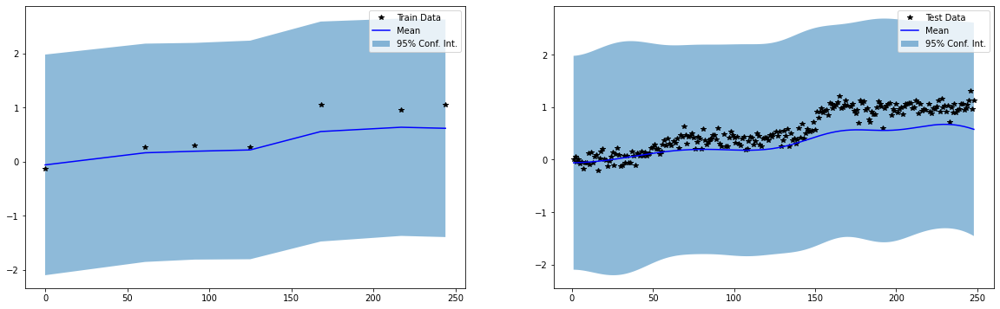

BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


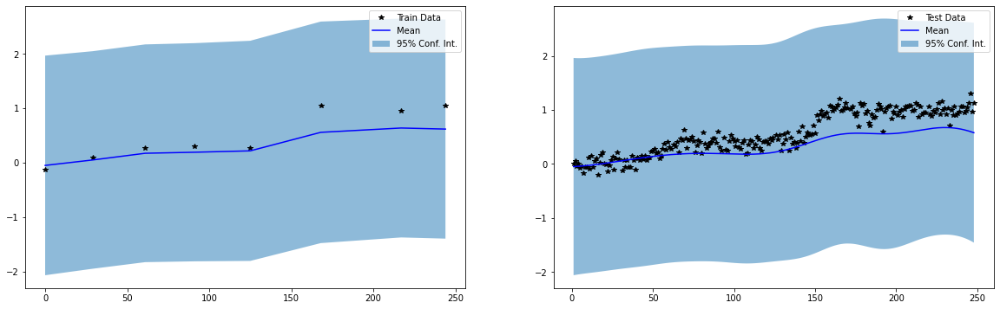

BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


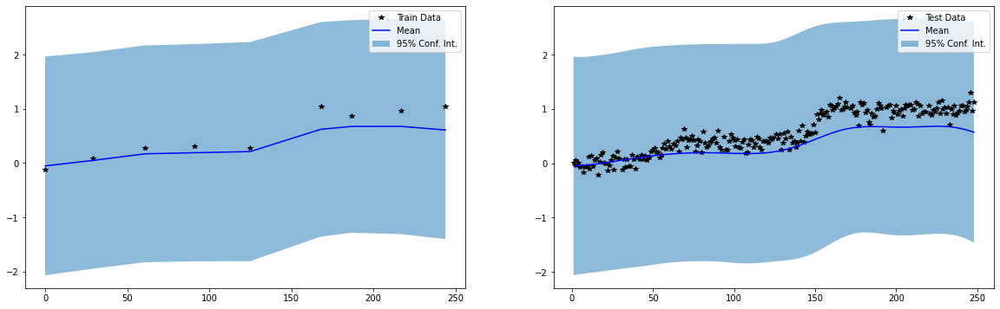

BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


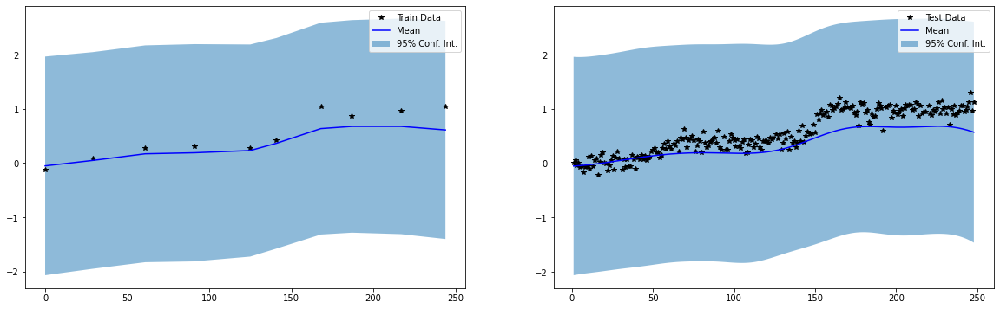

BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


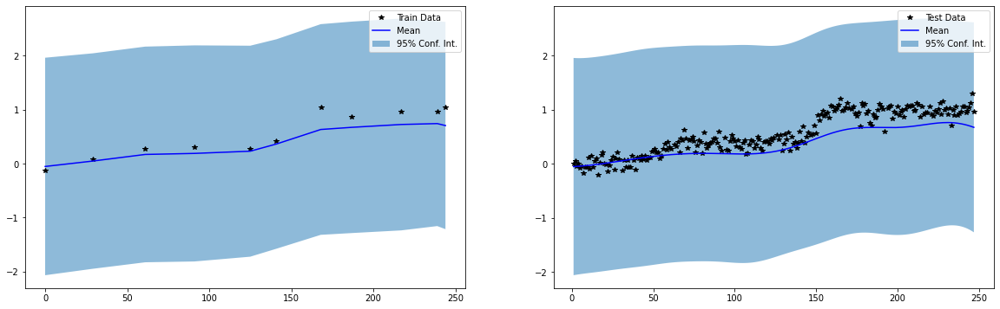

BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


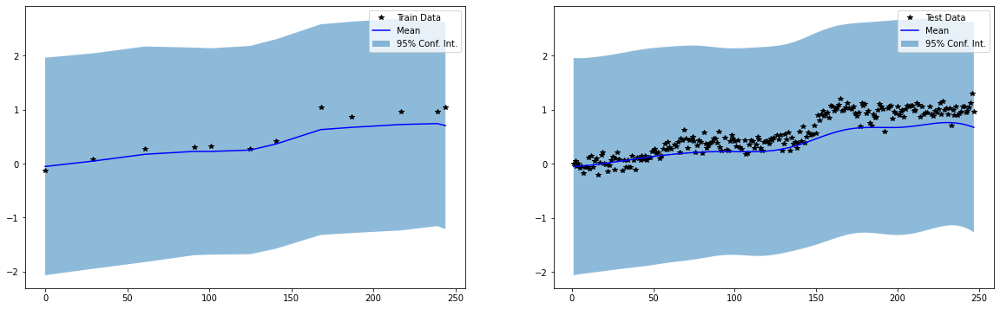

BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


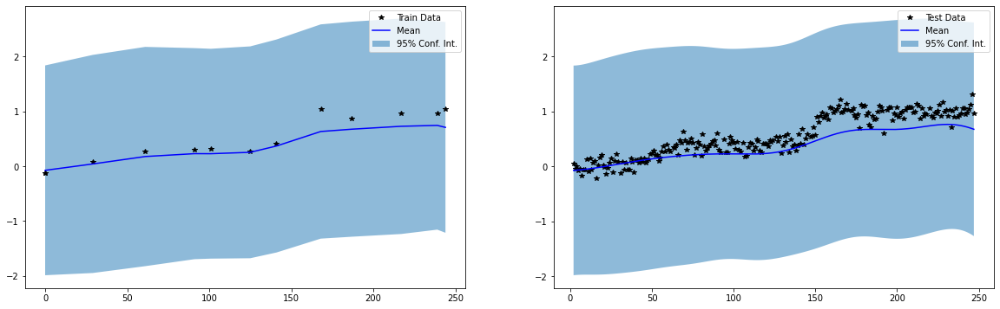

BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


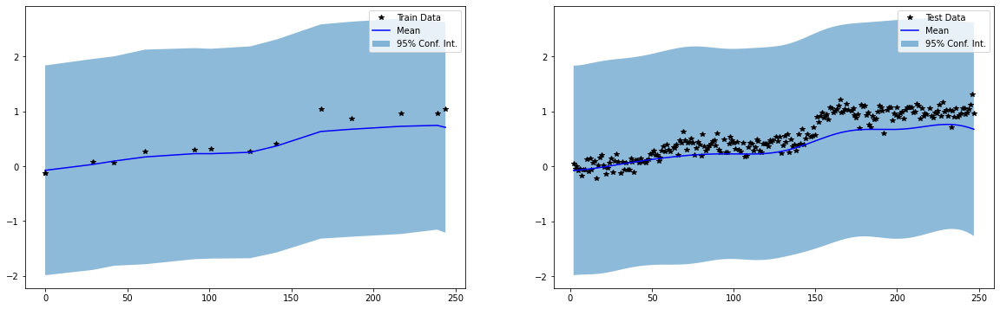

BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


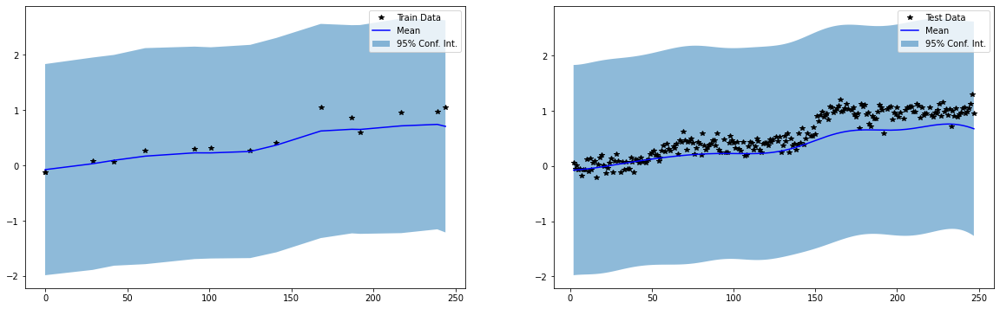

BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


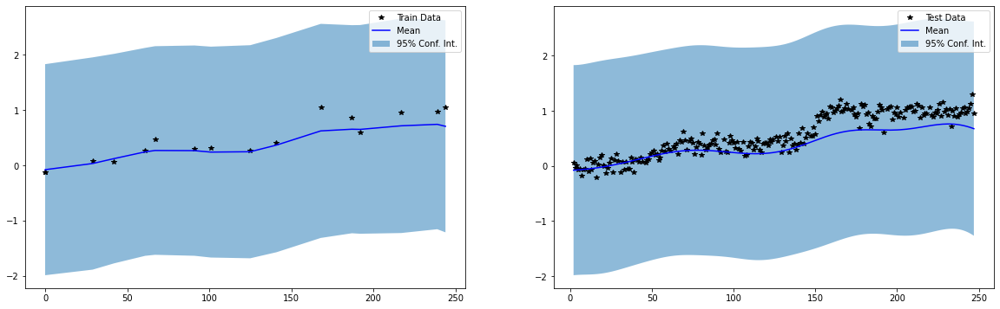

BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


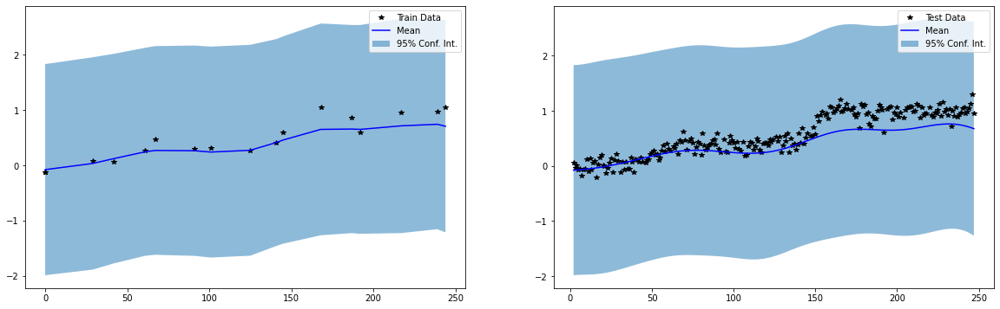

BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


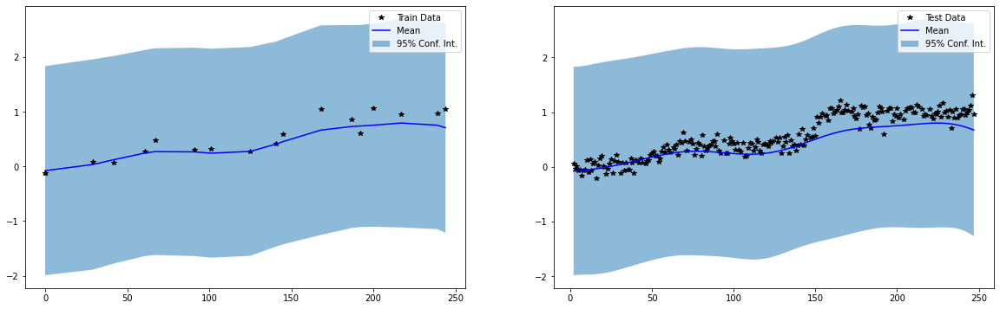

BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


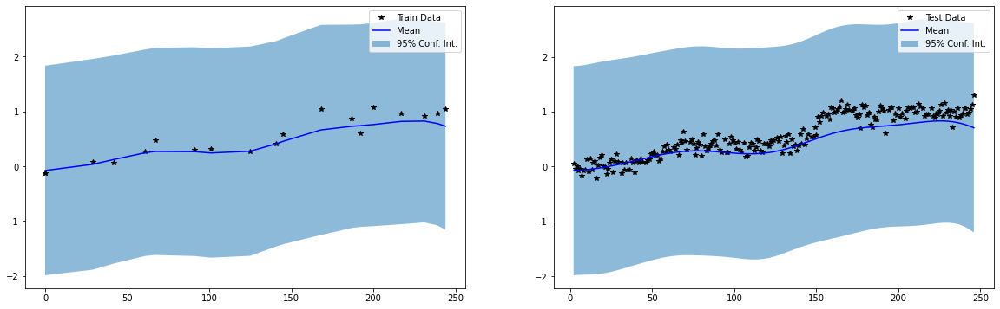

BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


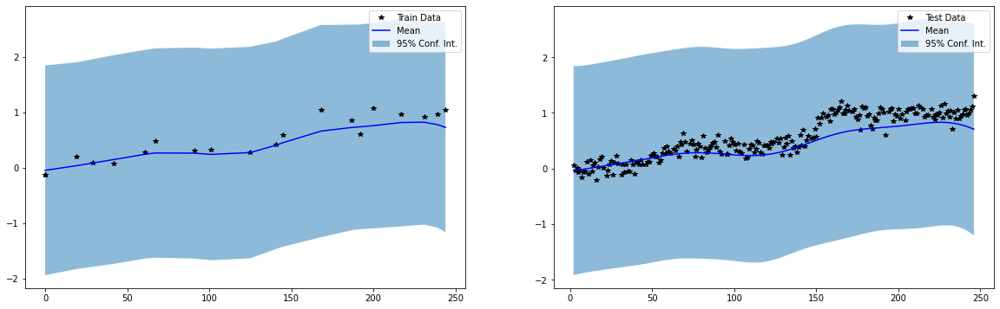

In [9]:
train_samples = [125]
test_samples = np.delete(x, 125).numpy()
for i in range(20):
    train_x, train_y, test_x, test_y = x[train_samples], y[train_samples], x[test_samples], y[test_samples]
    train_x, train_y = train_x[train_x.argsort()], train_y[train_x.argsort()]
    test_x, test_y = test_x[test_x.argsort()], test_y[test_x.argsort()]
    
    likelihood = gpytorch.likelihoods.GaussianLikelihood()
    model = ExactGPModel(train_x, train_y, likelihood)

    #set lengthscale
    model.covar_module.base_kernel.lengthscale = 25

    # Use the adam optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=0.1)  # Includes GaussianLikelihood parameters

    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    print('BEFORE TRAINING')
    print('{} TRAINING POINTS'.format(len(train_samples)))
    print('lengthscale: %.3f   noise: %.3f' % (
        model.covar_module.base_kernel.lengthscale.item(),
        model.likelihood.noise.item()
    ))
    
    train_mean, test_mean, max_posterior_variance_test = plot_preds(model, likelihood, True)
    
    train_samples.append(max_posterior_variance_test)
    test_samples = np.delete(test_samples, max_posterior_variance_test)

BEFORE TRAINING
1 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


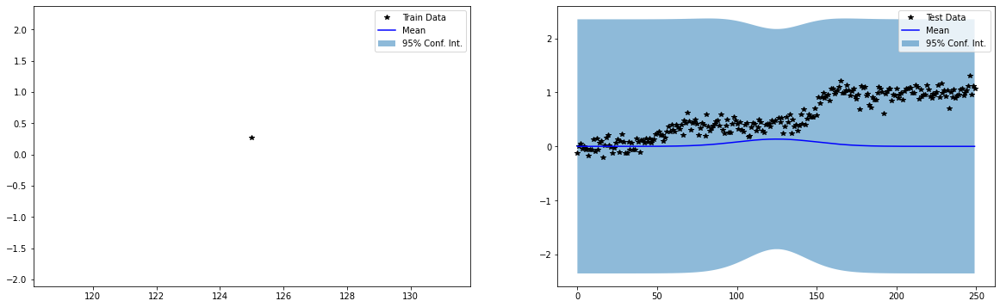

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/gpytorch/lazy/triangular_lazy_tensor.py:130: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at  /Users/distiller/project/pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:1672.)
  res = torch.triangular_solve(right_tensor, self.evaluate(), upper=self.upper).solution


Iter 0/500 - Loss: 1.109   lengthscale: 25.000   noise: 0.644


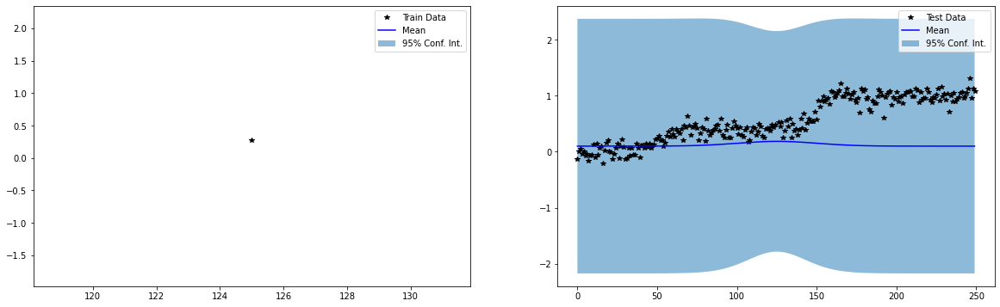

Iter 50/500 - Loss: -1.338   lengthscale: 25.000   noise: 0.005


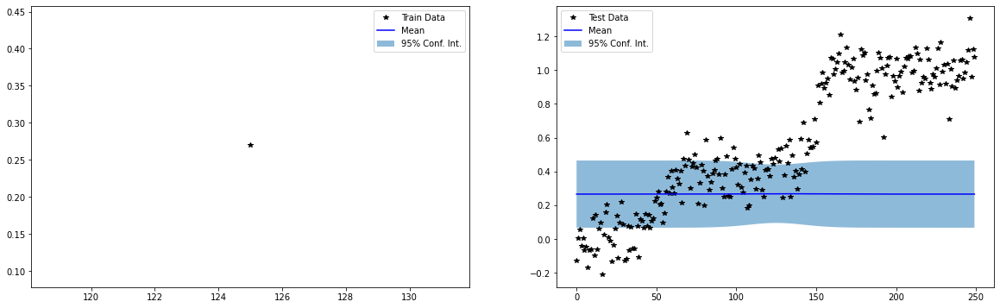

Iter 100/500 - Loss: -3.250   lengthscale: 25.000   noise: 0.000


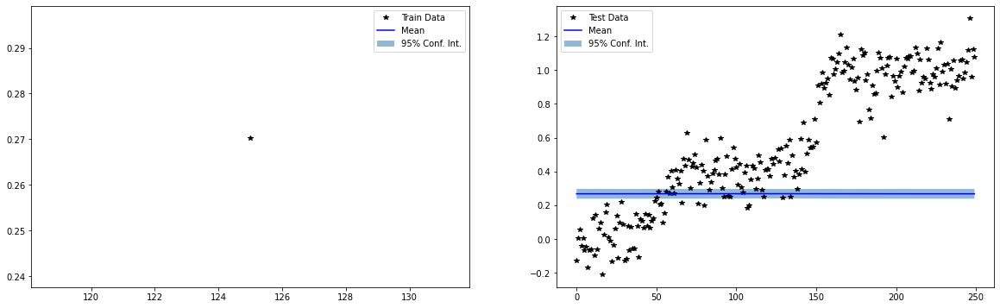

Iter 150/500 - Loss: -3.591   lengthscale: 25.000   noise: 0.000


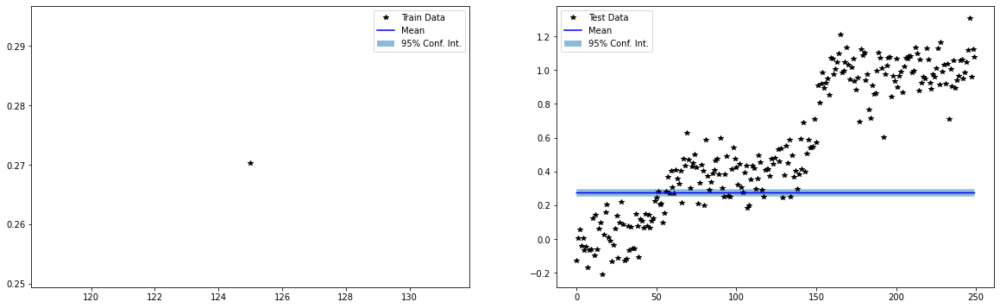

Iter 200/500 - Loss: -3.603   lengthscale: 25.000   noise: 0.000


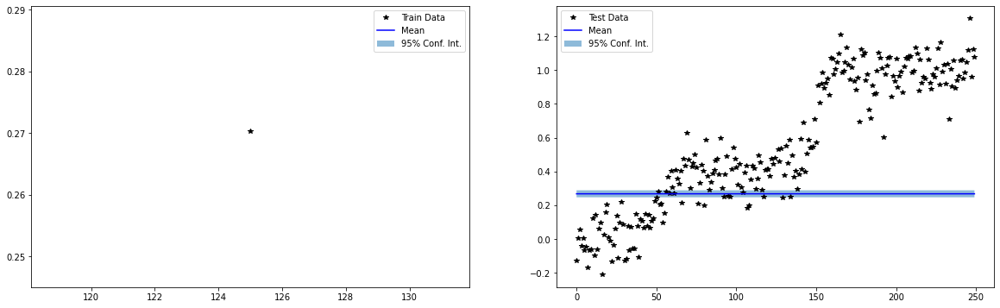

Iter 250/500 - Loss: -3.638   lengthscale: 25.000   noise: 0.000


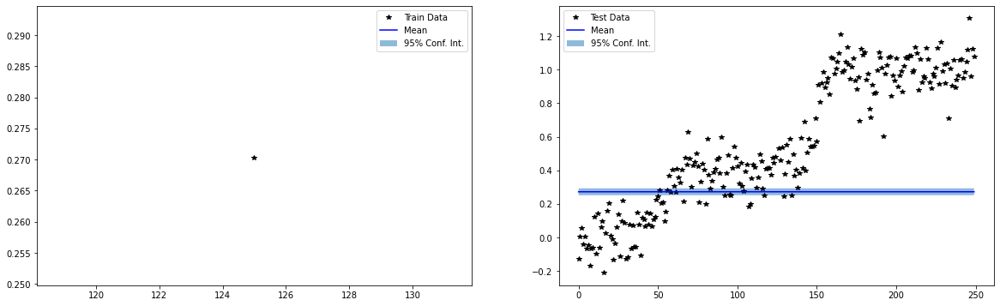

Iter 300/500 - Loss: -3.613   lengthscale: 25.000   noise: 0.000


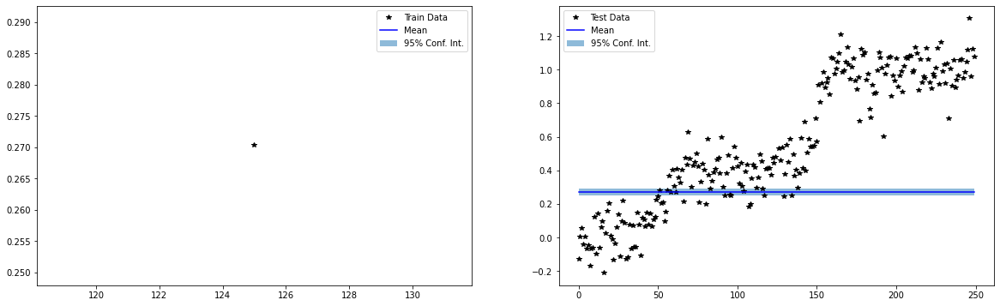

Iter 350/500 - Loss: -3.674   lengthscale: 25.000   noise: 0.000


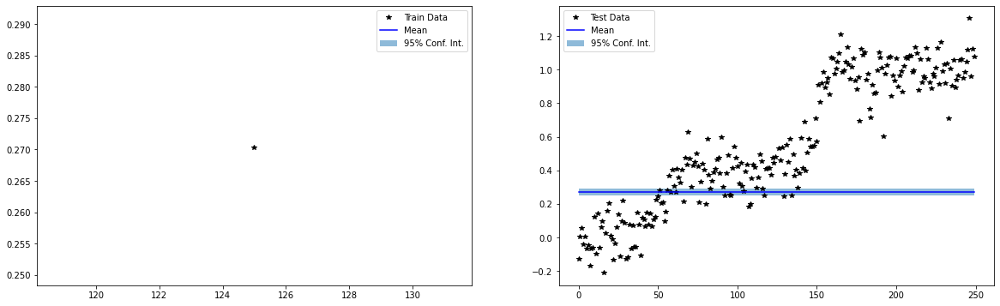

Iter 400/500 - Loss: -3.677   lengthscale: 25.000   noise: 0.000


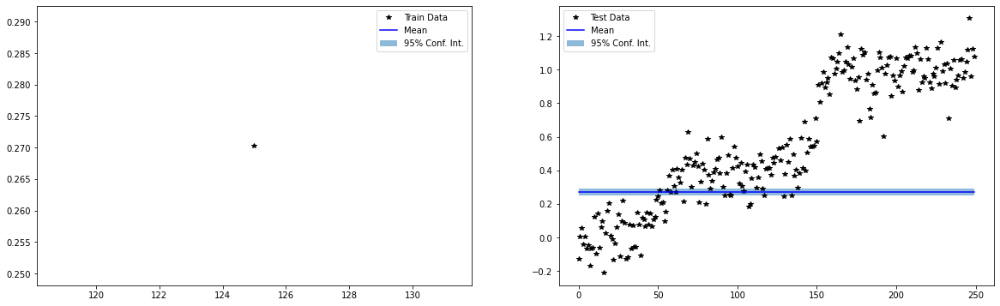

Iter 450/500 - Loss: -3.366   lengthscale: 25.000   noise: 0.000


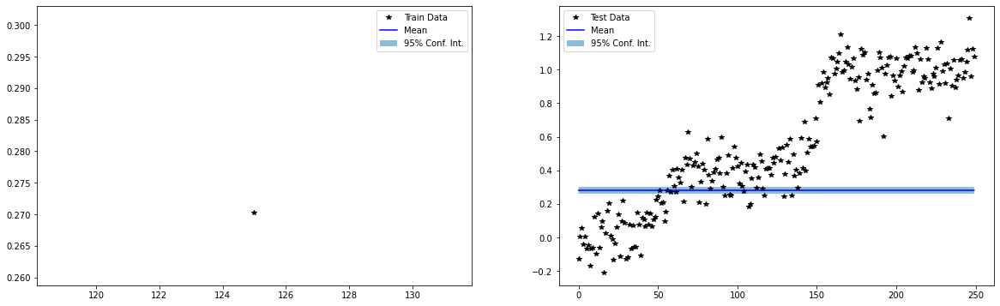

Iter 500/500 - Loss: -3.677   lengthscale: 25.000   noise: 0.000


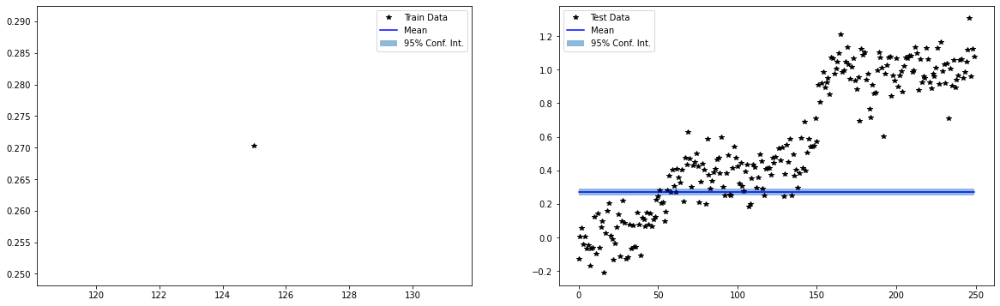

Train RMSE: 2.8192996978759766e-05, Test RMSE: 0.48586225509643555
BEFORE TRAINING
2 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


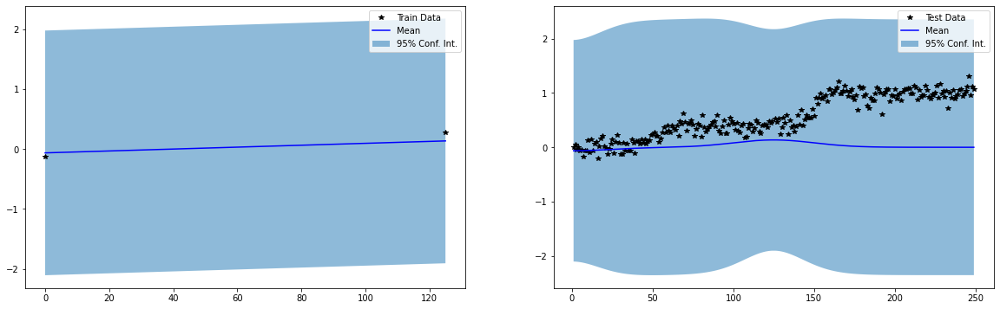

Iter 0/500 - Loss: 1.098   lengthscale: 24.930   noise: 0.644


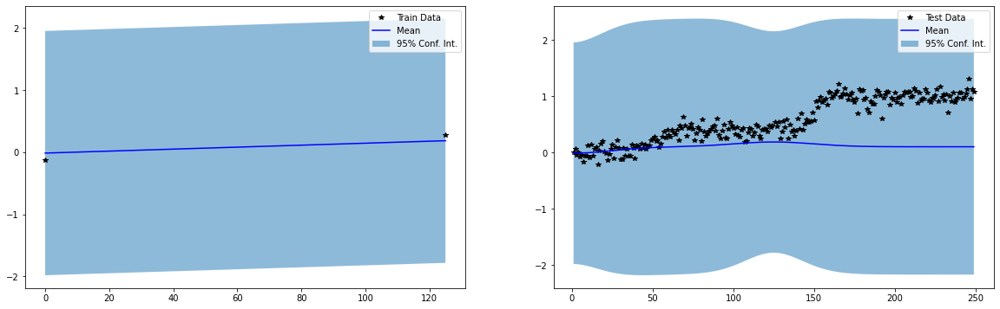

Iter 50/500 - Loss: -0.174   lengthscale: 21.117   noise: 0.015


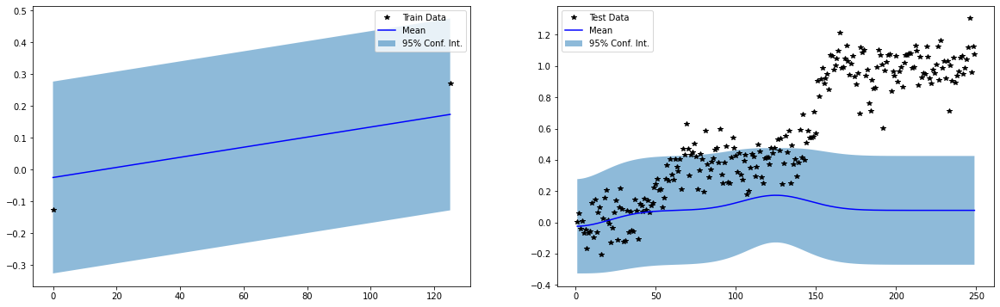

Iter 100/500 - Loss: -0.195   lengthscale: 20.049   noise: 0.019


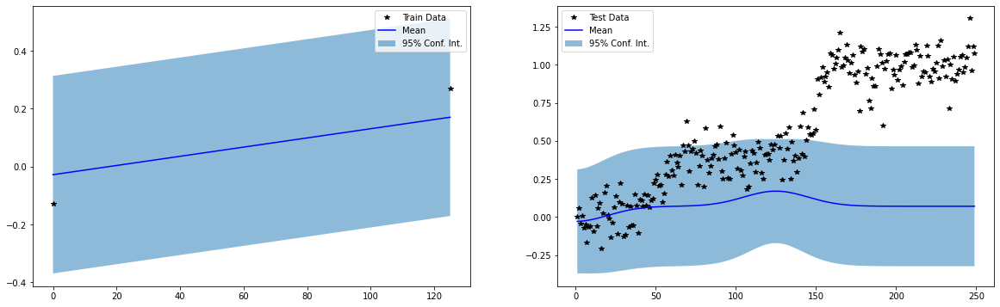

Iter 150/500 - Loss: -0.195   lengthscale: 19.784   noise: 0.020


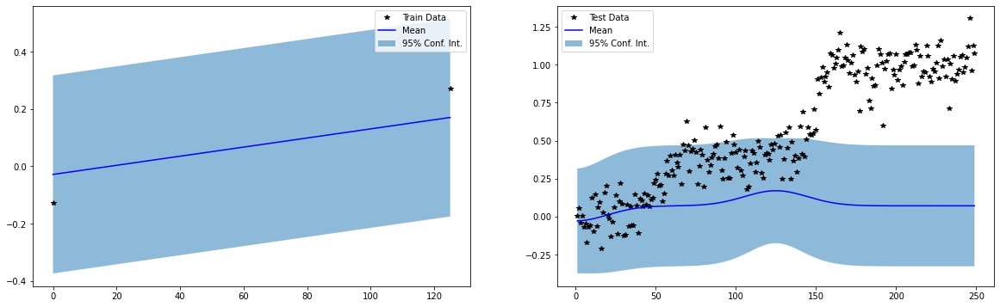

Iter 200/500 - Loss: -0.195   lengthscale: 19.599   noise: 0.020


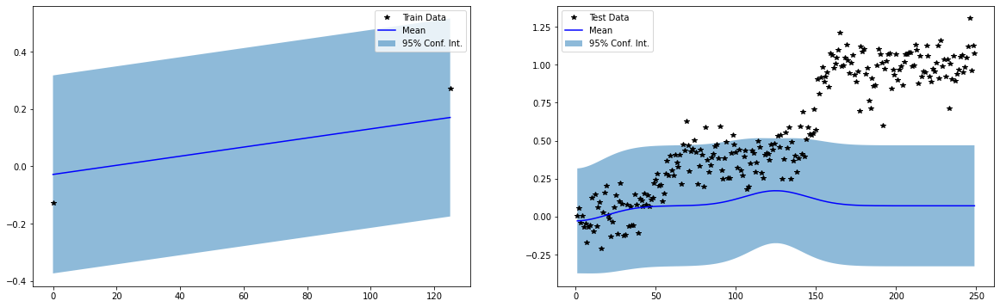

Iter 250/500 - Loss: -0.194   lengthscale: 19.454   noise: 0.020


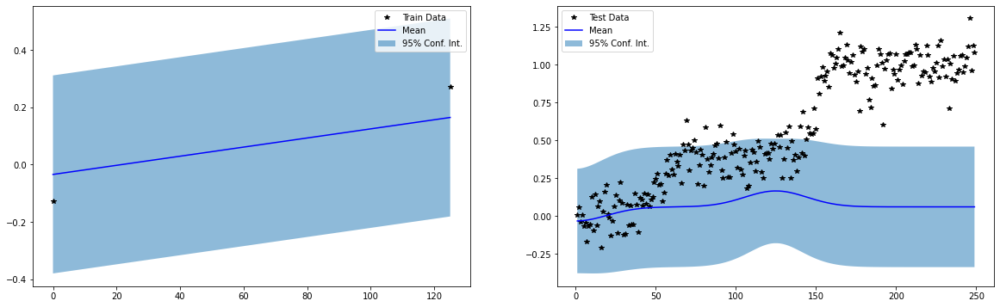

Iter 300/500 - Loss: -0.195   lengthscale: 19.335   noise: 0.020


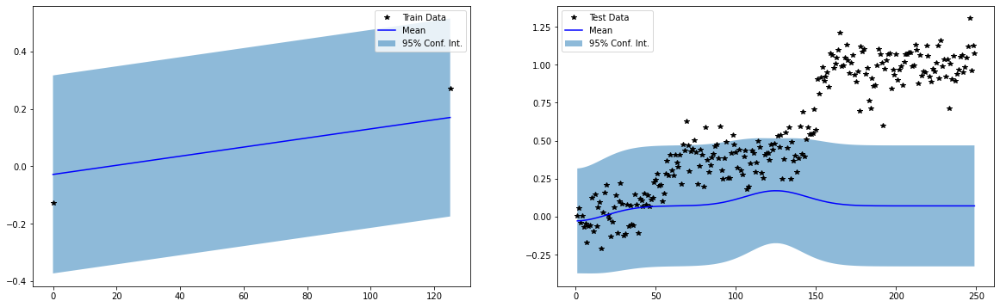

Iter 350/500 - Loss: -0.195   lengthscale: 19.236   noise: 0.020


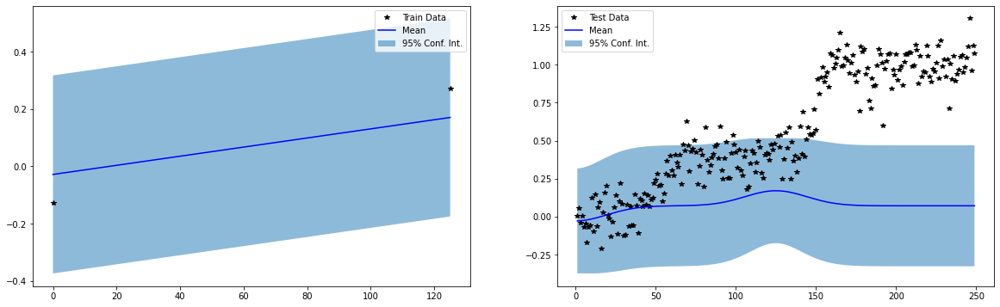

Iter 400/500 - Loss: -0.195   lengthscale: 19.150   noise: 0.020


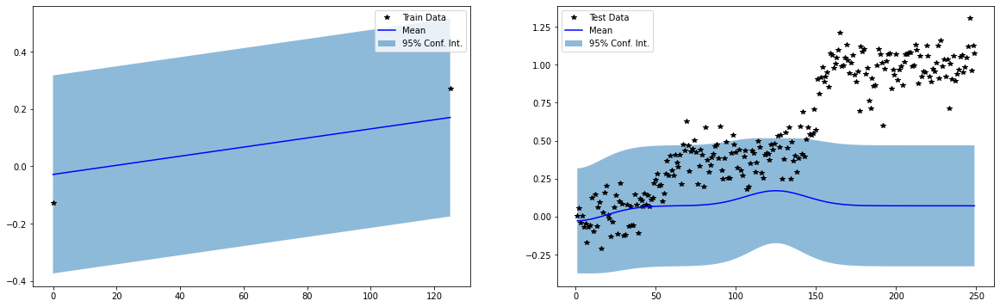

Iter 450/500 - Loss: -0.195   lengthscale: 19.075   noise: 0.020


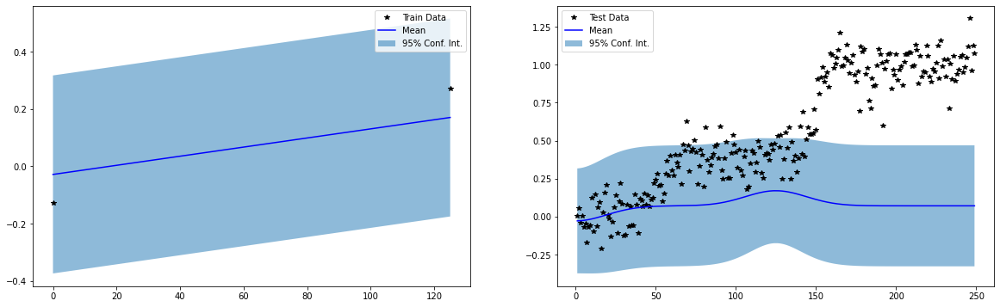

Iter 500/500 - Loss: -0.195   lengthscale: 19.008   noise: 0.020


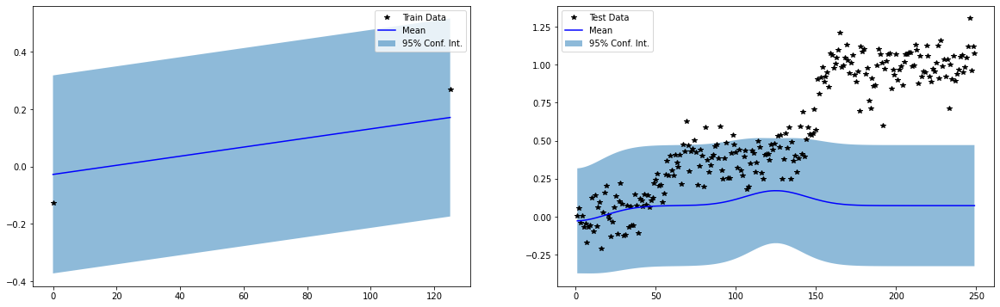

Train RMSE: 0.09983637183904648, Test RMSE: 0.6127206087112427
BEFORE TRAINING
3 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


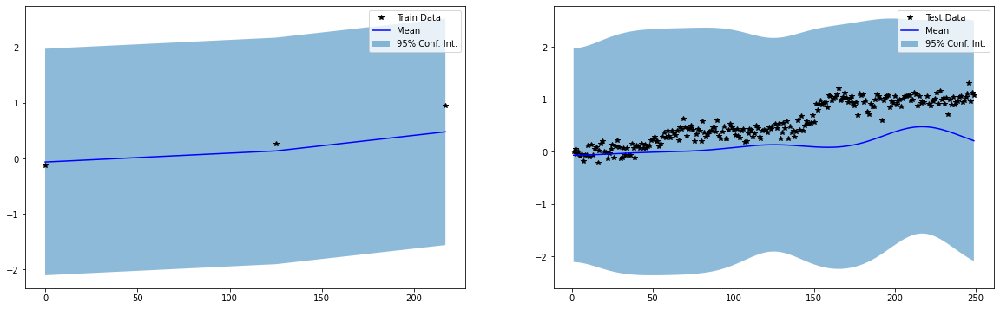

Iter 0/500 - Loss: 1.203   lengthscale: 25.100   noise: 0.644


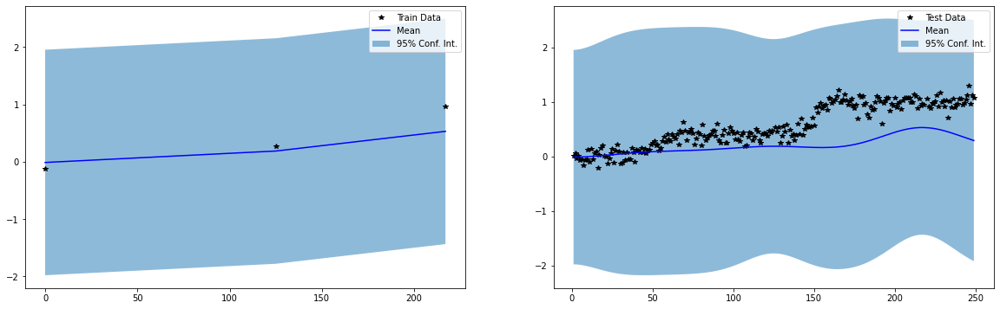

Iter 50/500 - Loss: 0.619   lengthscale: 21.691   noise: 0.111


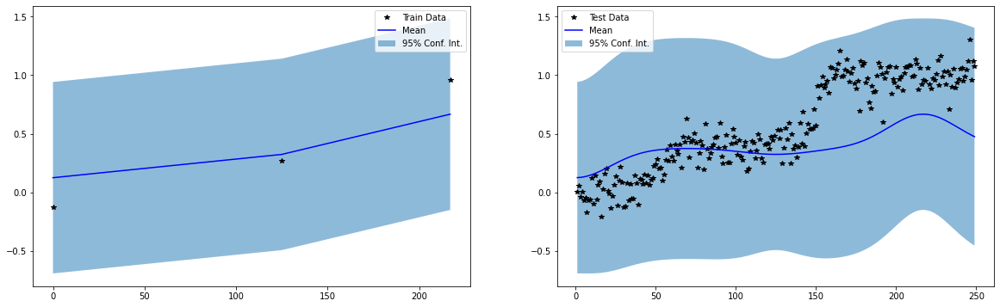

Iter 100/500 - Loss: 0.617   lengthscale: 20.156   noise: 0.100


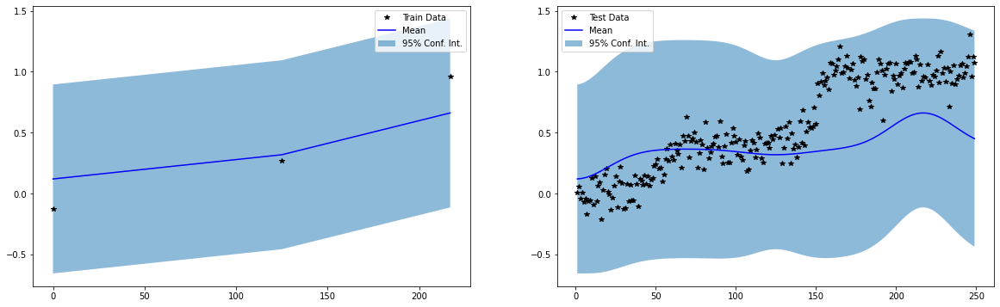

Iter 150/500 - Loss: 0.617   lengthscale: 19.487   noise: 0.101


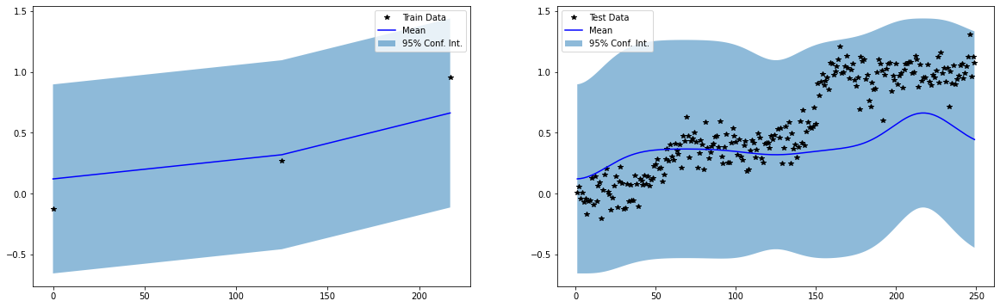

Iter 200/500 - Loss: 0.617   lengthscale: 19.042   noise: 0.101


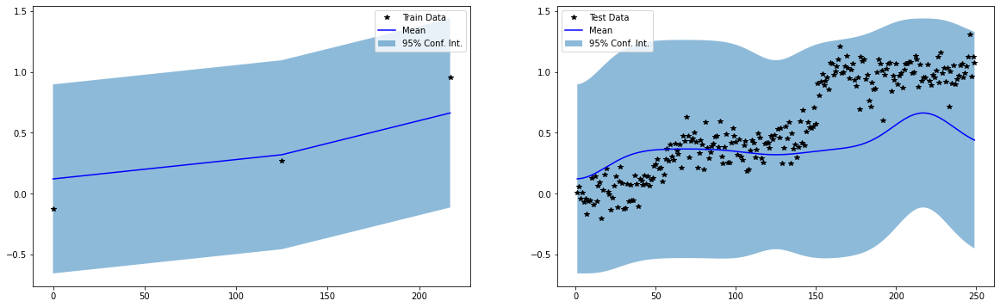

Iter 250/500 - Loss: 0.617   lengthscale: 18.710   noise: 0.101


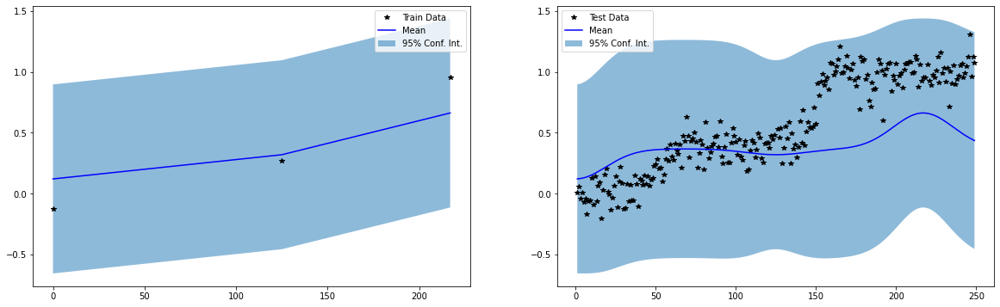

Iter 300/500 - Loss: 0.617   lengthscale: 18.448   noise: 0.101


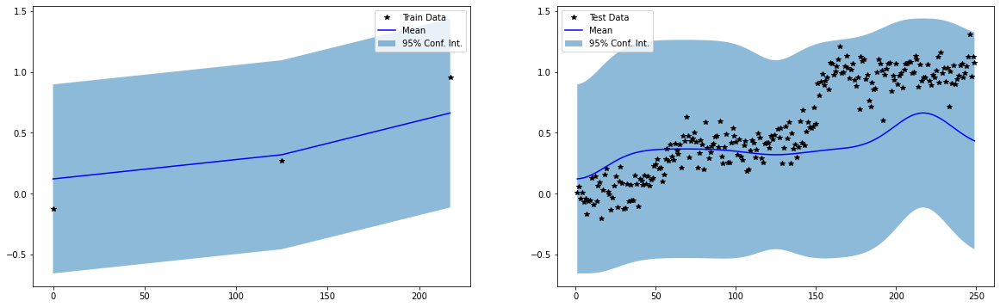

Iter 350/500 - Loss: 0.617   lengthscale: 18.232   noise: 0.101


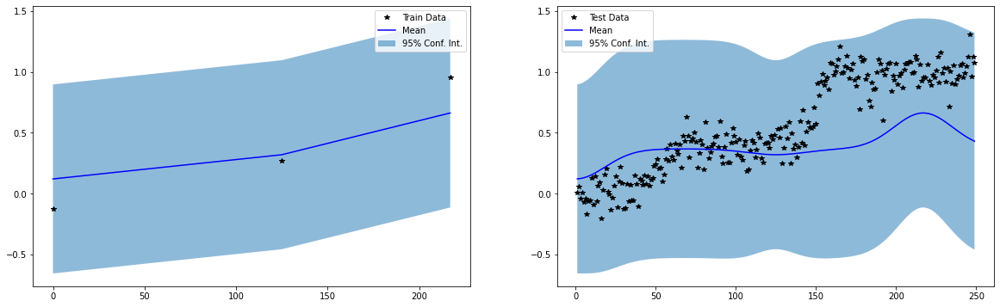

Iter 400/500 - Loss: 0.617   lengthscale: 18.049   noise: 0.101


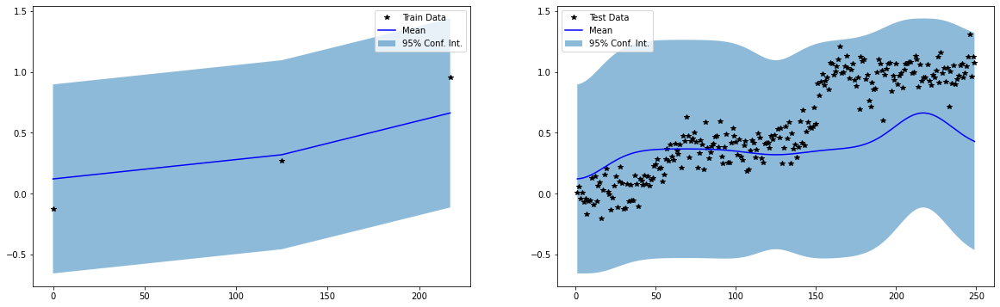

Iter 450/500 - Loss: 0.617   lengthscale: 17.891   noise: 0.101


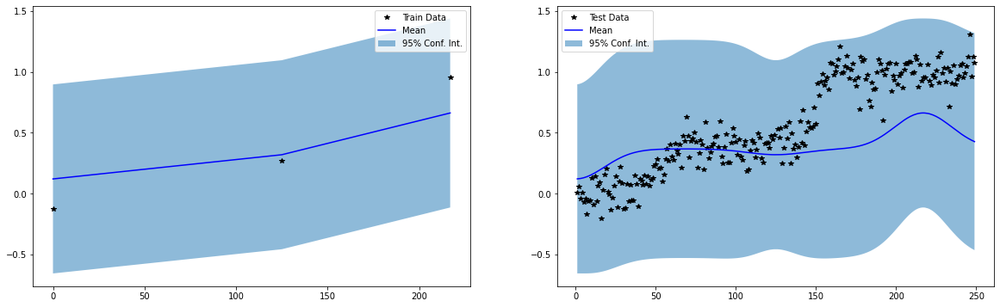

Iter 500/500 - Loss: 0.617   lengthscale: 17.752   noise: 0.101


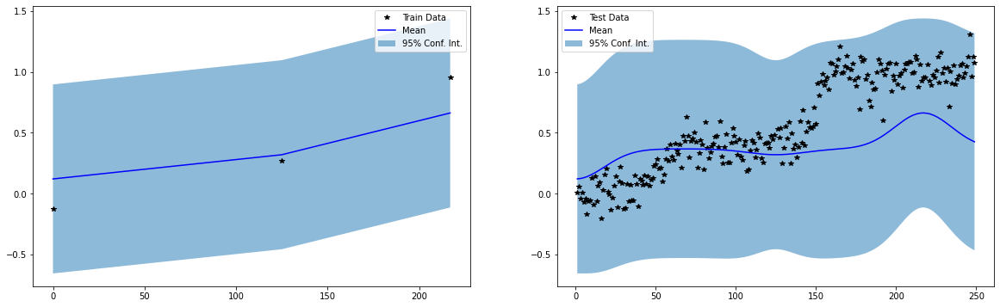

Train RMSE: 0.2244553118944168, Test RMSE: 0.3552544414997101
BEFORE TRAINING
4 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


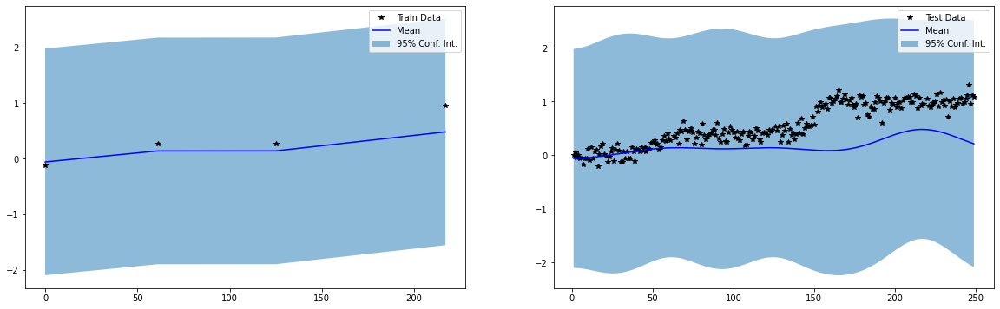

Iter 0/500 - Loss: 1.180   lengthscale: 25.100   noise: 0.644


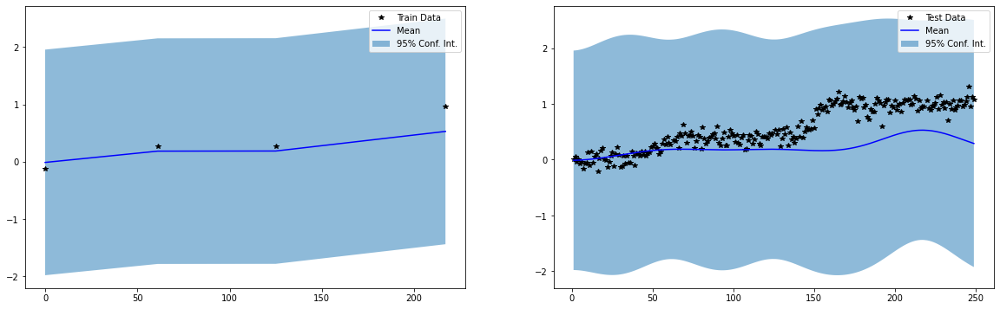

Iter 50/500 - Loss: 0.475   lengthscale: 30.360   noise: 0.078


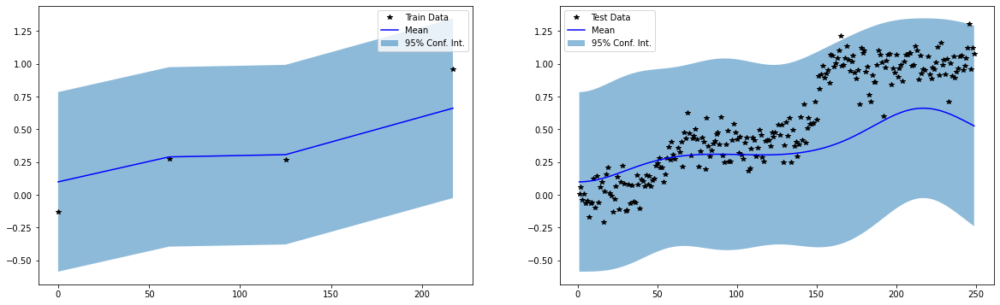

Iter 100/500 - Loss: 0.471   lengthscale: 35.851   noise: 0.064


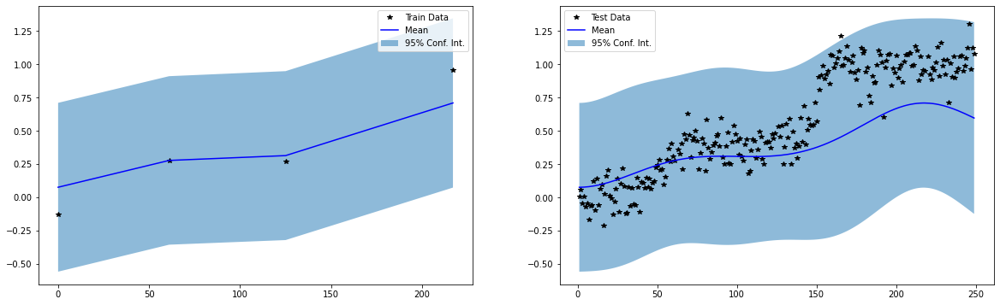

Iter 150/500 - Loss: 0.468   lengthscale: 40.280   noise: 0.048


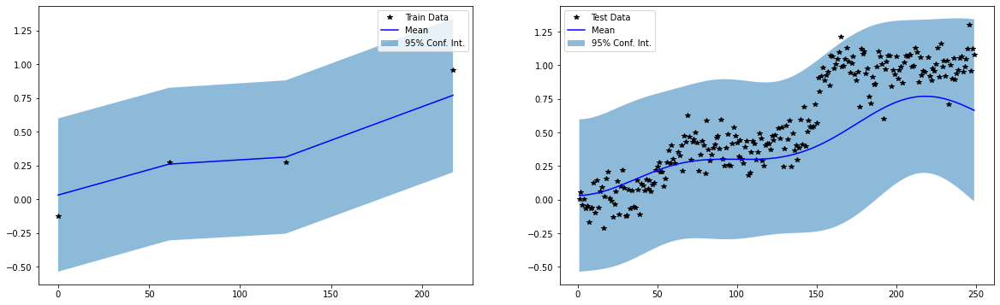

Iter 200/500 - Loss: 0.467   lengthscale: 42.127   noise: 0.037


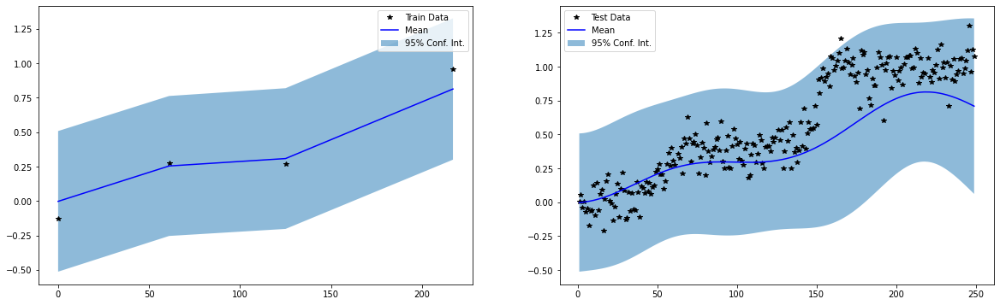

Iter 250/500 - Loss: 0.466   lengthscale: 41.806   noise: 0.031


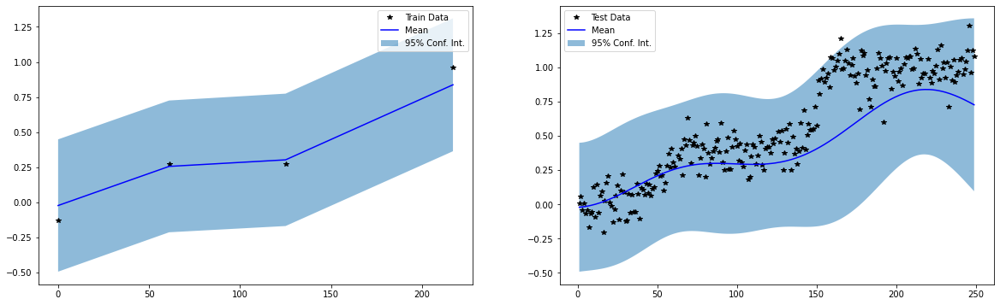

Iter 300/500 - Loss: 0.466   lengthscale: 41.171   noise: 0.026


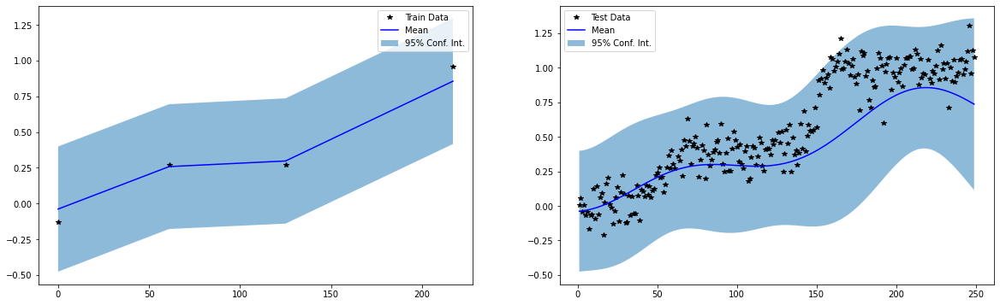

Iter 350/500 - Loss: 0.466   lengthscale: 40.725   noise: 0.023


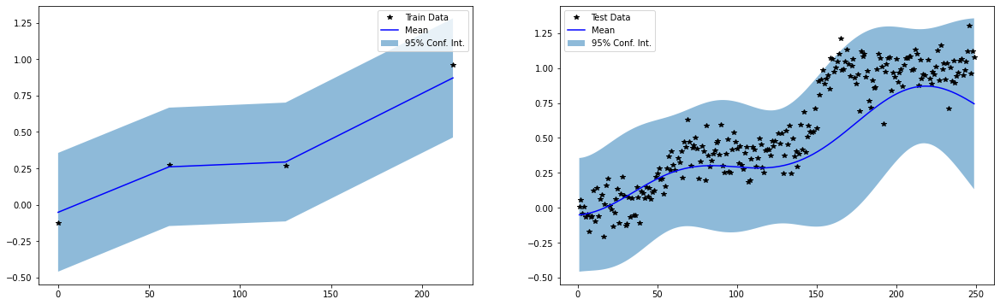

Iter 400/500 - Loss: 0.466   lengthscale: 40.405   noise: 0.019


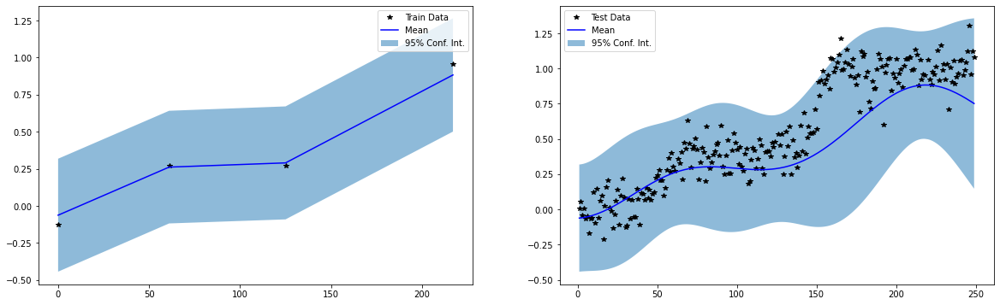

Iter 450/500 - Loss: 0.466   lengthscale: 40.165   noise: 0.017


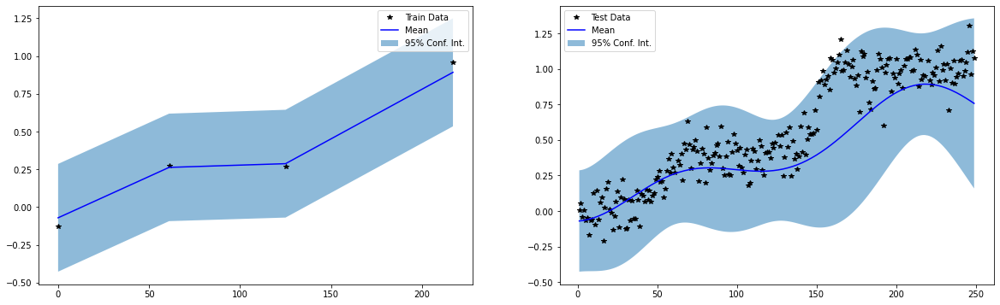

Iter 500/500 - Loss: 0.466   lengthscale: 39.980   noise: 0.015


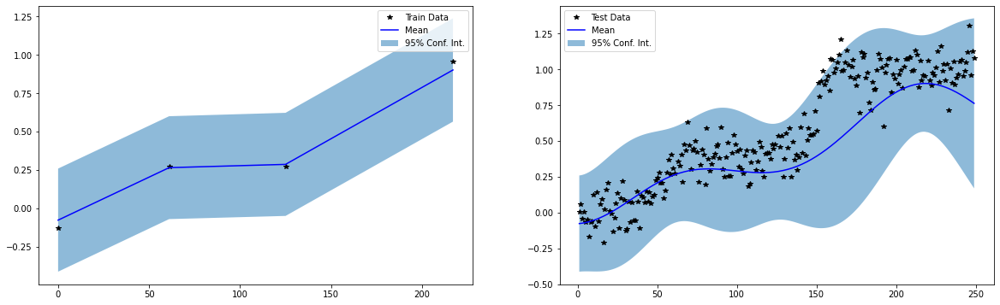

Train RMSE: 0.039091721177101135, Test RMSE: 0.22143588960170746
BEFORE TRAINING
5 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


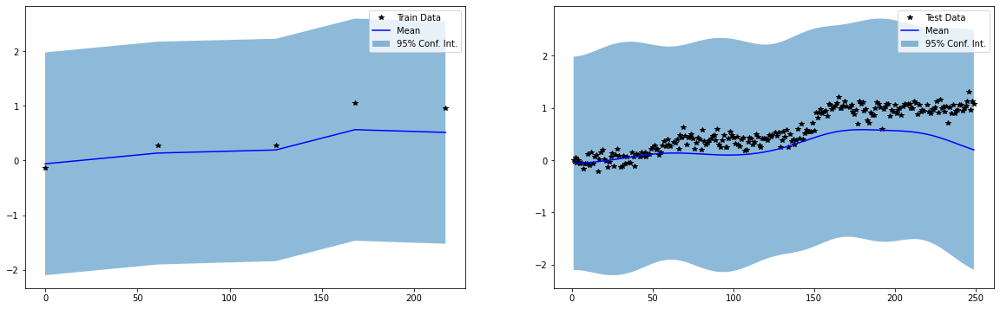

Iter 0/500 - Loss: 1.224   lengthscale: 25.100   noise: 0.644


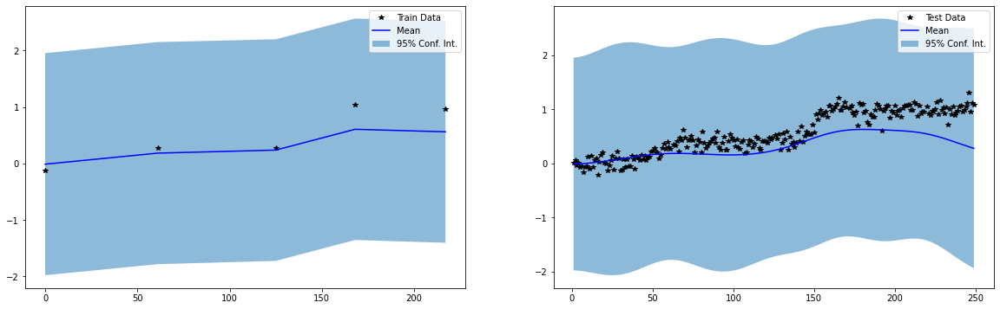

Iter 50/500 - Loss: 0.592   lengthscale: 30.563   noise: 0.084


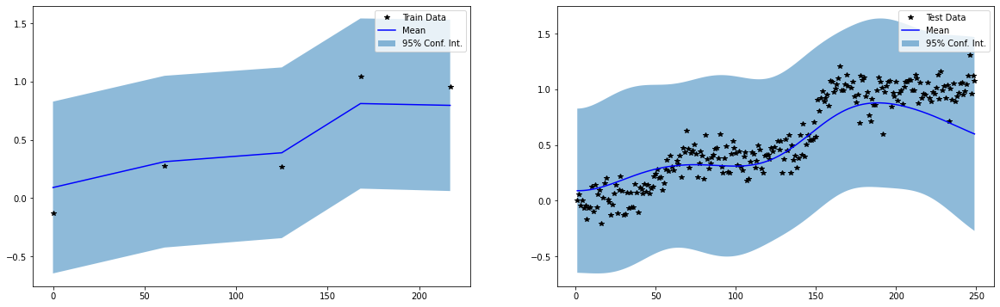

Iter 100/500 - Loss: 0.566   lengthscale: 35.957   noise: 0.040


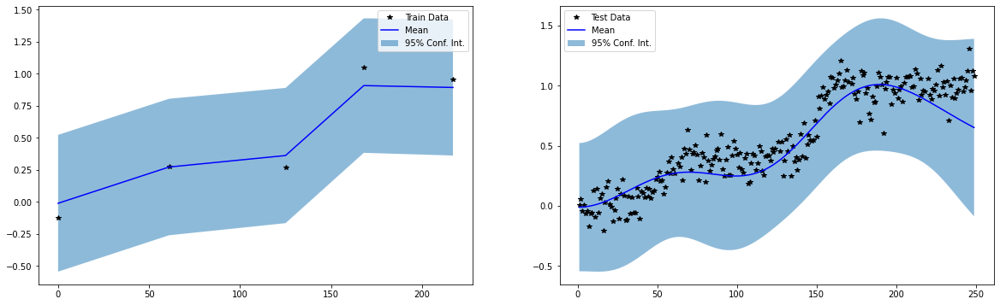

Iter 150/500 - Loss: 0.561   lengthscale: 38.841   noise: 0.031


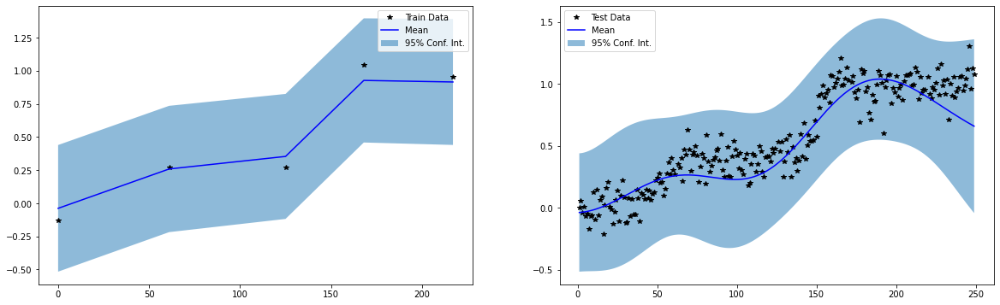

Iter 200/500 - Loss: 0.561   lengthscale: 39.839   noise: 0.036


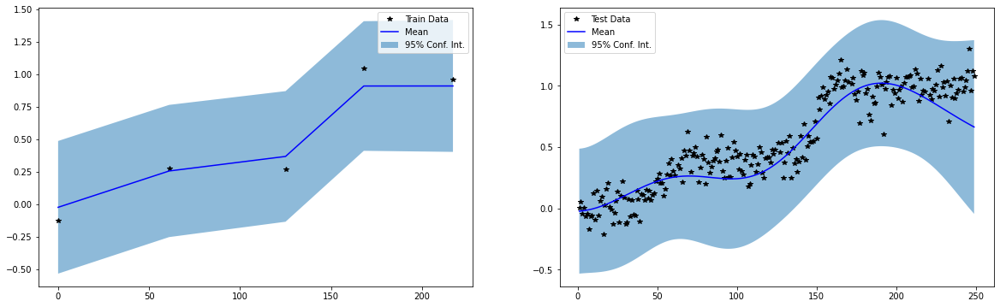

Iter 250/500 - Loss: 0.560   lengthscale: 40.926   noise: 0.043


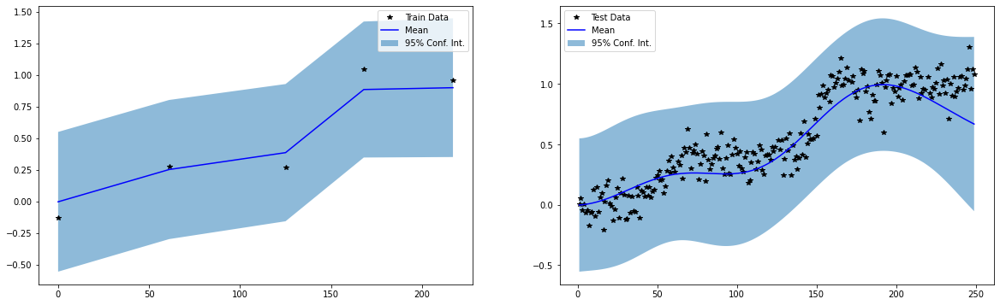

Iter 300/500 - Loss: 0.559   lengthscale: 42.307   noise: 0.050


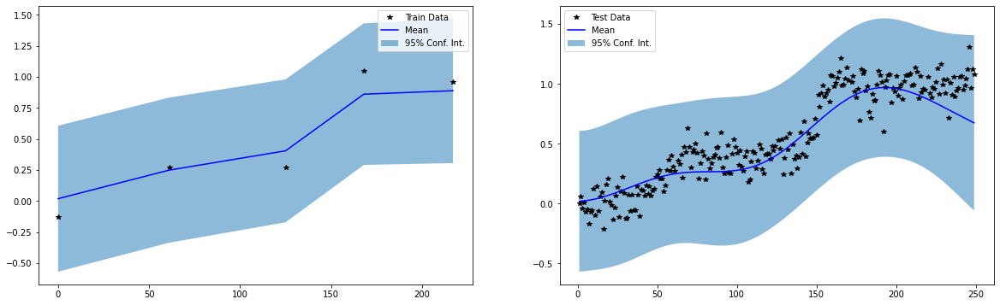

Iter 350/500 - Loss: 0.558   lengthscale: 43.911   noise: 0.056


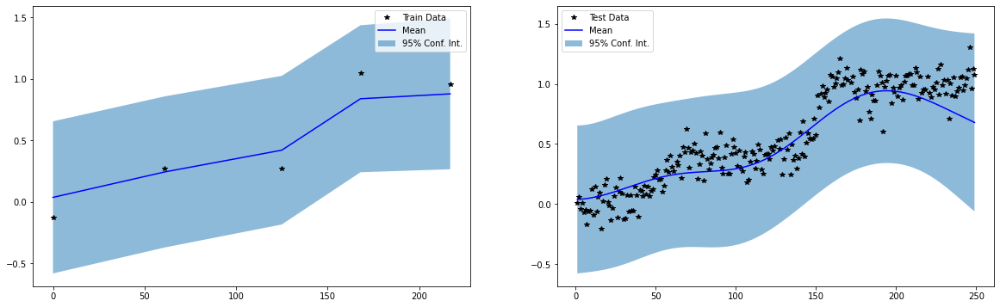

Iter 400/500 - Loss: 0.557   lengthscale: 45.728   noise: 0.062


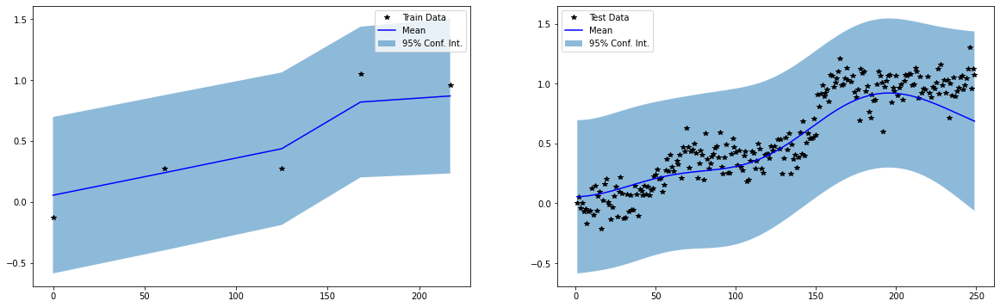

Iter 450/500 - Loss: 0.556   lengthscale: 47.792   noise: 0.067


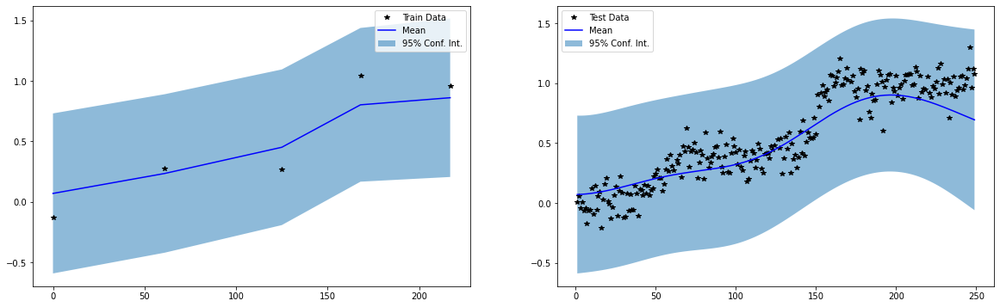

Iter 500/500 - Loss: 0.555   lengthscale: 50.160   noise: 0.071


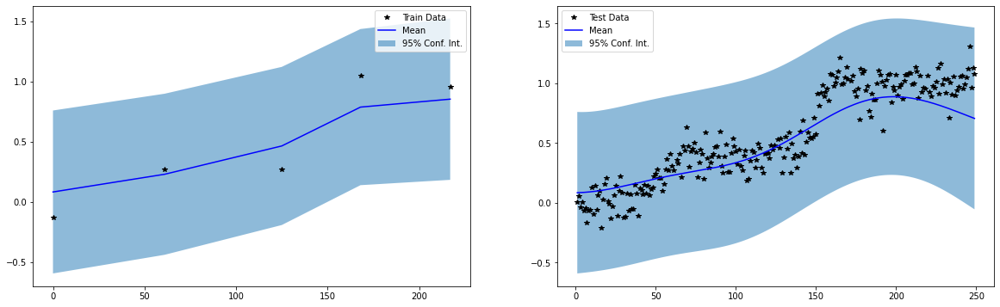

Train RMSE: 0.17997722327709198, Test RMSE: 0.17266806960105896
BEFORE TRAINING
6 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


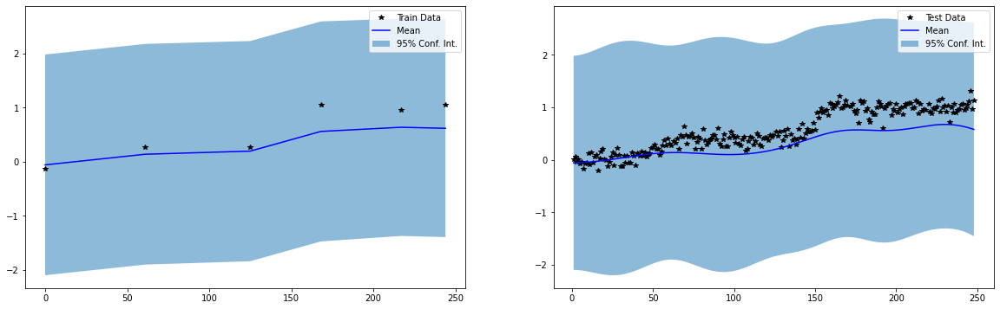

Iter 0/500 - Loss: 1.235   lengthscale: 25.100   noise: 0.644


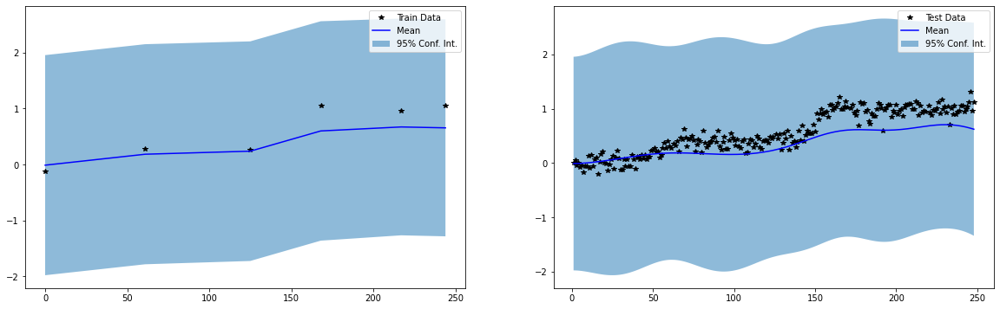

Iter 50/500 - Loss: 0.559   lengthscale: 30.529   noise: 0.050


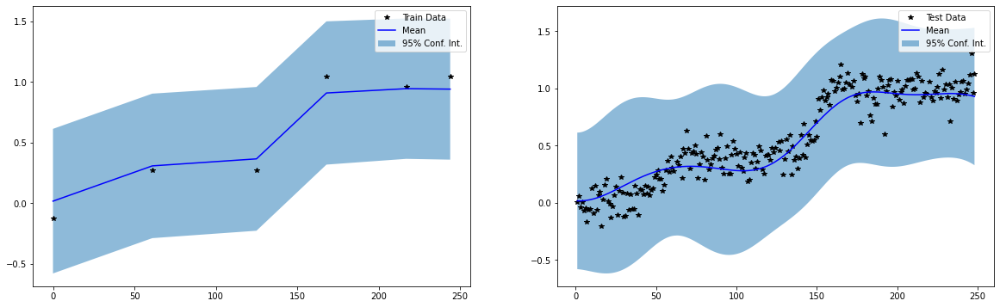

Iter 100/500 - Loss: 0.528   lengthscale: 35.386   noise: 0.021


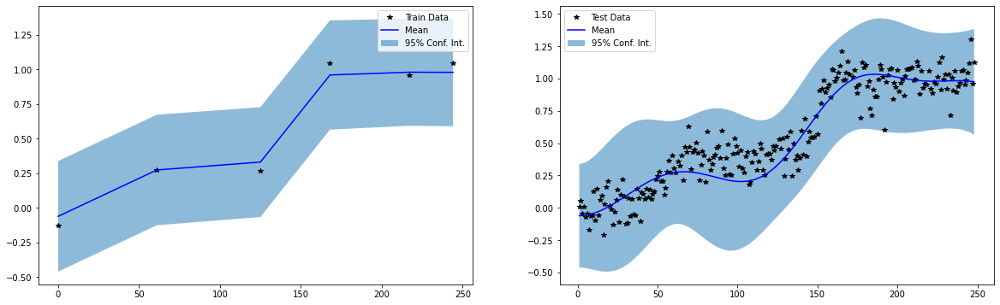

Iter 150/500 - Loss: 0.524   lengthscale: 37.654   noise: 0.025


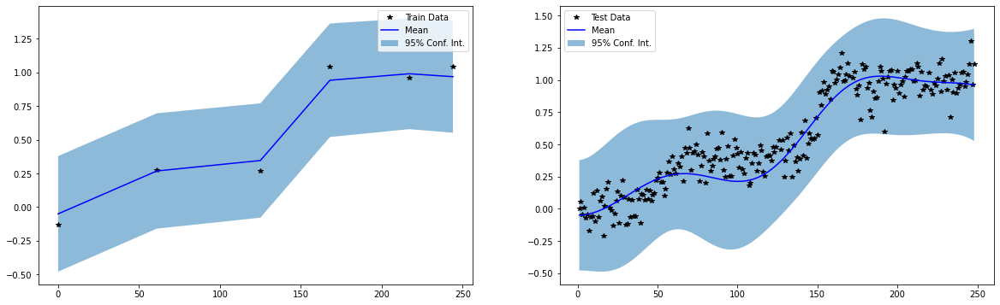

Iter 200/500 - Loss: 0.519   lengthscale: 40.354   noise: 0.036


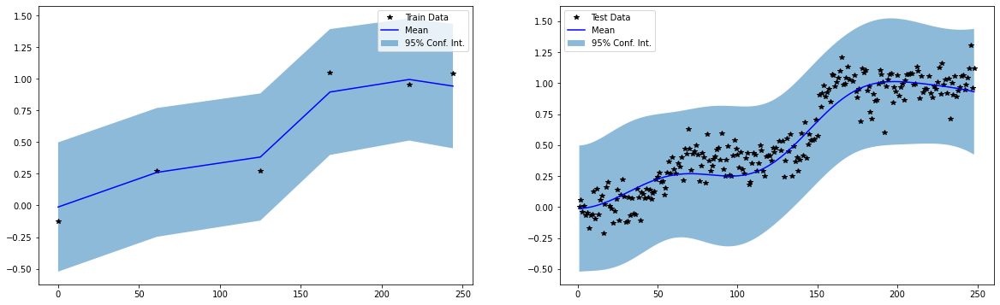

Iter 250/500 - Loss: 0.511   lengthscale: 44.234   noise: 0.045


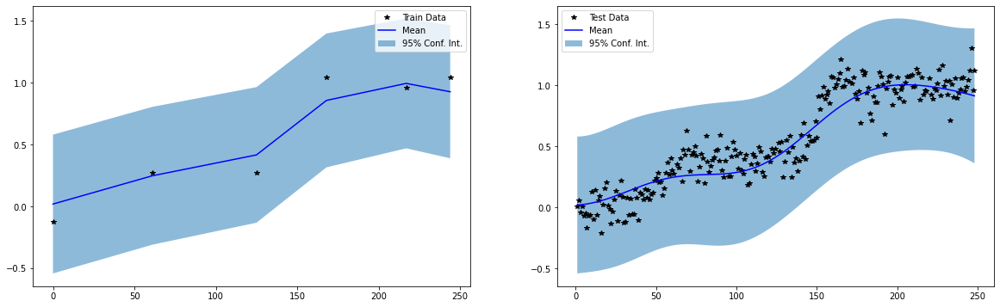

Iter 300/500 - Loss: 0.502   lengthscale: 48.528   noise: 0.051


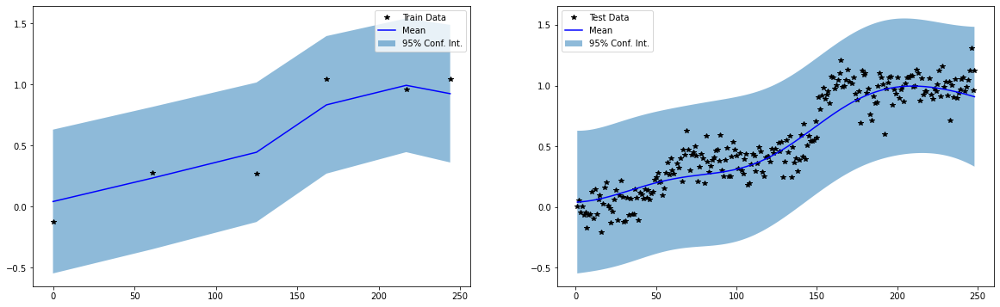

Iter 350/500 - Loss: 0.493   lengthscale: 52.939   noise: 0.054


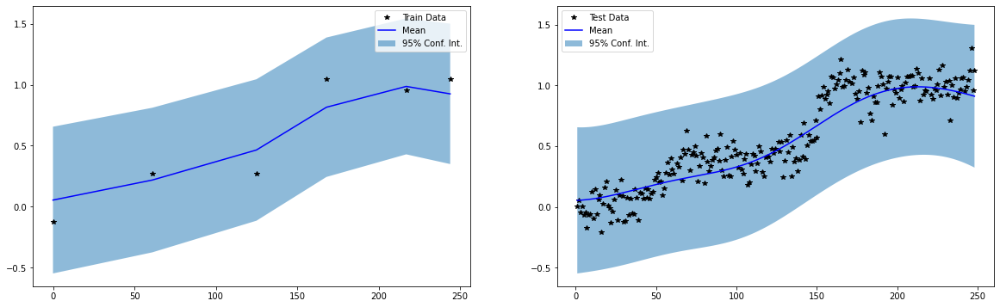

Iter 400/500 - Loss: 0.484   lengthscale: 57.372   noise: 0.056


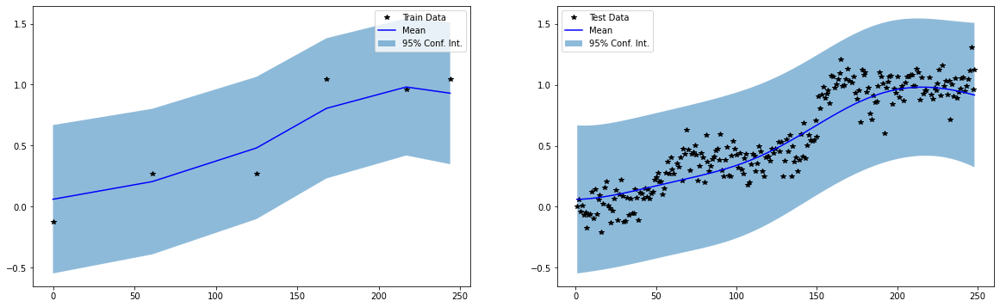

Iter 450/500 - Loss: 0.475   lengthscale: 61.774   noise: 0.056


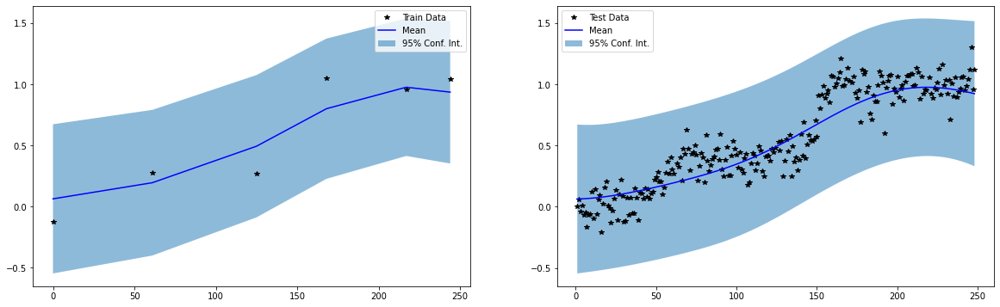

Iter 500/500 - Loss: 0.467   lengthscale: 66.101   noise: 0.057


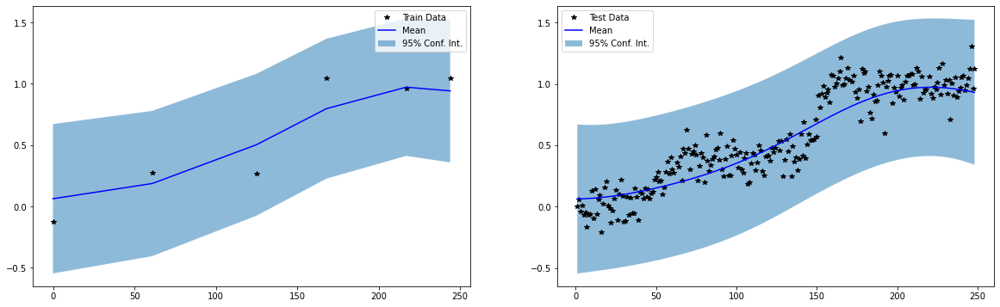

Train RMSE: 0.16869769990444183, Test RMSE: 0.14787594974040985
BEFORE TRAINING
7 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


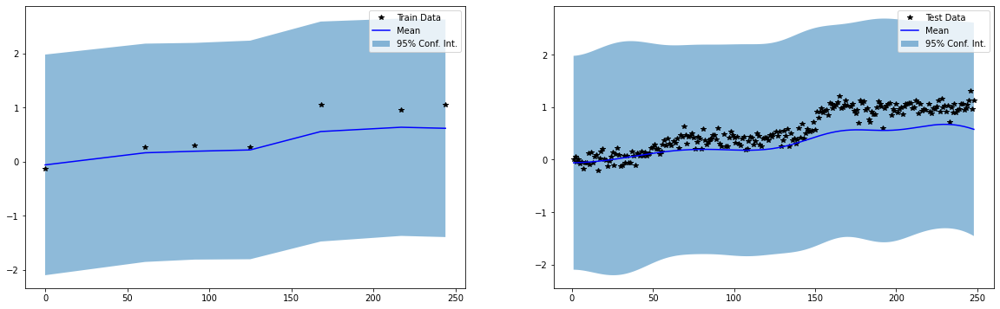

Iter 0/500 - Loss: 1.208   lengthscale: 25.100   noise: 0.644


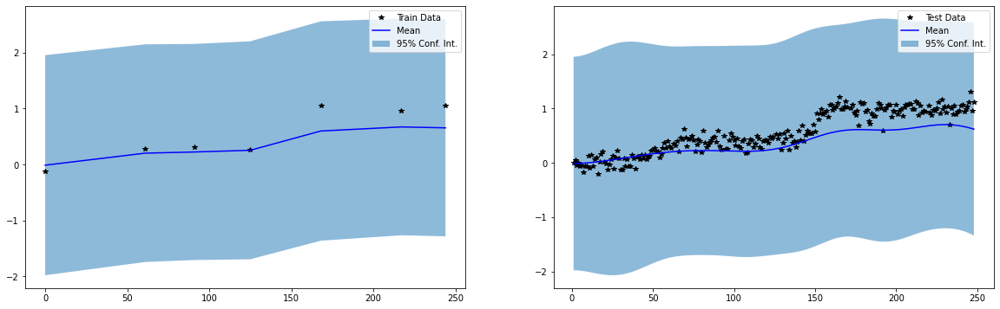

Iter 50/500 - Loss: 0.443   lengthscale: 30.653   noise: 0.031


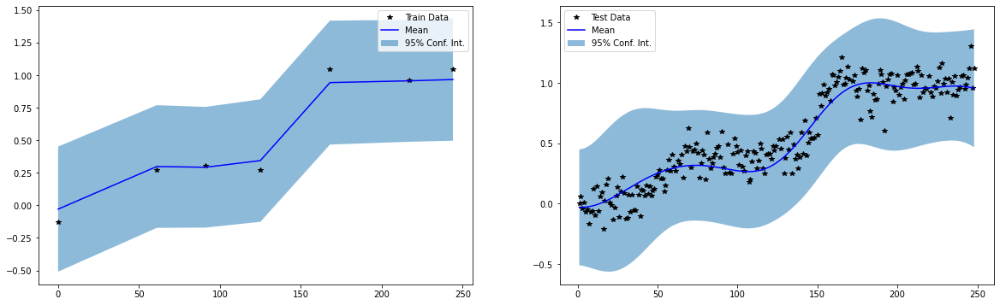

Iter 100/500 - Loss: 0.395   lengthscale: 35.673   noise: 0.011


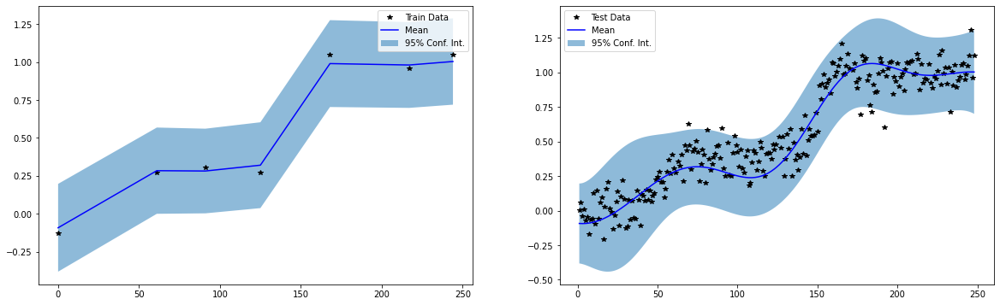

Iter 150/500 - Loss: 0.392   lengthscale: 37.422   noise: 0.012


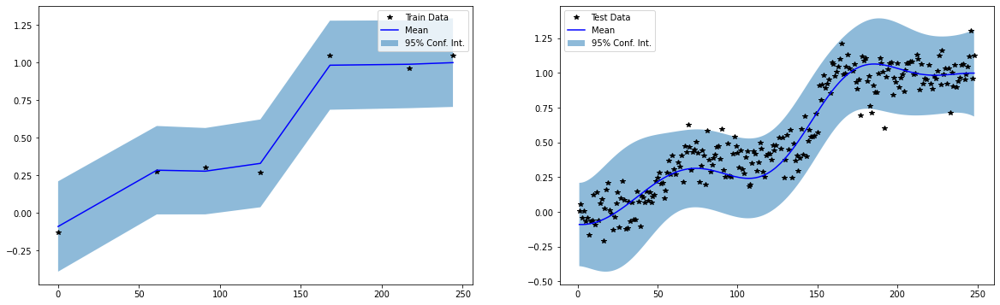

Iter 200/500 - Loss: 0.389   lengthscale: 38.827   noise: 0.016


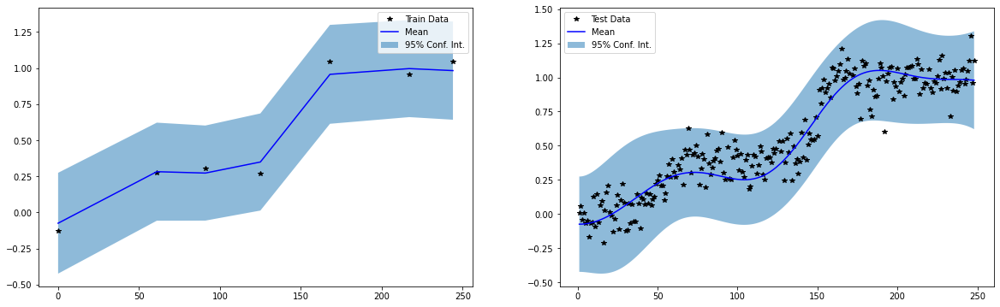

Iter 250/500 - Loss: 0.386   lengthscale: 40.839   noise: 0.021


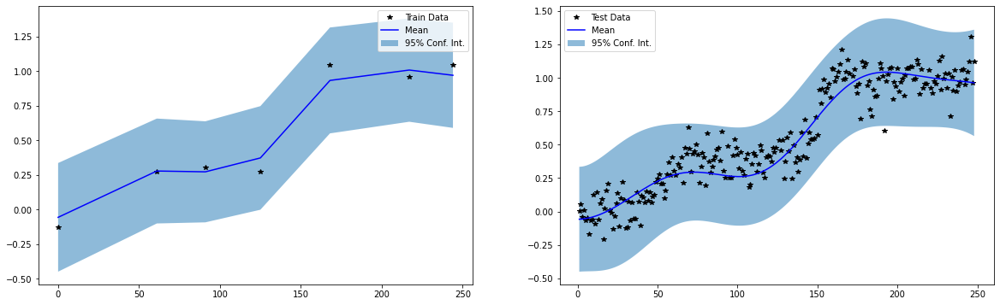

Iter 300/500 - Loss: 0.383   lengthscale: 43.109   noise: 0.024


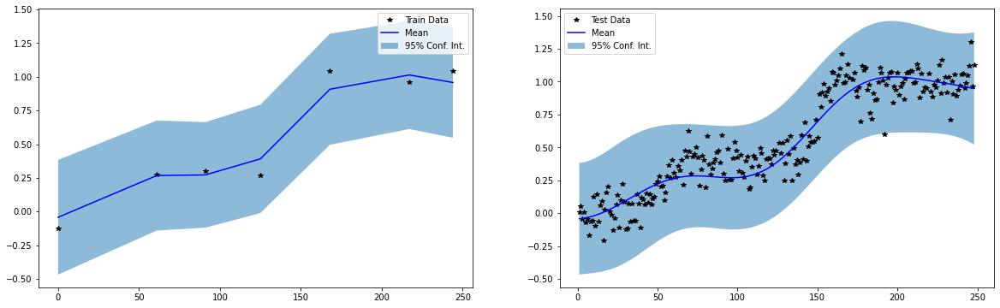

Iter 350/500 - Loss: 0.380   lengthscale: 45.493   noise: 0.028


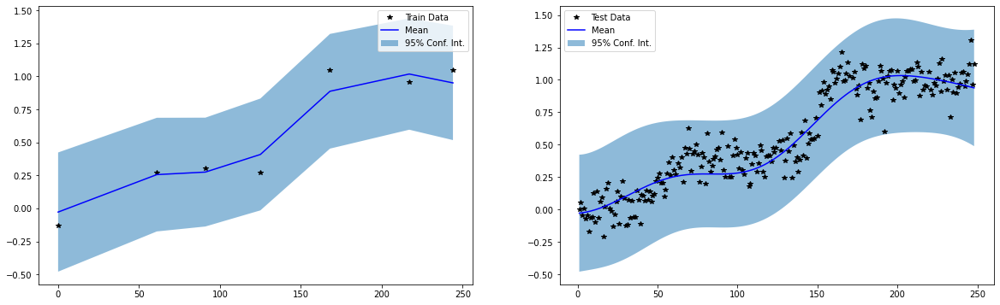

Iter 400/500 - Loss: 0.376   lengthscale: 48.022   noise: 0.031


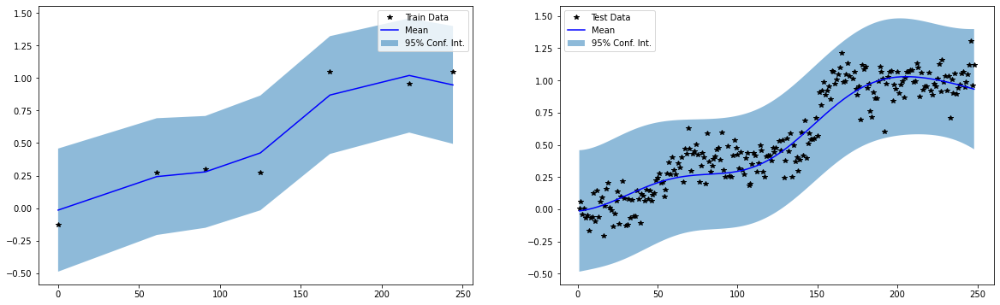

Iter 450/500 - Loss: 0.372   lengthscale: 50.787   noise: 0.034


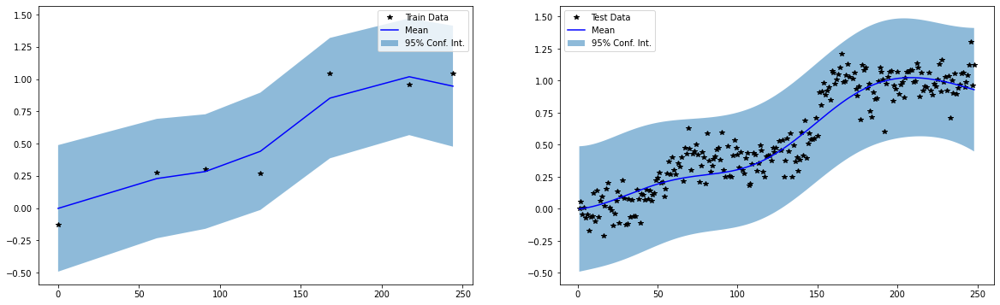

Iter 500/500 - Loss: 0.368   lengthscale: 53.873   noise: 0.036


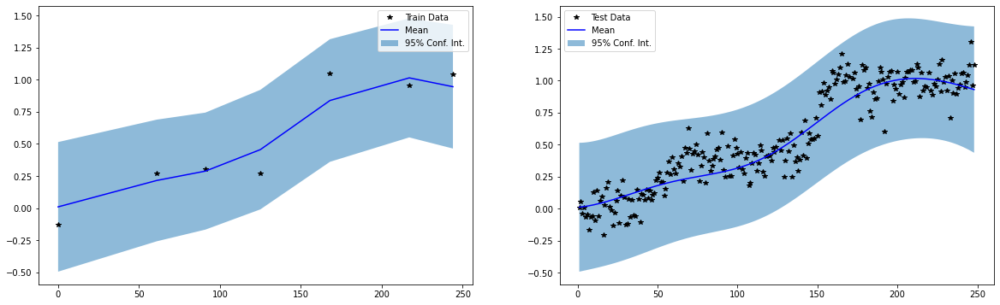

Train RMSE: 0.12705834209918976, Test RMSE: 0.13790248334407806
BEFORE TRAINING
8 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


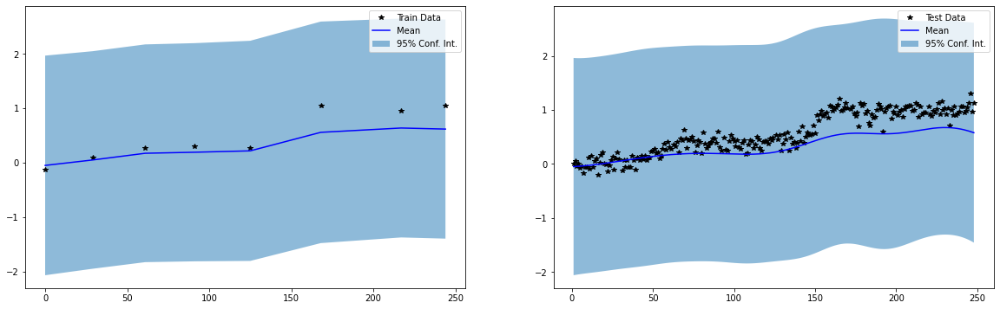

Iter 0/500 - Loss: 1.185   lengthscale: 25.100   noise: 0.644


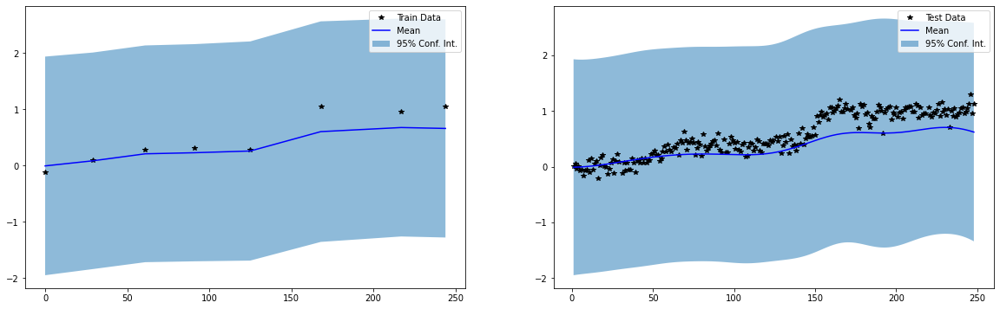

Iter 50/500 - Loss: 0.331   lengthscale: 30.750   noise: 0.020


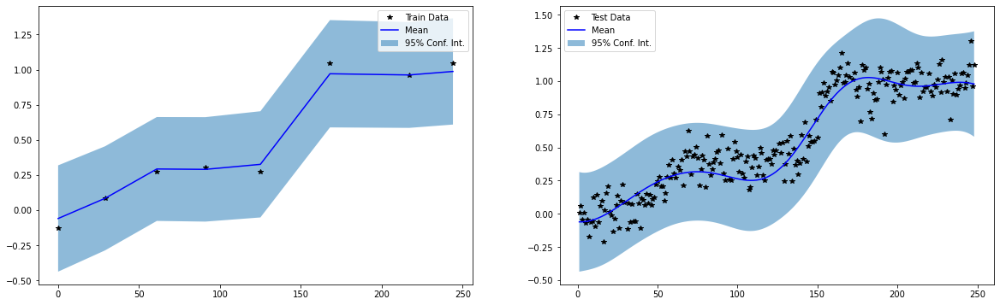

Iter 100/500 - Loss: 0.265   lengthscale: 35.803   noise: 0.006


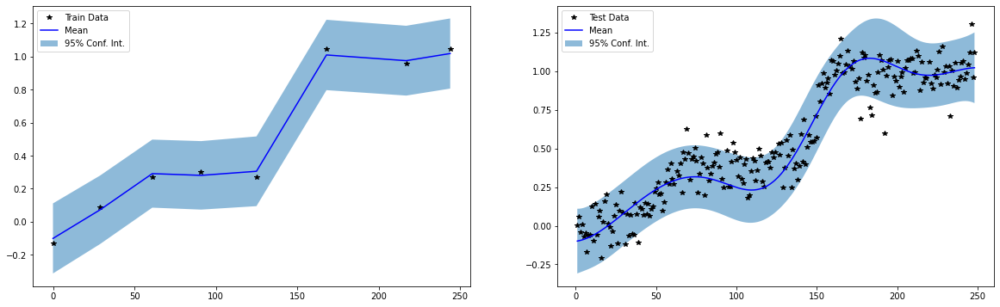

Iter 150/500 - Loss: 0.261   lengthscale: 37.629   noise: 0.006


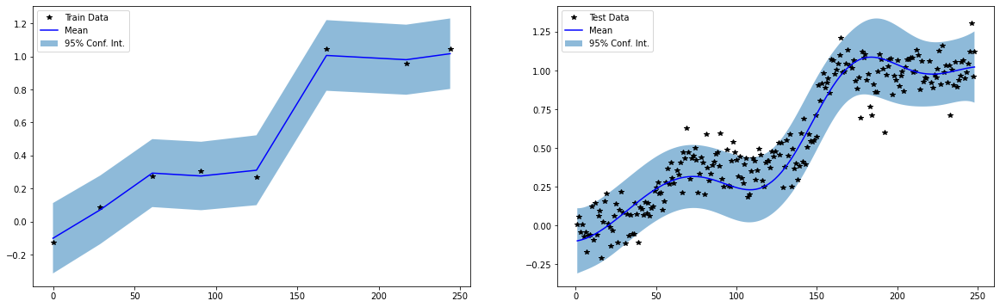

Iter 200/500 - Loss: 0.259   lengthscale: 38.628   noise: 0.008


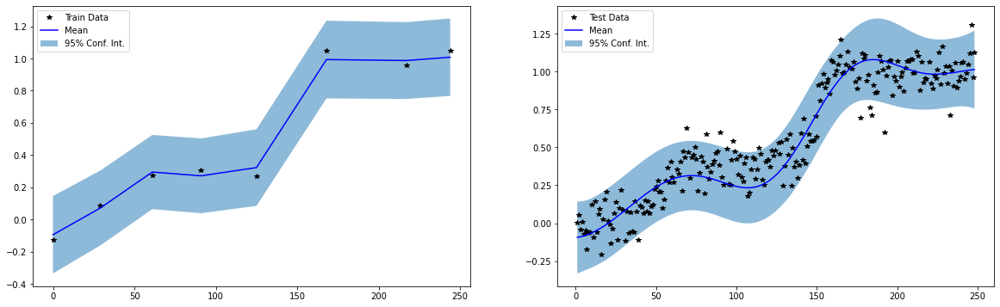

Iter 250/500 - Loss: 0.258   lengthscale: 39.629   noise: 0.009


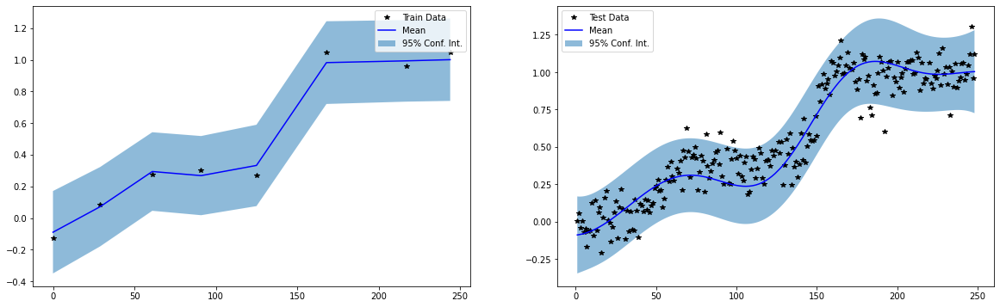

Iter 300/500 - Loss: 0.257   lengthscale: 40.431   noise: 0.010


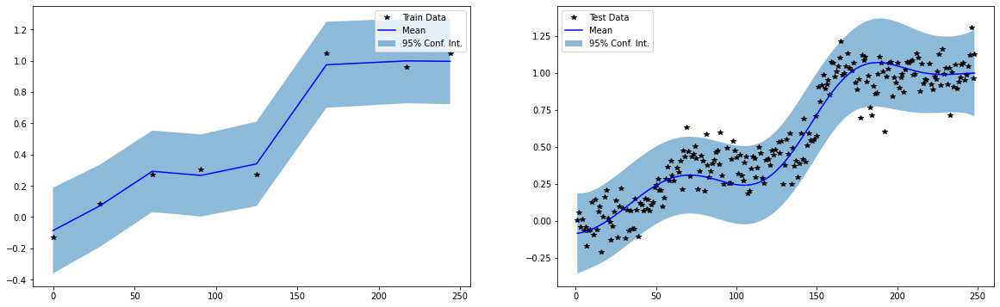

Iter 350/500 - Loss: 0.257   lengthscale: 41.025   noise: 0.011


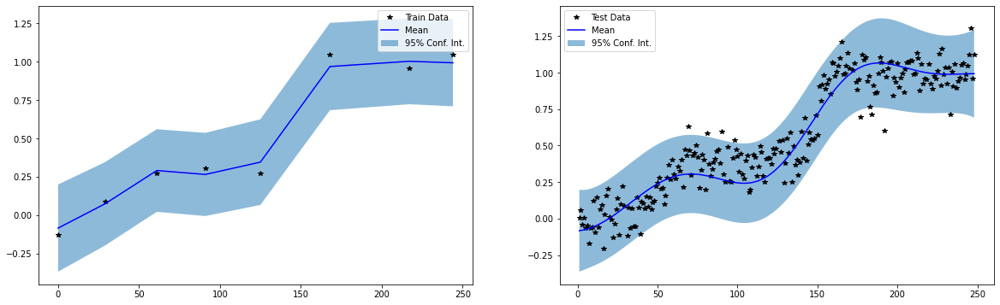

Iter 400/500 - Loss: 0.257   lengthscale: 41.458   noise: 0.011


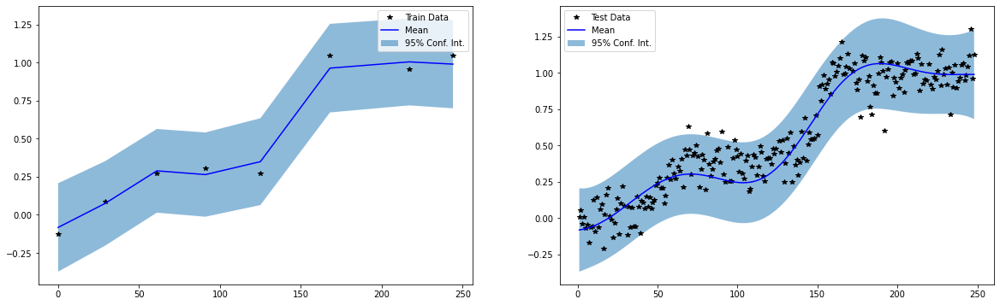

Iter 450/500 - Loss: 0.257   lengthscale: 41.776   noise: 0.012


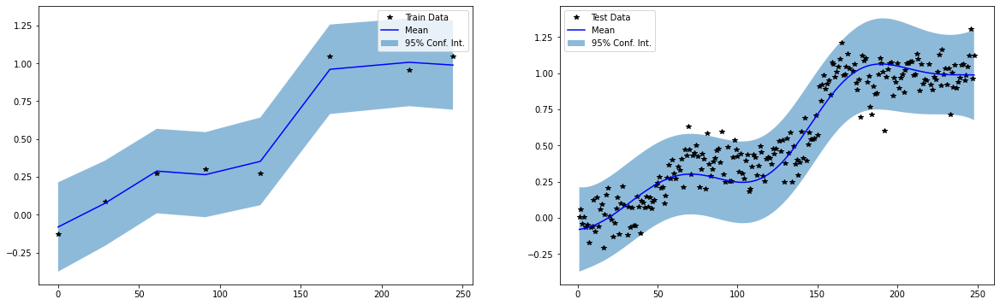

Iter 500/500 - Loss: 0.256   lengthscale: 42.010   noise: 0.012


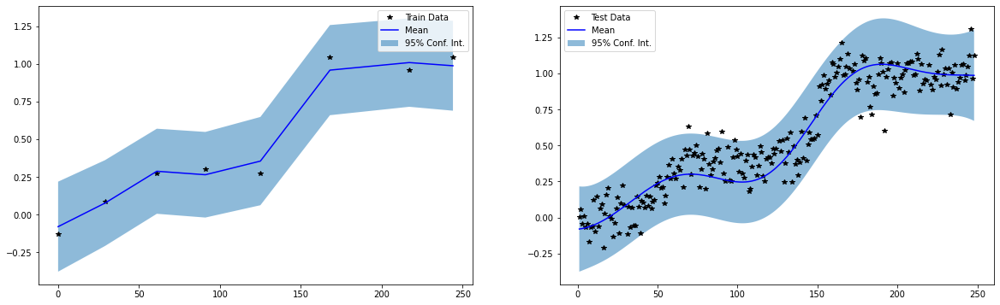

Train RMSE: 0.055759456008672714, Test RMSE: 0.13024431467056274
BEFORE TRAINING
9 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


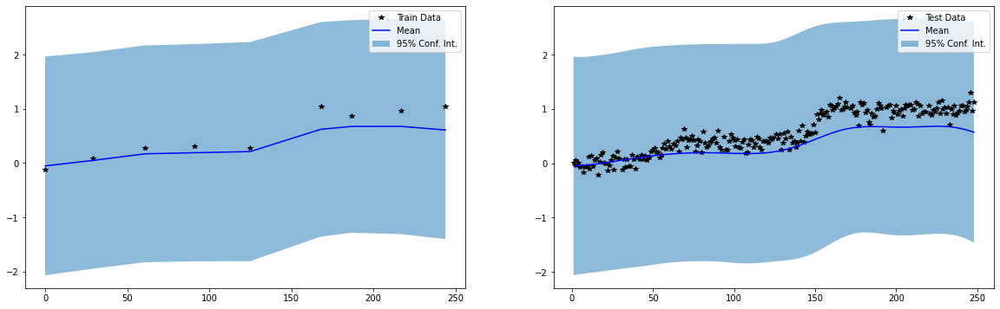

Iter 0/500 - Loss: 1.167   lengthscale: 25.100   noise: 0.644


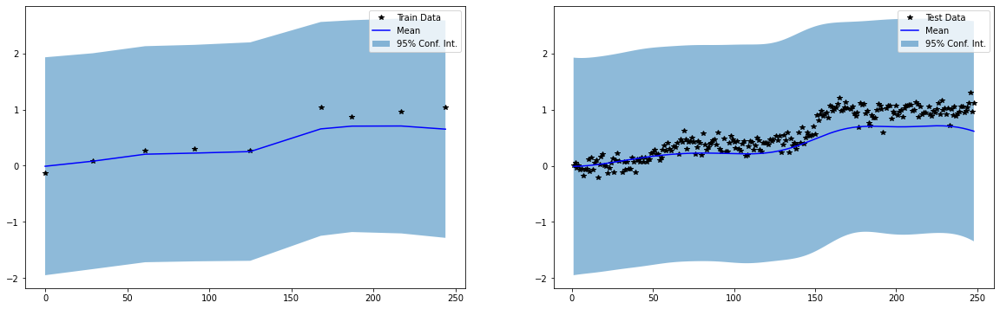

Iter 50/500 - Loss: 0.248   lengthscale: 30.637   noise: 0.017


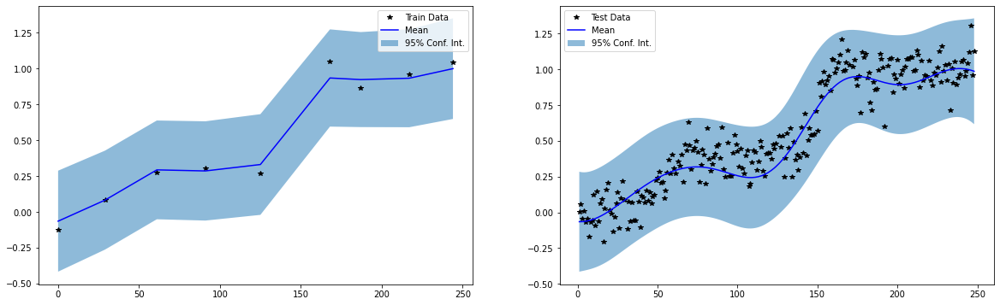

Iter 100/500 - Loss: 0.219   lengthscale: 34.643   noise: 0.014


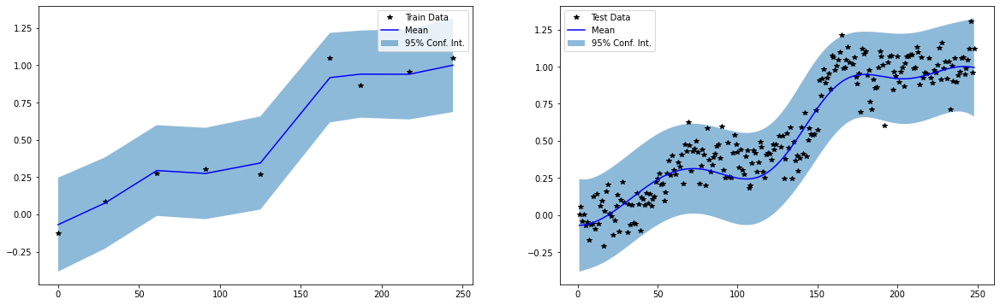

Iter 150/500 - Loss: 0.206   lengthscale: 38.111   noise: 0.017


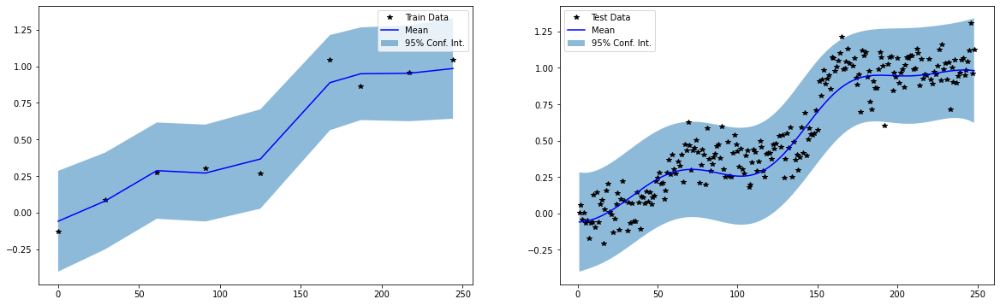

Iter 200/500 - Loss: 0.197   lengthscale: 41.217   noise: 0.019


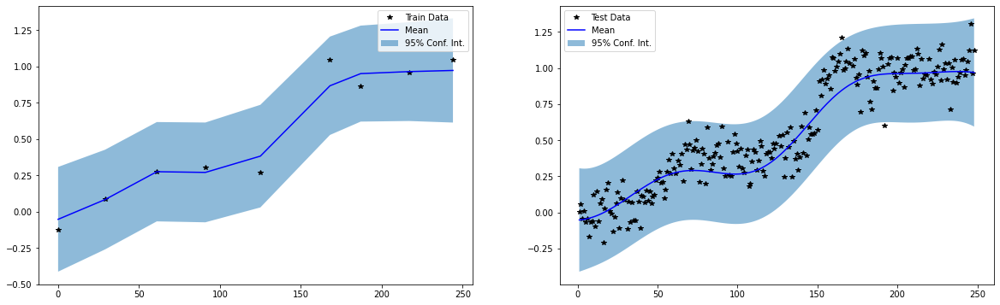

Iter 250/500 - Loss: 0.191   lengthscale: 43.976   noise: 0.020


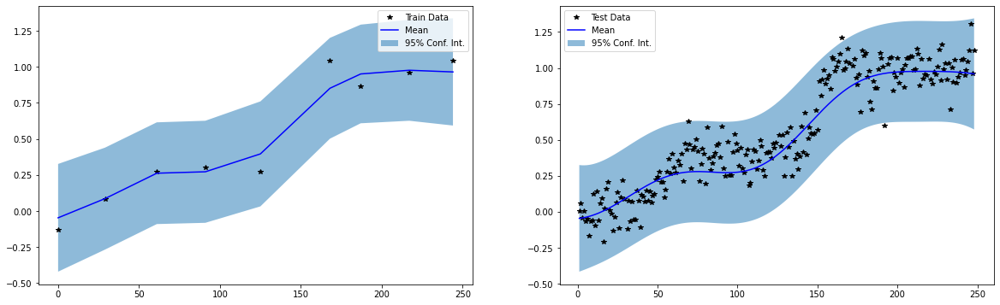

Iter 300/500 - Loss: 0.185   lengthscale: 46.595   noise: 0.022


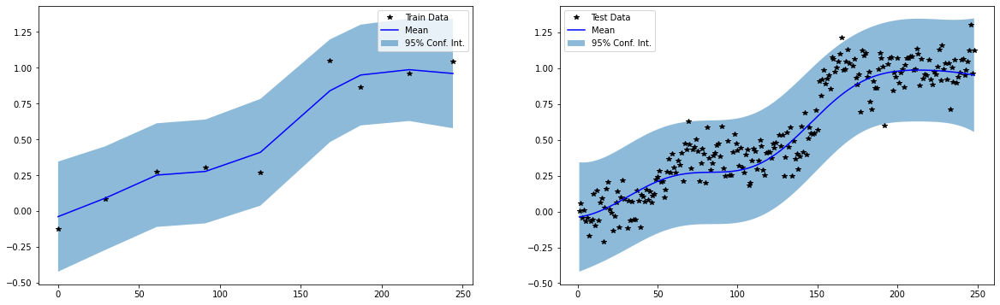

Iter 350/500 - Loss: 0.180   lengthscale: 49.234   noise: 0.023


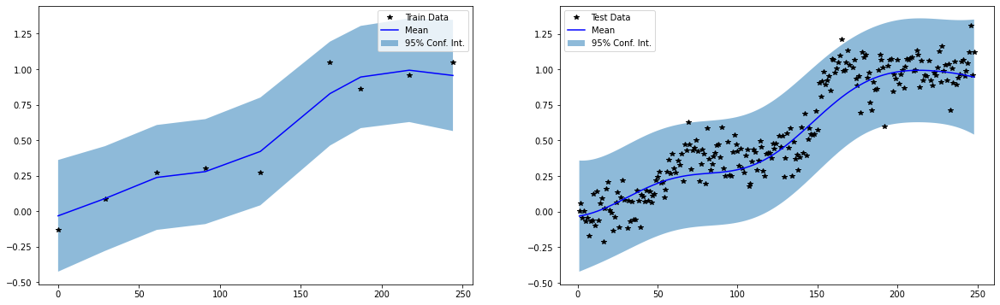

Iter 400/500 - Loss: 0.175   lengthscale: 51.974   noise: 0.024


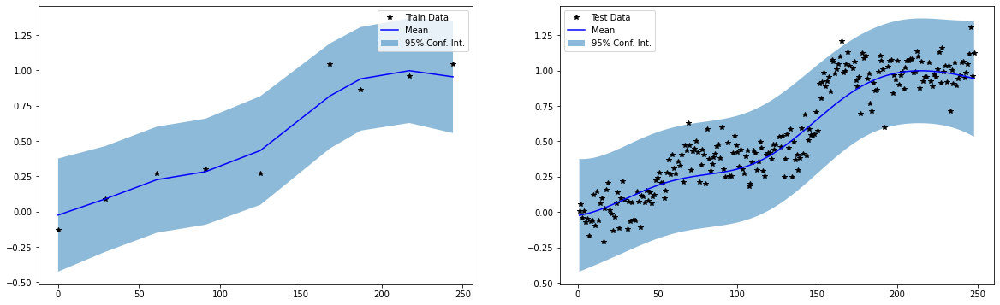

Iter 450/500 - Loss: 0.170   lengthscale: 54.839   noise: 0.025


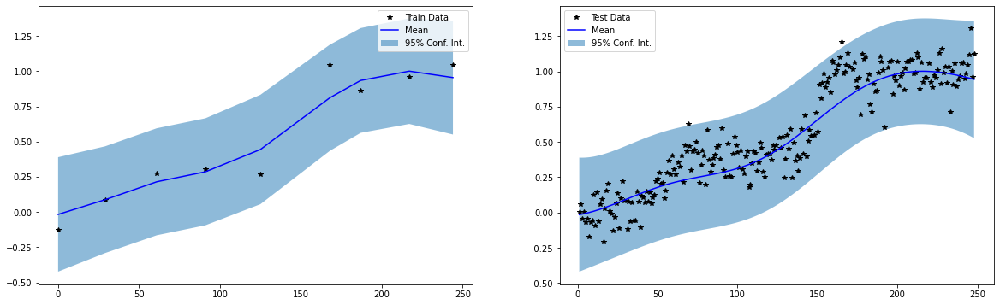

Iter 500/500 - Loss: 0.164   lengthscale: 57.822   noise: 0.026


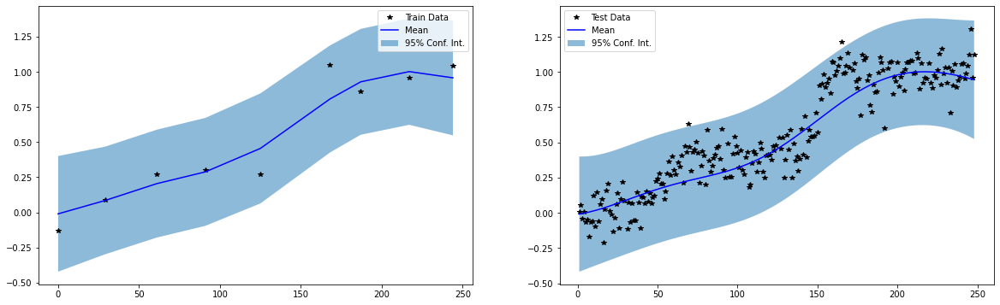

Train RMSE: 0.11737470328807831, Test RMSE: 0.1411384642124176
BEFORE TRAINING
10 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


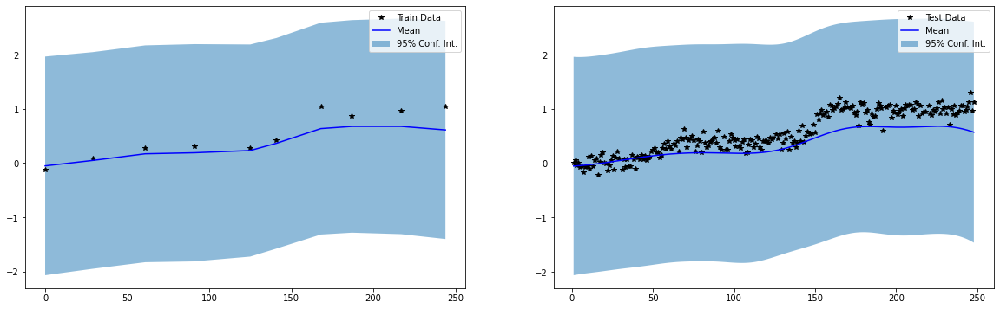

Iter 0/500 - Loss: 1.146   lengthscale: 25.100   noise: 0.644


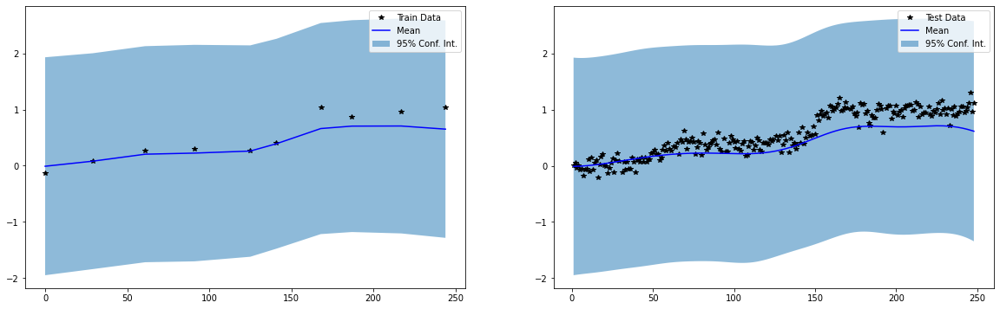

Iter 50/500 - Loss: 0.183   lengthscale: 30.579   noise: 0.016


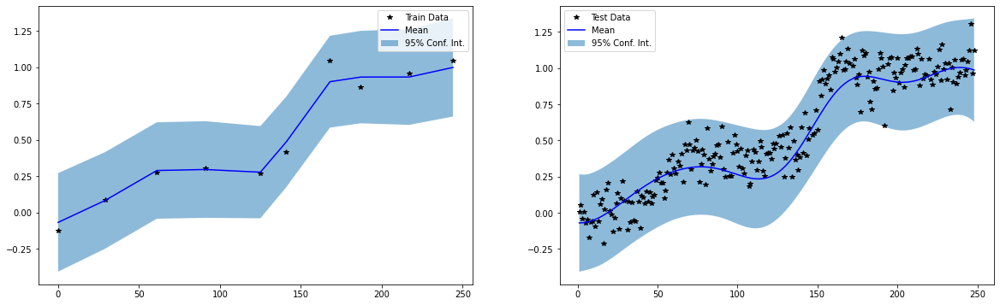

Iter 100/500 - Loss: 0.154   lengthscale: 34.976   noise: 0.015


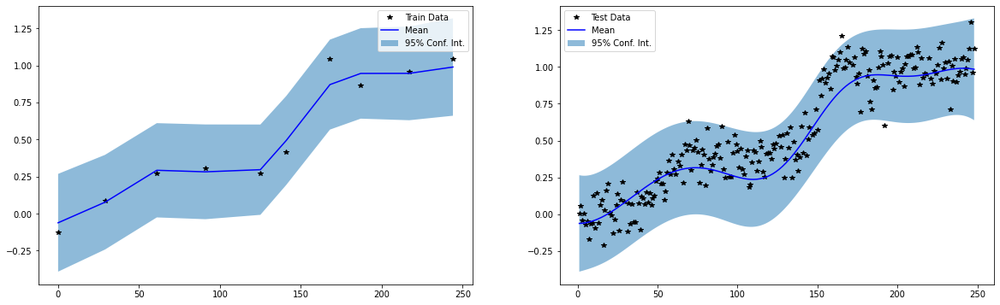

Iter 150/500 - Loss: 0.141   lengthscale: 38.605   noise: 0.016


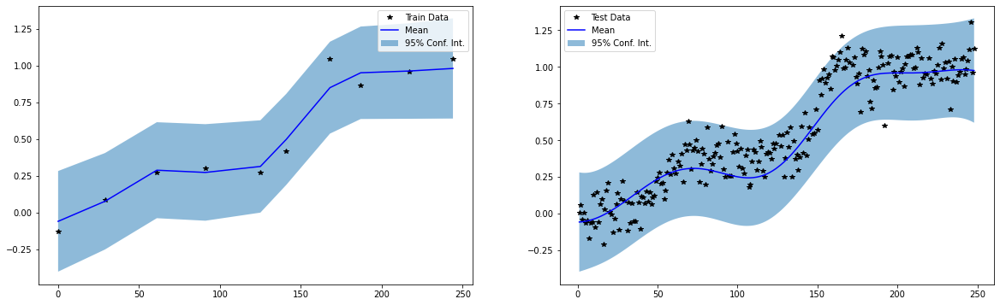

Iter 200/500 - Loss: 0.133   lengthscale: 41.611   noise: 0.018


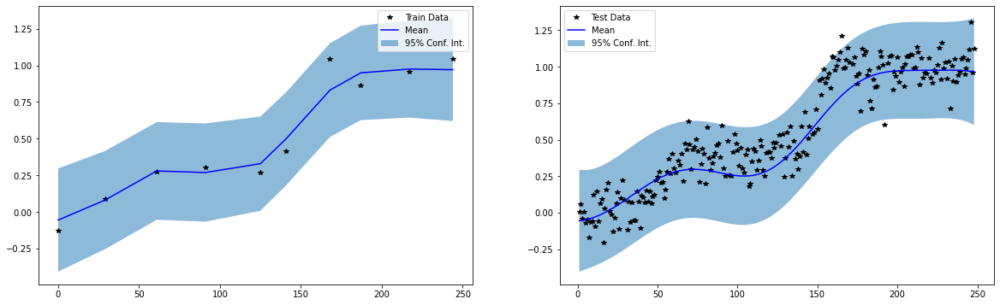

Iter 250/500 - Loss: 0.127   lengthscale: 44.156   noise: 0.019


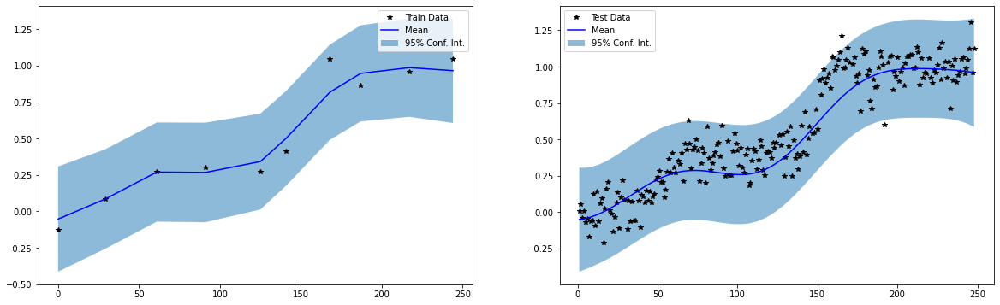

Iter 300/500 - Loss: 0.123   lengthscale: 46.396   noise: 0.020


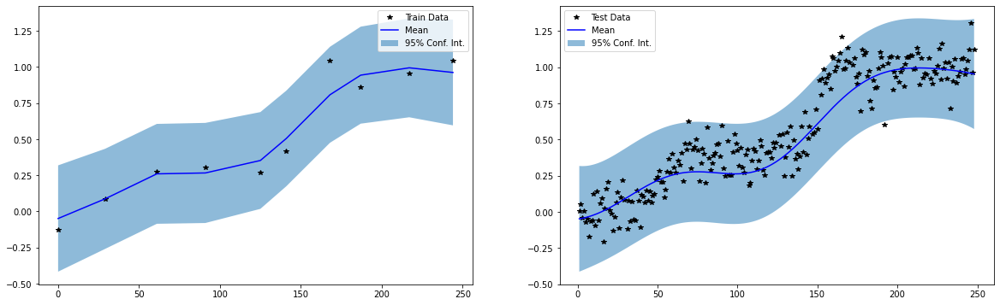

Iter 350/500 - Loss: 0.120   lengthscale: 48.443   noise: 0.020


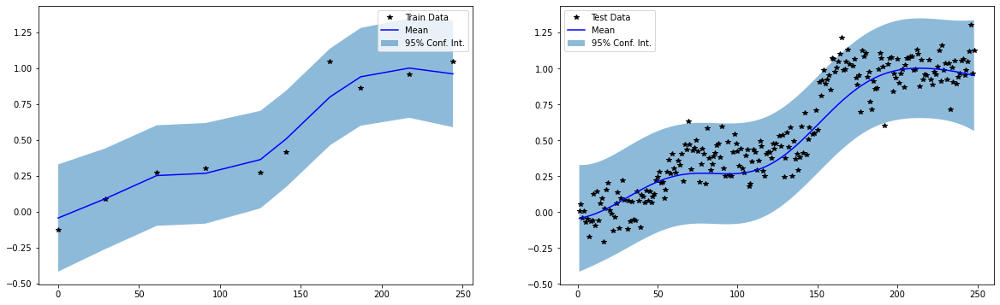

Iter 400/500 - Loss: 0.118   lengthscale: 50.363   noise: 0.021


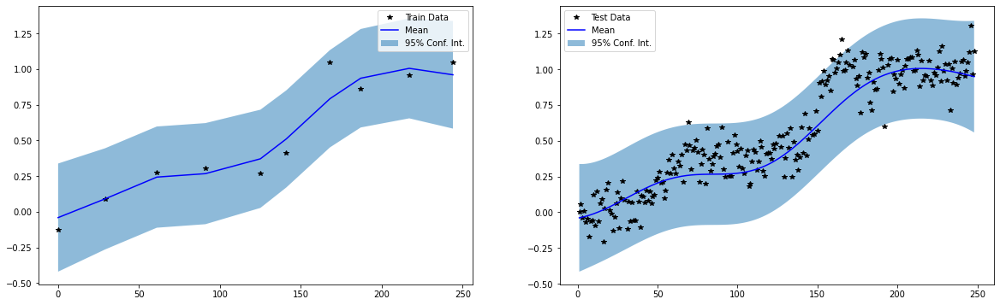

Iter 450/500 - Loss: 0.116   lengthscale: 52.189   noise: 0.022


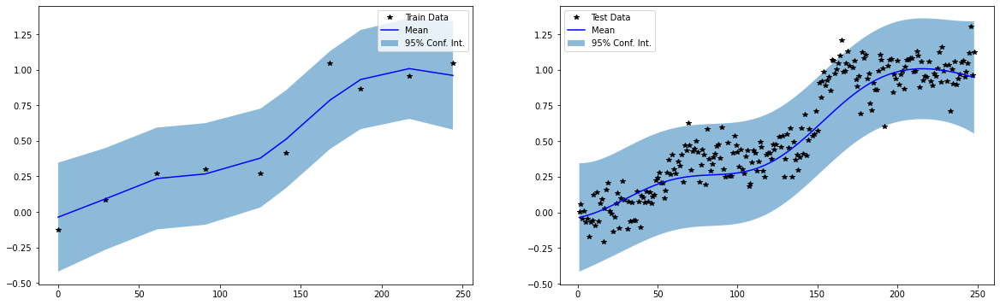

Iter 500/500 - Loss: 0.114   lengthscale: 53.938   noise: 0.022


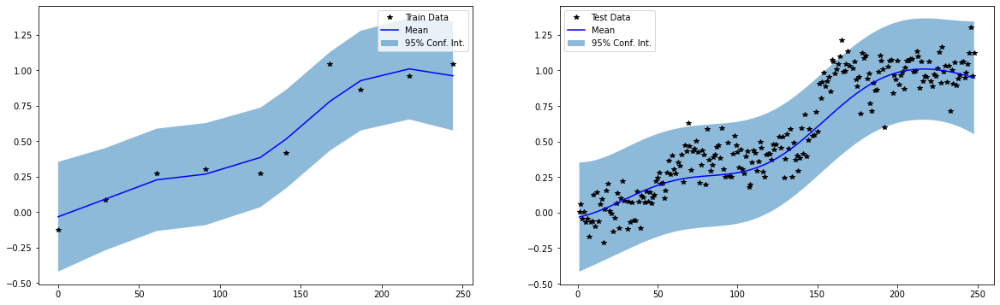

Train RMSE: 0.10950417071580887, Test RMSE: 0.14661730825901031
BEFORE TRAINING
11 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


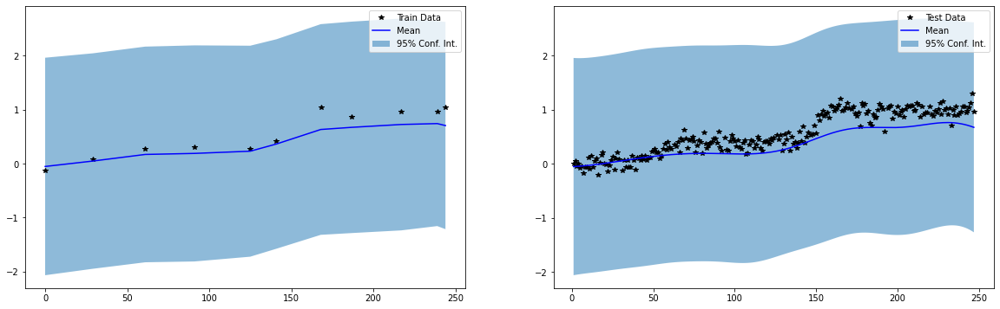

Iter 0/500 - Loss: 1.130   lengthscale: 25.100   noise: 0.644


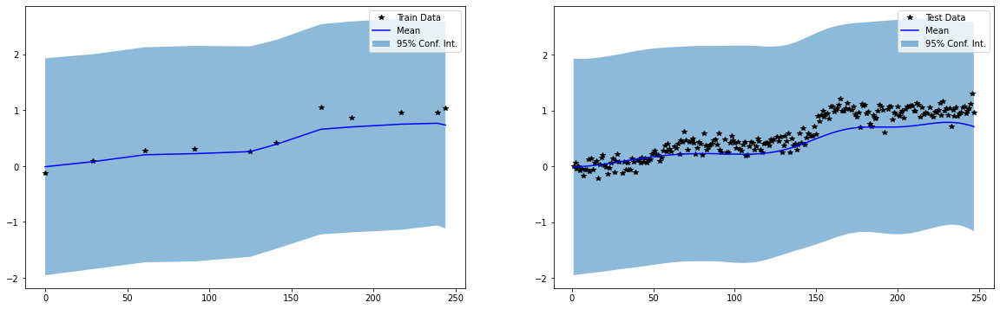

Iter 50/500 - Loss: 0.078   lengthscale: 30.571   noise: 0.012


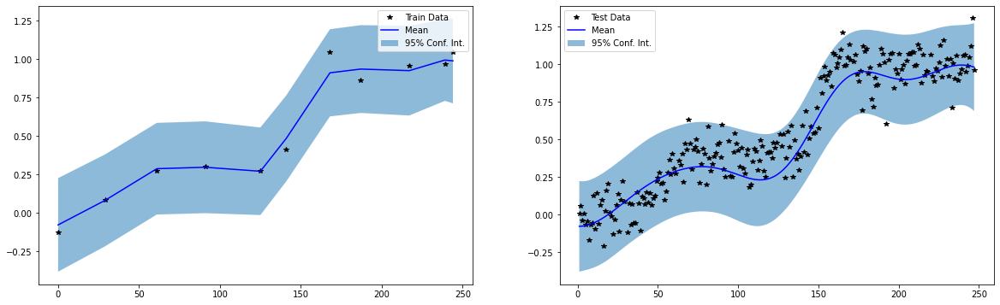

Iter 100/500 - Loss: 0.053   lengthscale: 34.540   noise: 0.011


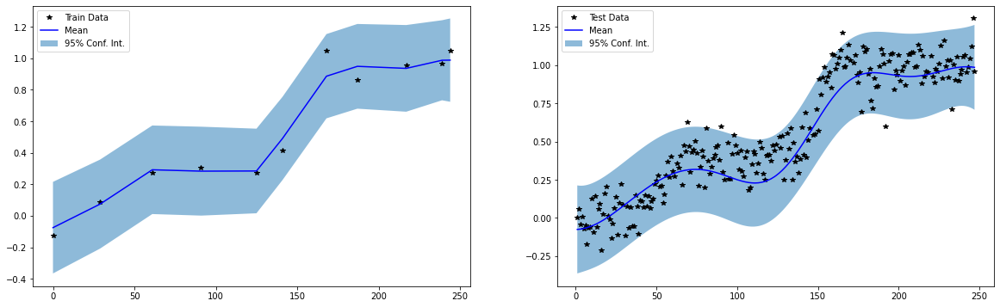

Iter 150/500 - Loss: 0.044   lengthscale: 37.700   noise: 0.012


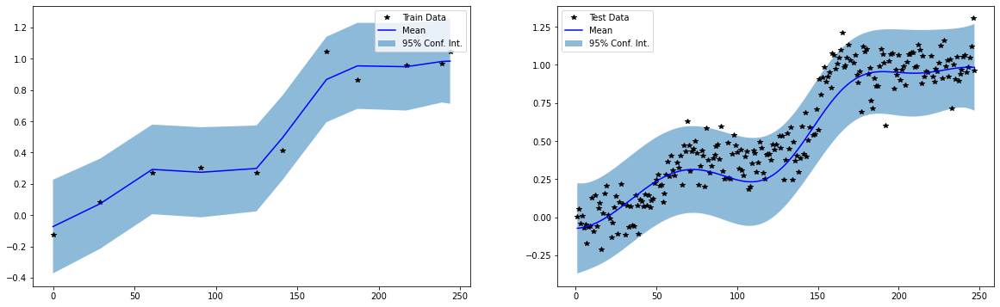

Iter 200/500 - Loss: 0.039   lengthscale: 40.186   noise: 0.013


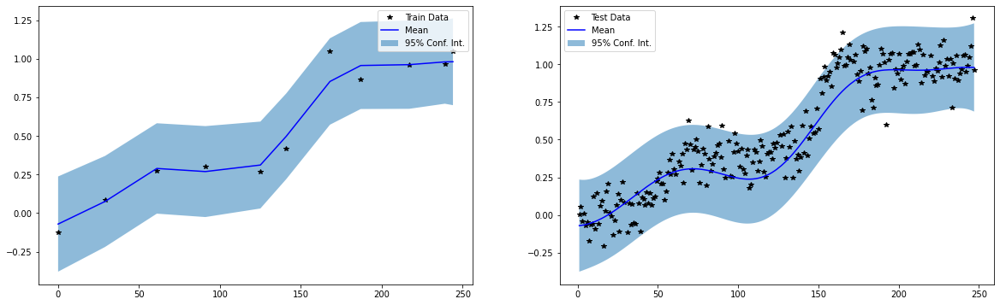

Iter 250/500 - Loss: 0.037   lengthscale: 42.145   noise: 0.014


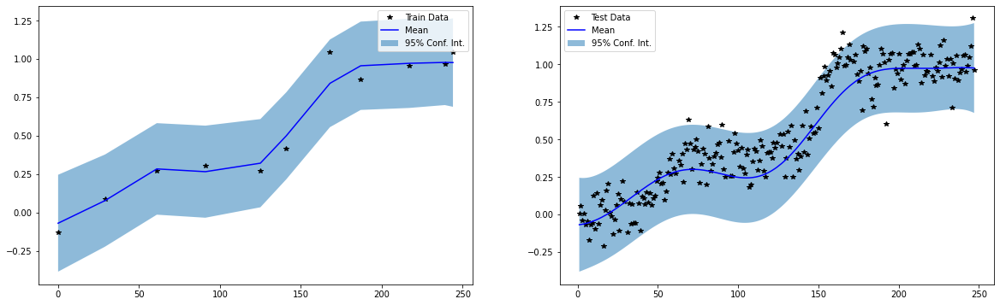

Iter 300/500 - Loss: 0.035   lengthscale: 43.713   noise: 0.014


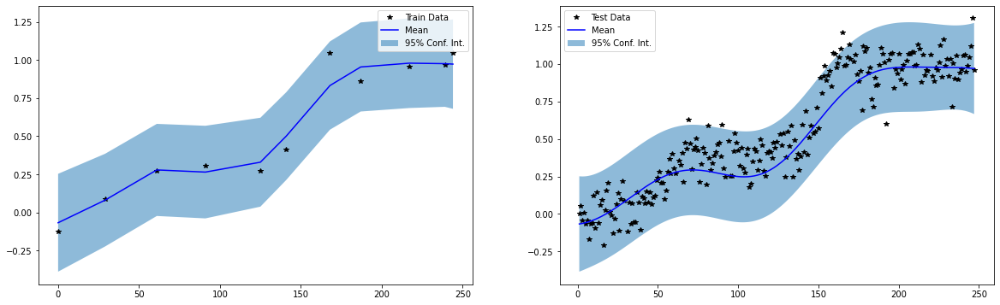

Iter 350/500 - Loss: 0.034   lengthscale: 45.014   noise: 0.015


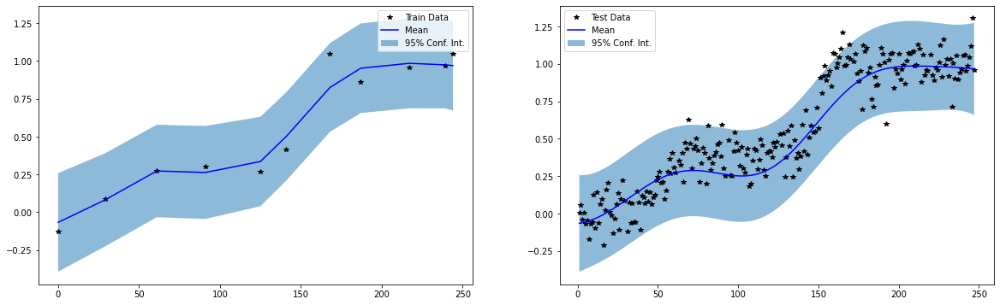

Iter 400/500 - Loss: 0.033   lengthscale: 46.139   noise: 0.015


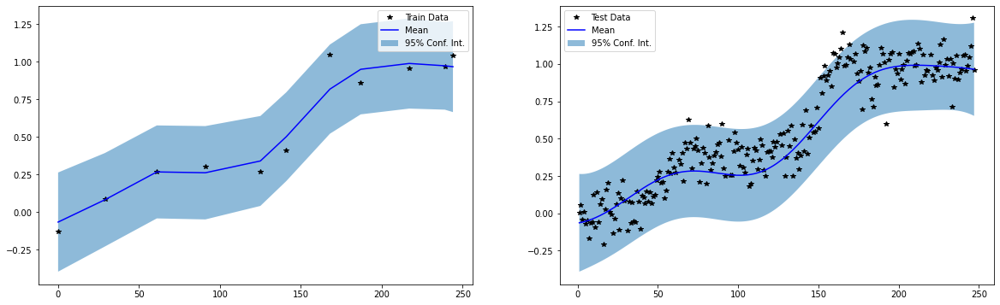

Iter 450/500 - Loss: 0.033   lengthscale: 47.148   noise: 0.016


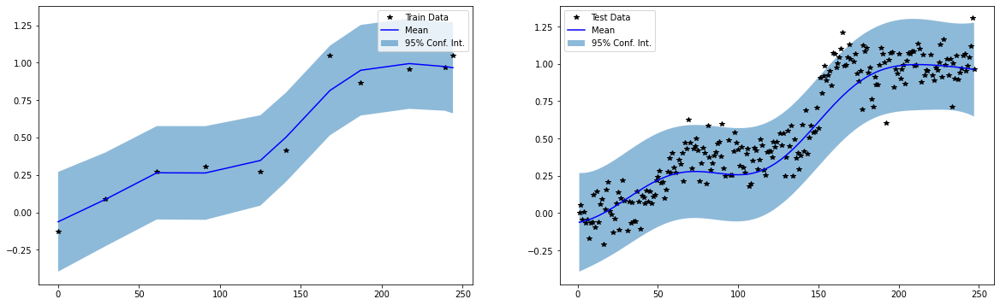

Iter 500/500 - Loss: 0.032   lengthscale: 48.083   noise: 0.016


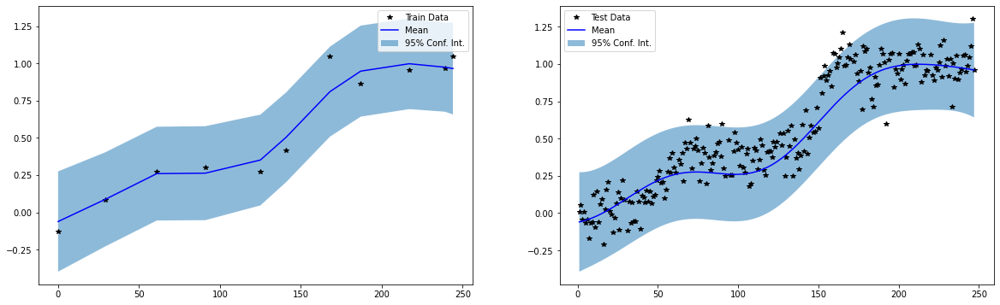

Train RMSE: 0.09131841361522675, Test RMSE: 0.142413929104805
BEFORE TRAINING
12 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


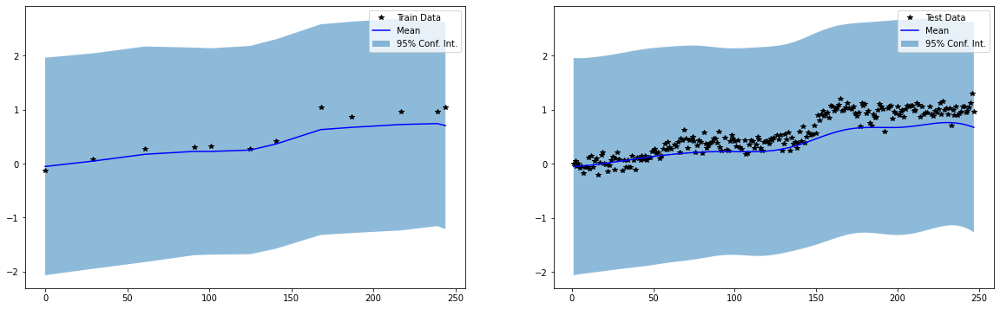

Iter 0/500 - Loss: 1.113   lengthscale: 25.100   noise: 0.644


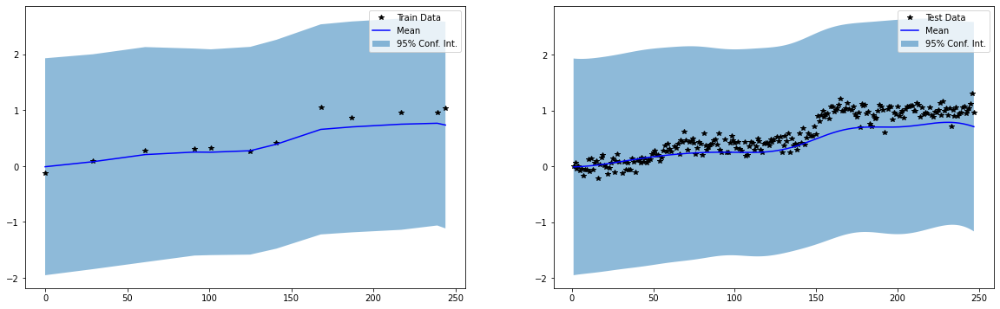

Iter 50/500 - Loss: -0.007   lengthscale: 30.520   noise: 0.011


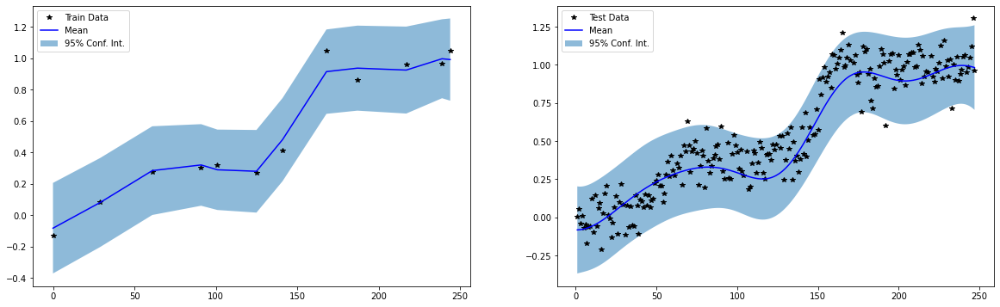

Iter 100/500 - Loss: -0.025   lengthscale: 32.702   noise: 0.009


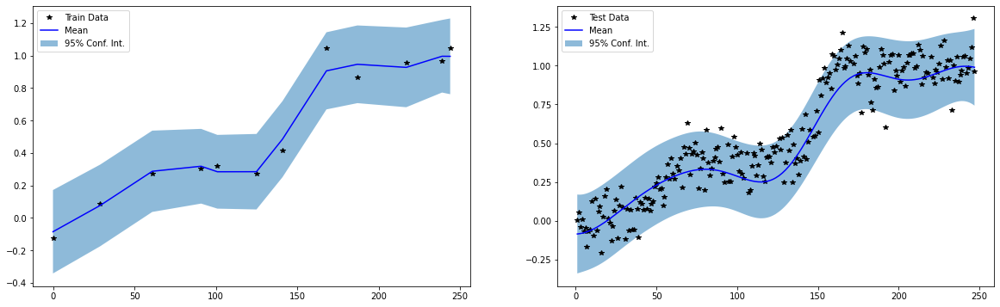

Iter 150/500 - Loss: -0.029   lengthscale: 34.820   noise: 0.010


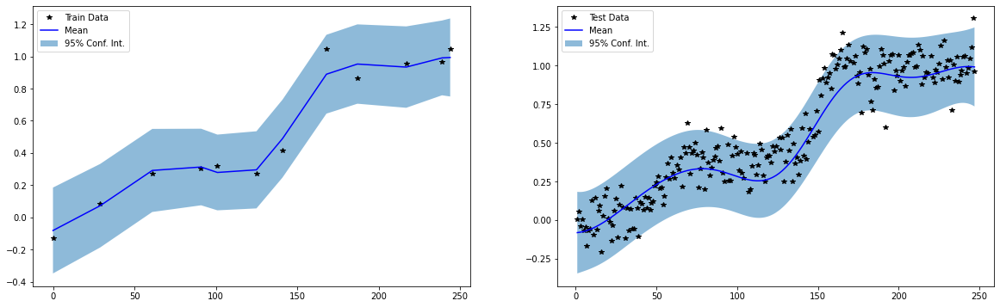

Iter 200/500 - Loss: -0.032   lengthscale: 37.053   noise: 0.011


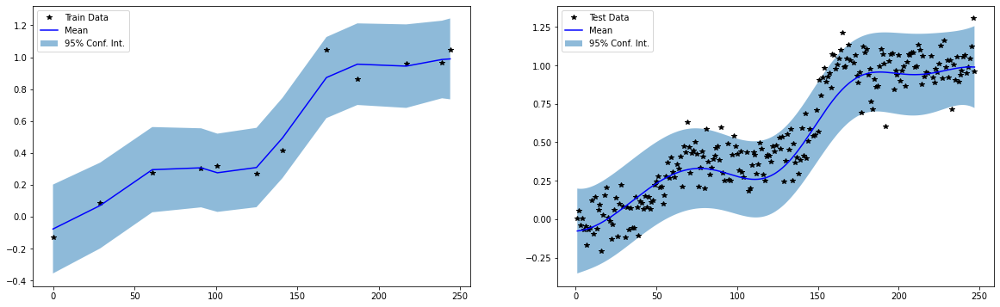

Iter 250/500 - Loss: -0.035   lengthscale: 39.403   noise: 0.011


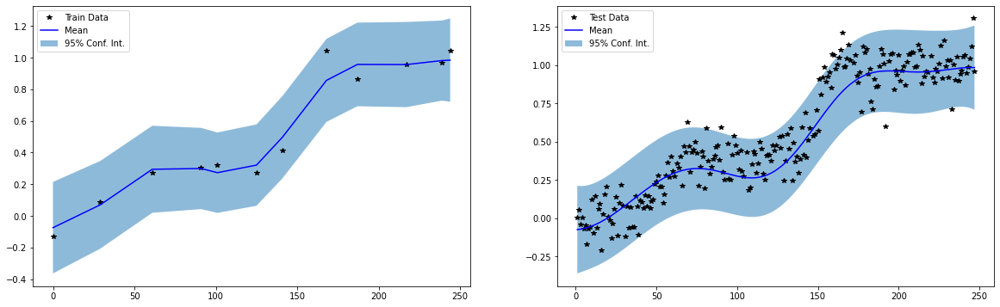

Iter 300/500 - Loss: -0.038   lengthscale: 41.708   noise: 0.012


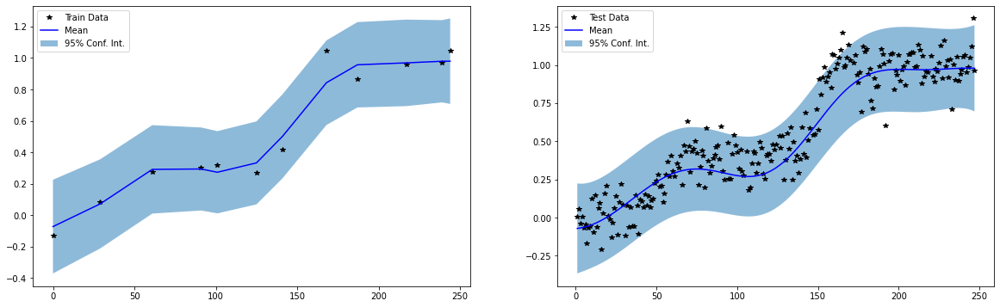

Iter 350/500 - Loss: -0.040   lengthscale: 43.790   noise: 0.013


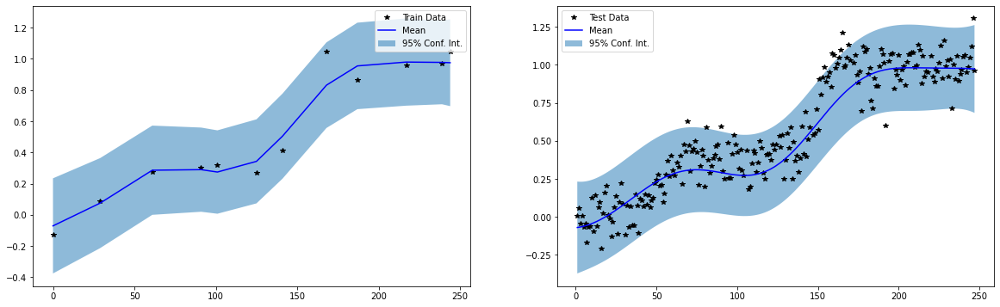

Iter 400/500 - Loss: -0.042   lengthscale: 45.596   noise: 0.014


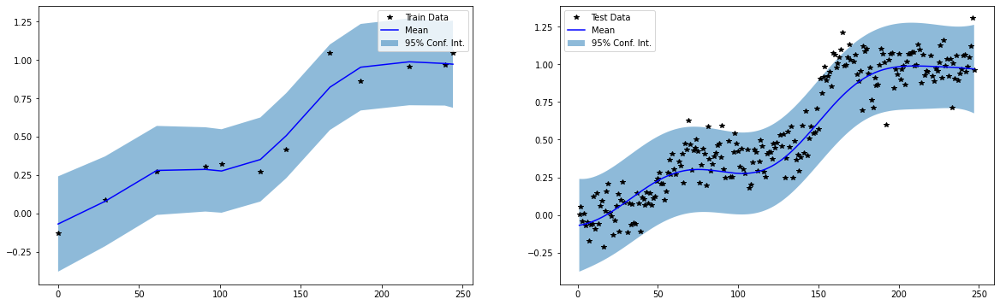

Iter 450/500 - Loss: -0.043   lengthscale: 47.161   noise: 0.014


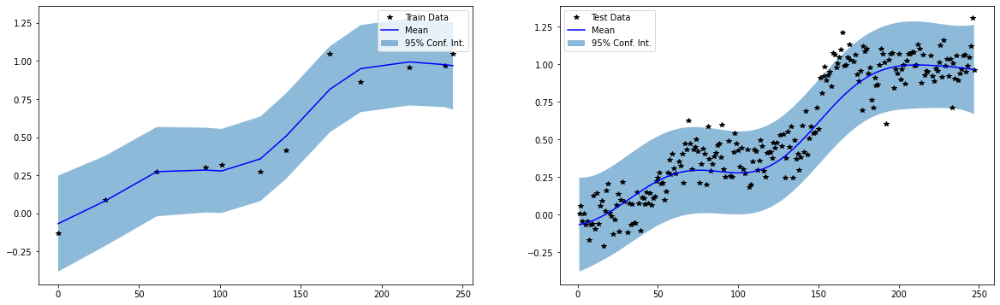

Iter 500/500 - Loss: -0.044   lengthscale: 48.539   noise: 0.014


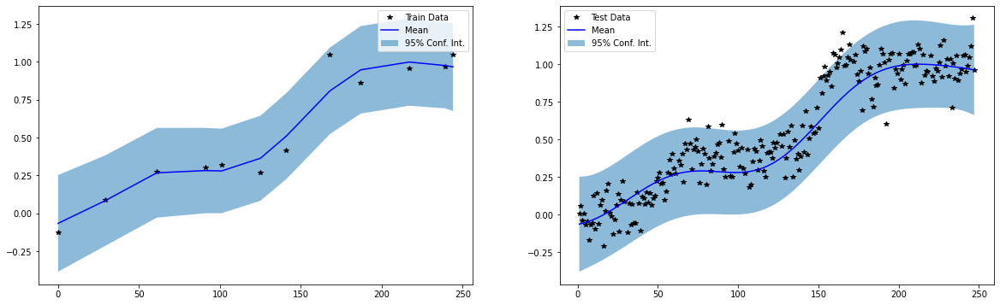

Train RMSE: 0.08889740705490112, Test RMSE: 0.13944508135318756
BEFORE TRAINING
13 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


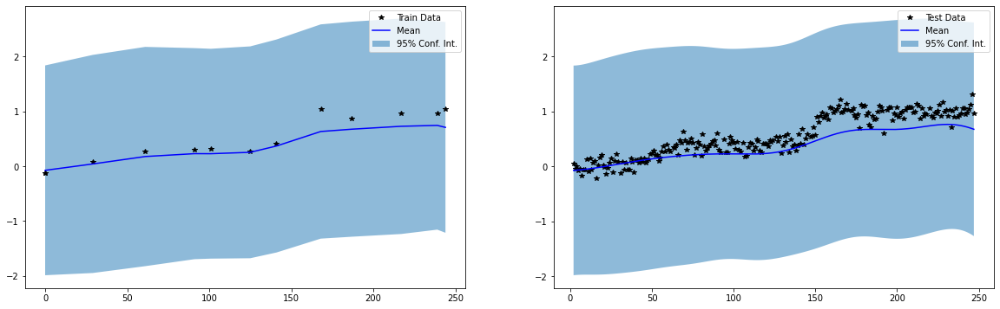

Iter 0/500 - Loss: 1.099   lengthscale: 25.100   noise: 0.644


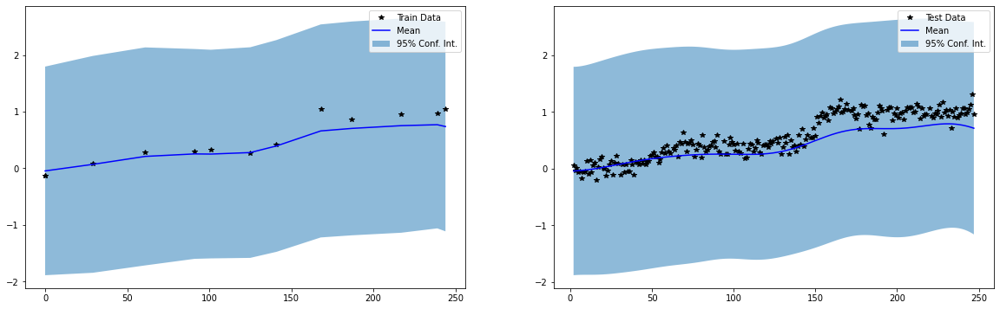

Iter 50/500 - Loss: -0.091   lengthscale: 30.504   noise: 0.009


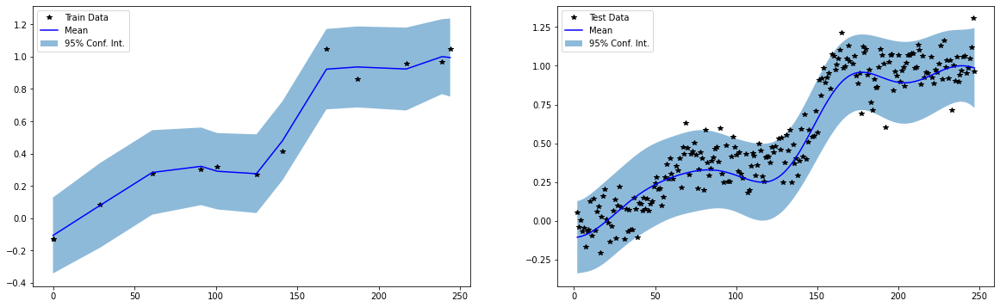

Iter 100/500 - Loss: -0.115   lengthscale: 30.137   noise: 0.006


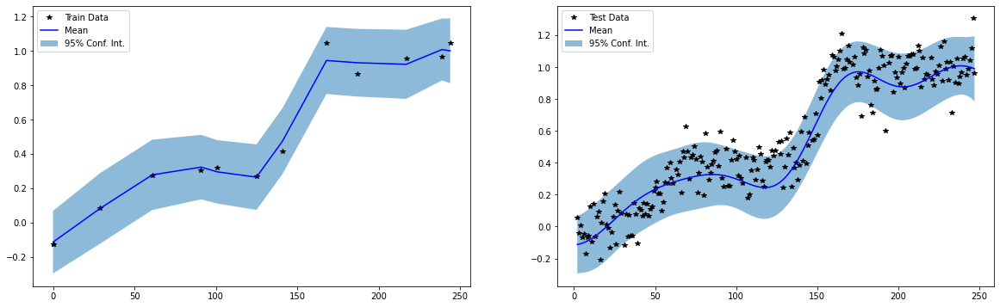

Iter 150/500 - Loss: -0.118   lengthscale: 28.549   noise: 0.005


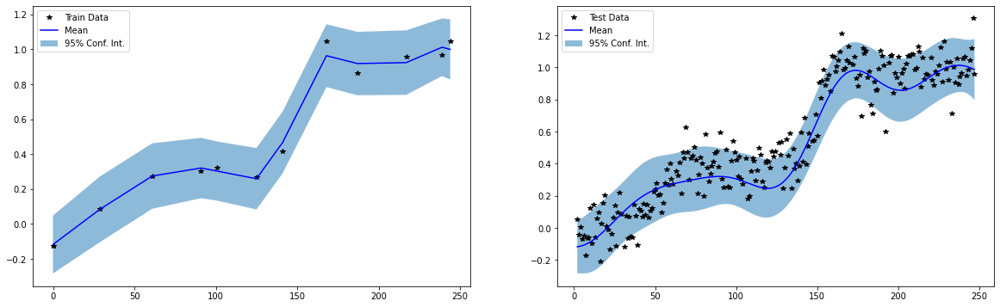

Iter 200/500 - Loss: -0.125   lengthscale: 26.120   noise: 0.003


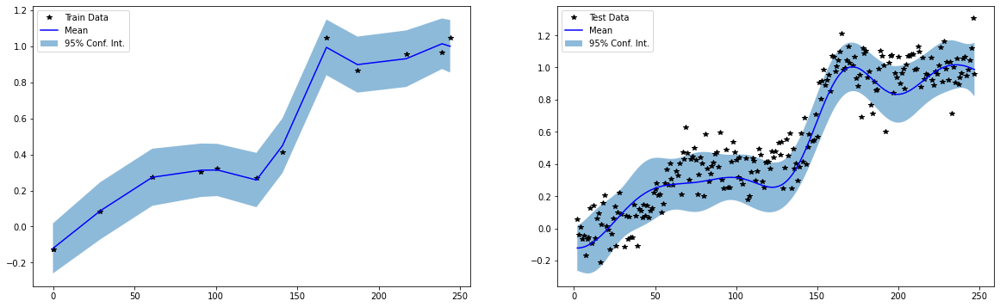

Iter 250/500 - Loss: -0.129   lengthscale: 24.609   noise: 0.002


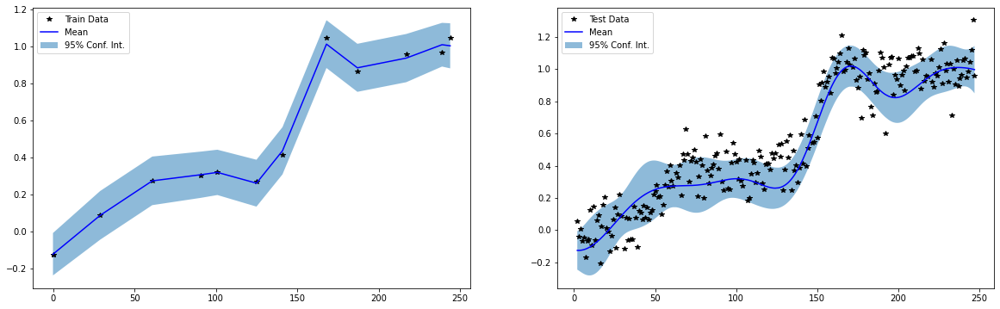

Iter 300/500 - Loss: -0.129   lengthscale: 24.163   noise: 0.002


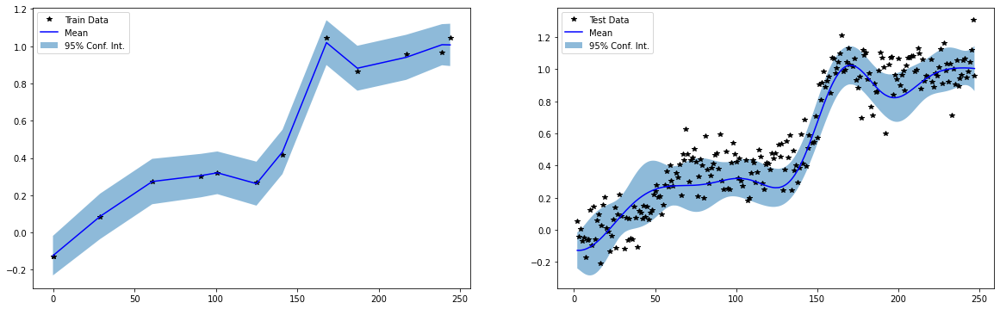

Iter 350/500 - Loss: -0.130   lengthscale: 24.003   noise: 0.002


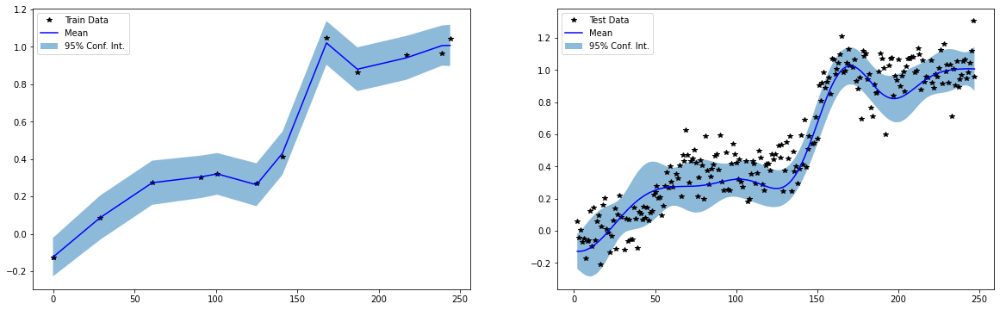

Iter 400/500 - Loss: -0.130   lengthscale: 23.930   noise: 0.002


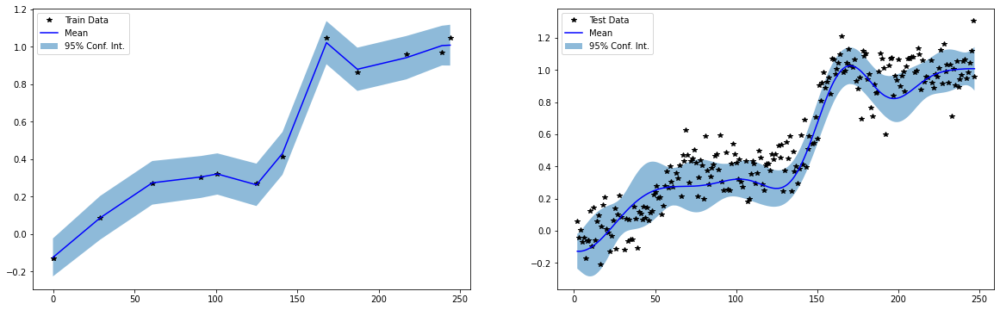

Iter 450/500 - Loss: -0.130   lengthscale: 23.893   noise: 0.002


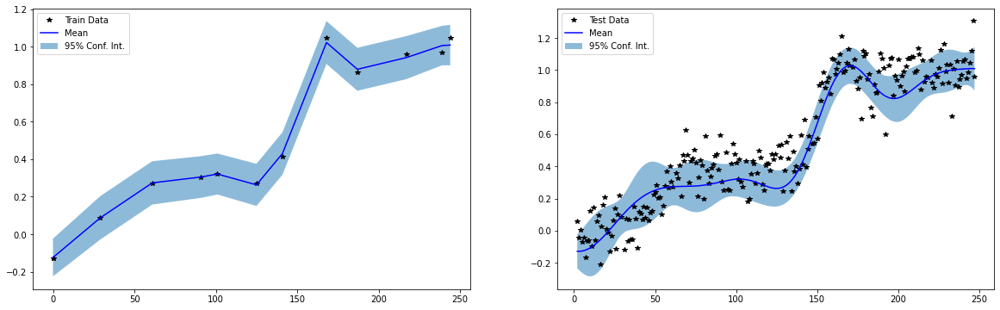

Iter 500/500 - Loss: -0.130   lengthscale: 23.874   noise: 0.002


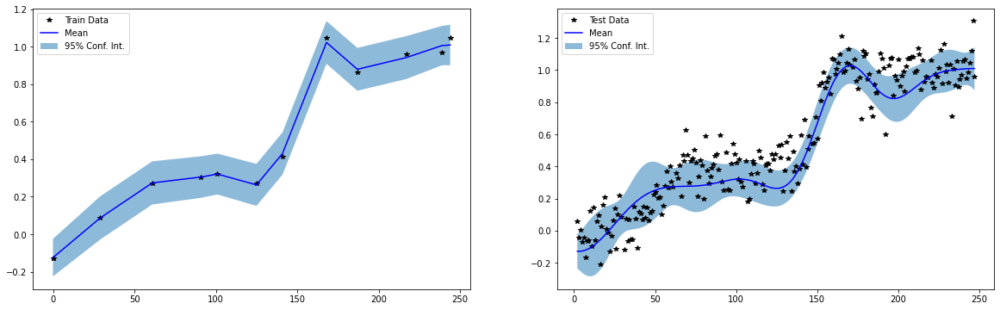

Train RMSE: 0.01803201250731945, Test RMSE: 0.1348569393157959
BEFORE TRAINING
14 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


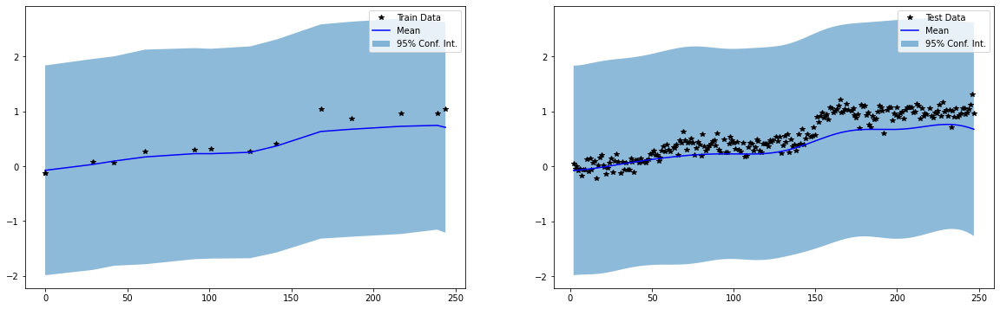

Iter 0/500 - Loss: 1.087   lengthscale: 25.100   noise: 0.644


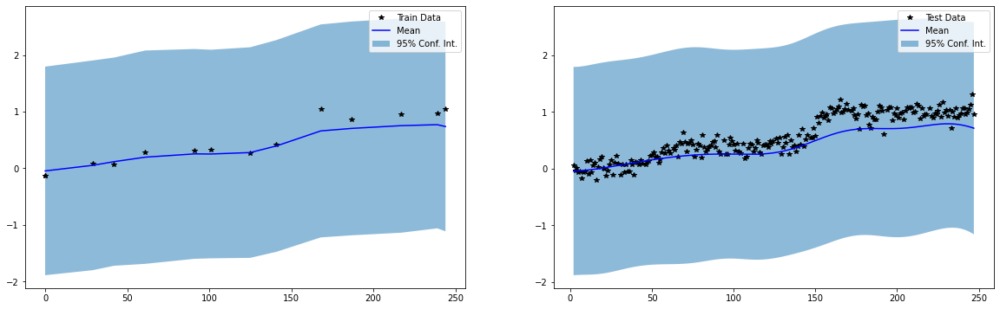

Iter 50/500 - Loss: -0.137   lengthscale: 30.564   noise: 0.009


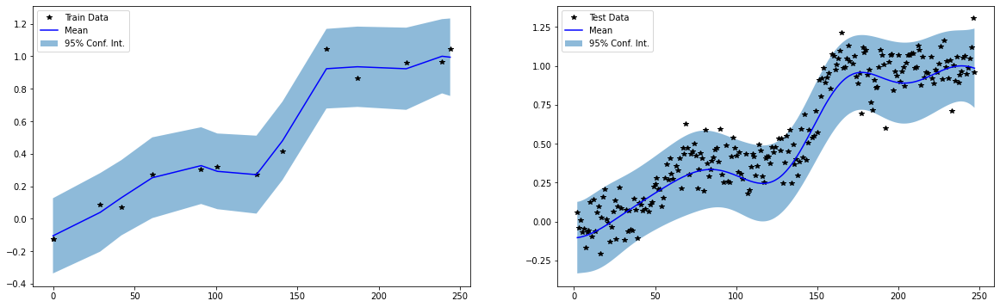

Iter 100/500 - Loss: -0.160   lengthscale: 32.310   noise: 0.007


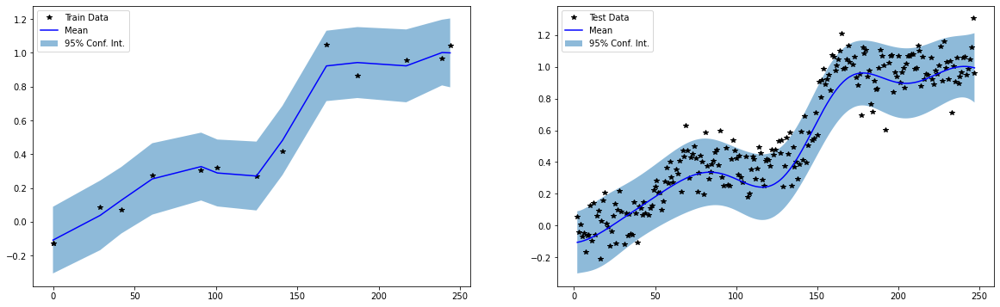

Iter 150/500 - Loss: -0.161   lengthscale: 33.366   noise: 0.007


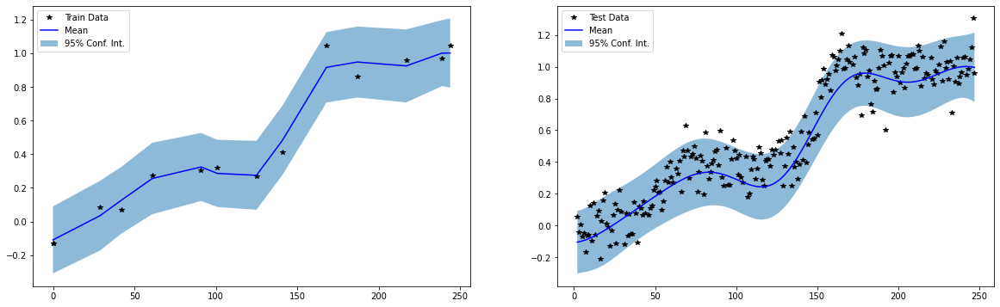

Iter 200/500 - Loss: -0.161   lengthscale: 33.939   noise: 0.007


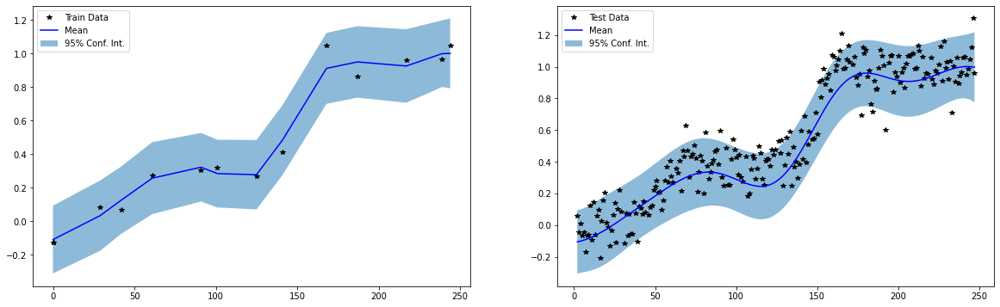

Iter 250/500 - Loss: -0.161   lengthscale: 34.245   noise: 0.007


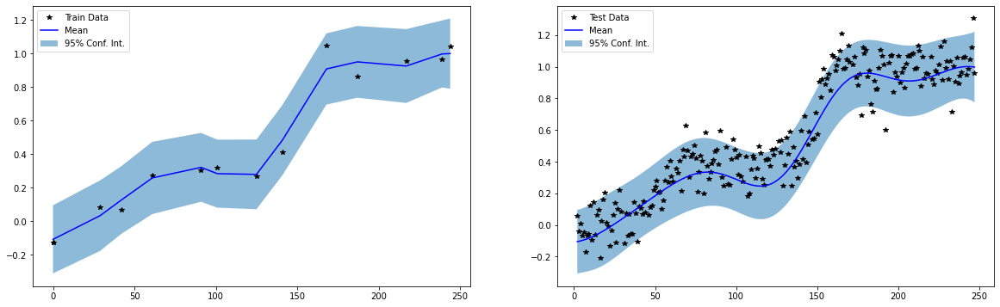

Iter 300/500 - Loss: -0.161   lengthscale: 34.401   noise: 0.007


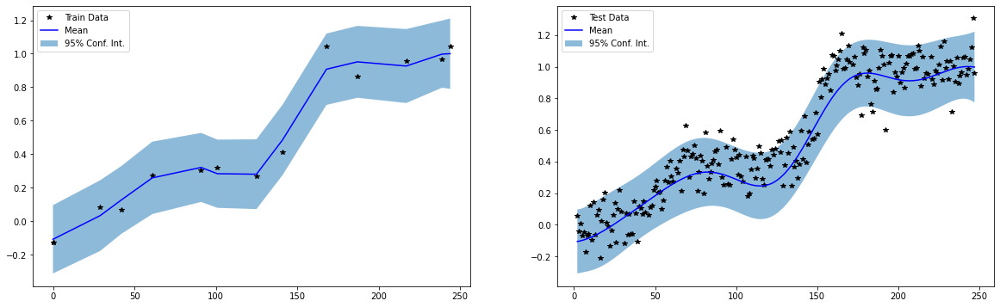

Iter 350/500 - Loss: -0.161   lengthscale: 34.476   noise: 0.007


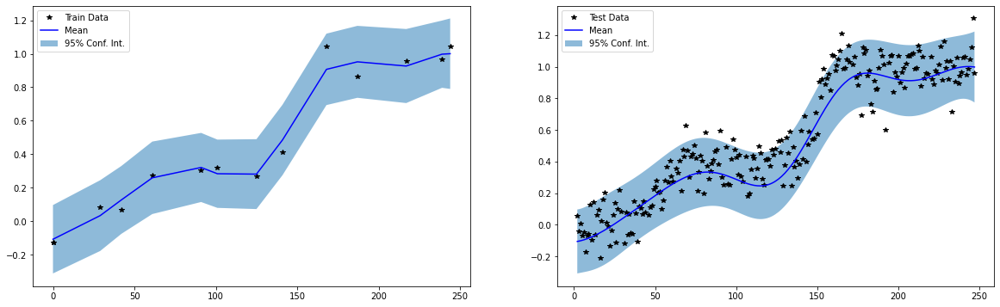

Iter 400/500 - Loss: -0.161   lengthscale: 34.510   noise: 0.007


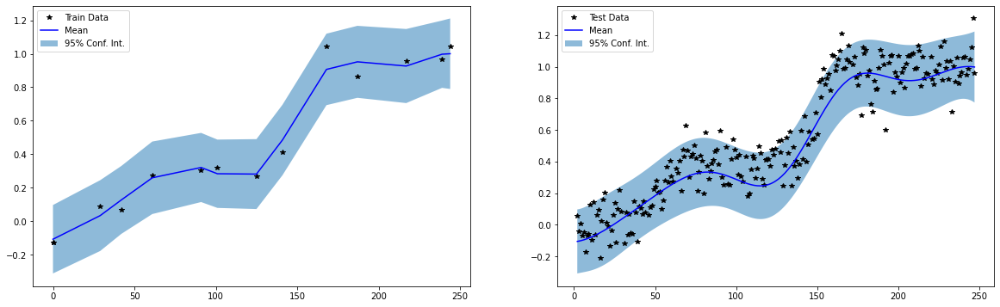

Iter 450/500 - Loss: -0.161   lengthscale: 34.524   noise: 0.007


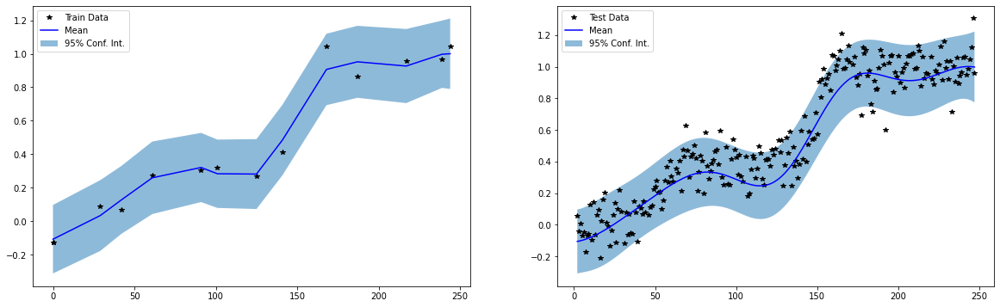

Iter 500/500 - Loss: -0.161   lengthscale: 34.529   noise: 0.007


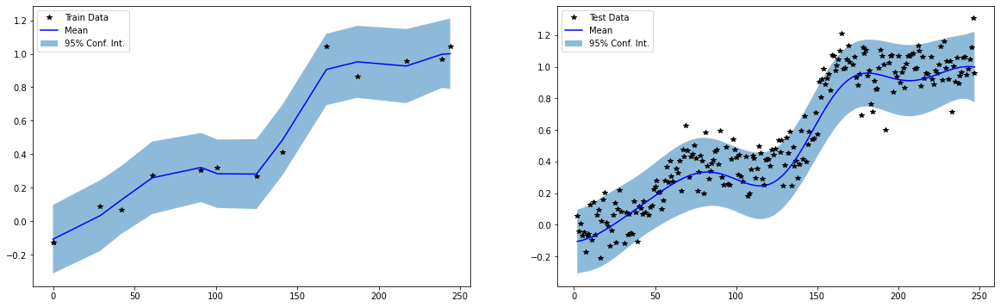

Train RMSE: 0.05684369057416916, Test RMSE: 0.1311265528202057
BEFORE TRAINING
15 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


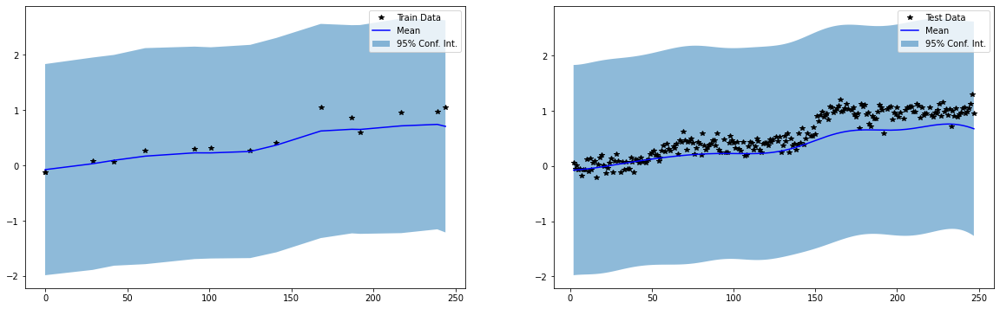

Iter 0/500 - Loss: 1.075   lengthscale: 25.100   noise: 0.644


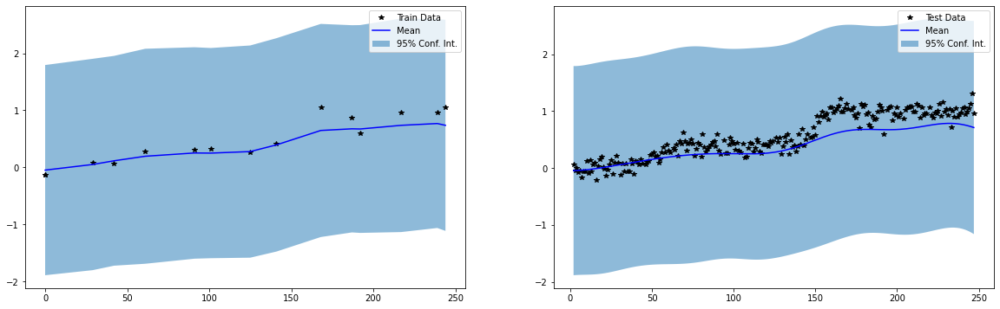

Iter 50/500 - Loss: -0.018   lengthscale: 29.819   noise: 0.012


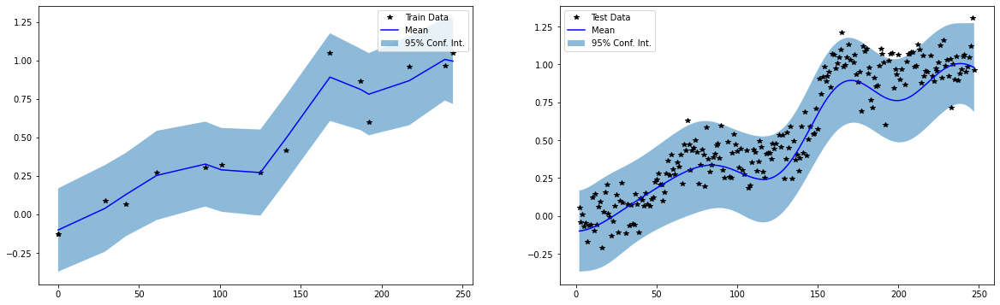

Iter 100/500 - Loss: -0.028   lengthscale: 26.445   noise: 0.011


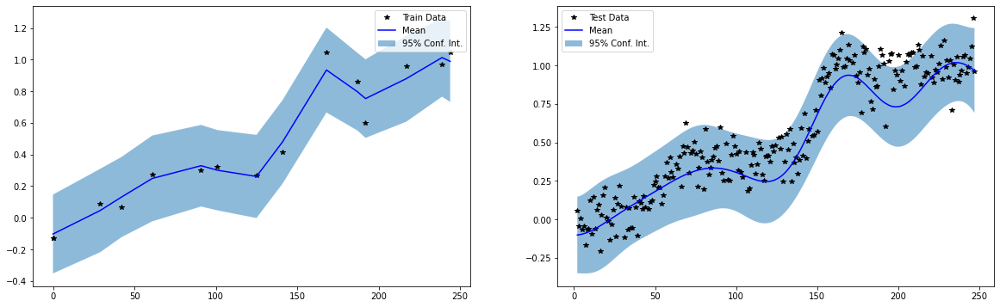

Iter 150/500 - Loss: -0.032   lengthscale: 24.187   noise: 0.008


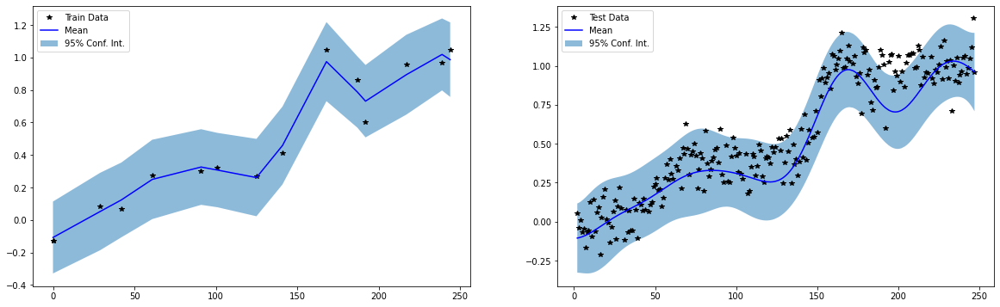

Iter 200/500 - Loss: -0.032   lengthscale: 23.809   noise: 0.008


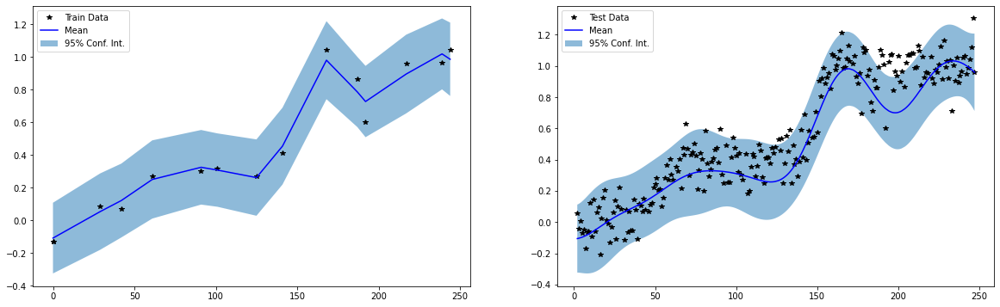

Iter 250/500 - Loss: -0.032   lengthscale: 23.835   noise: 0.008


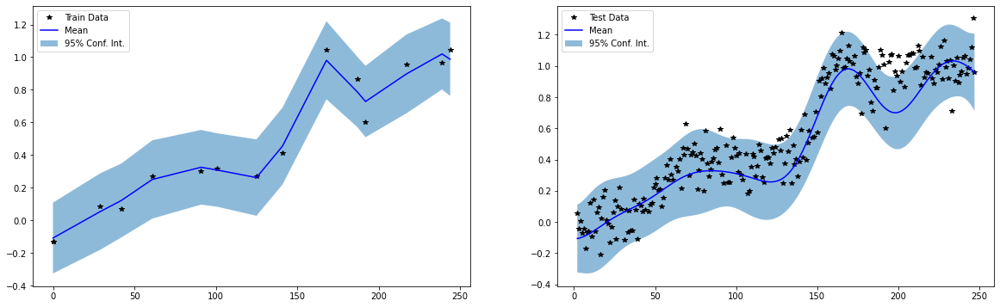

Iter 300/500 - Loss: -0.032   lengthscale: 23.834   noise: 0.008


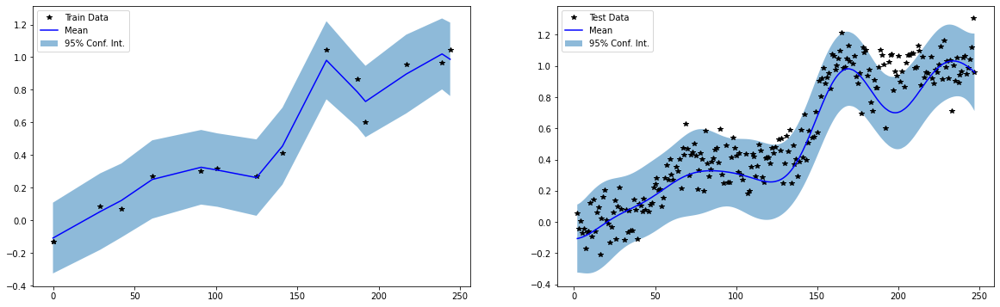

Iter 350/500 - Loss: -0.032   lengthscale: 23.834   noise: 0.008


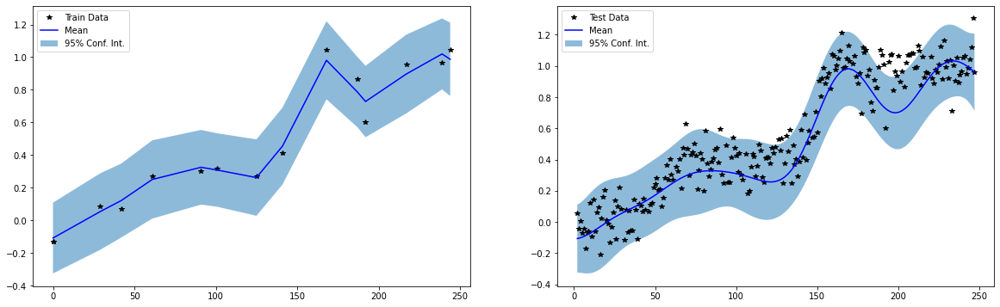

Iter 400/500 - Loss: -0.032   lengthscale: 23.834   noise: 0.008


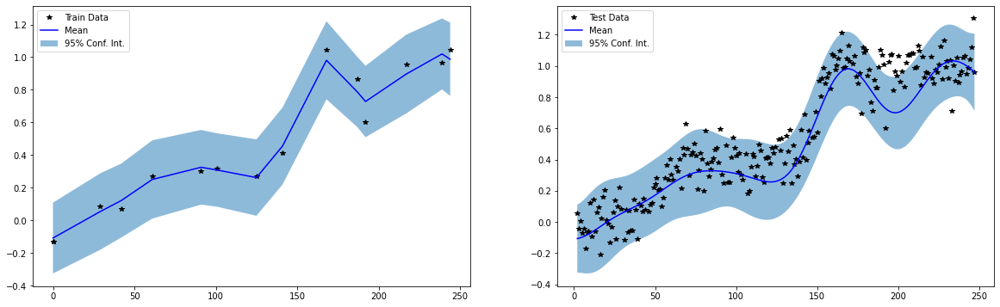

Iter 450/500 - Loss: -0.032   lengthscale: 23.834   noise: 0.008


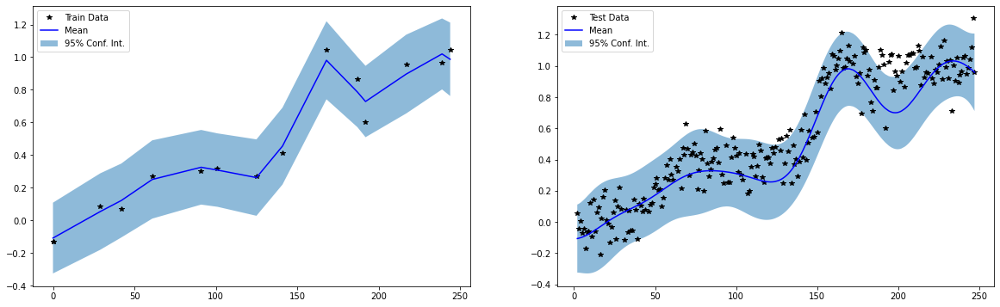

Iter 500/500 - Loss: -0.032   lengthscale: 23.834   noise: 0.008


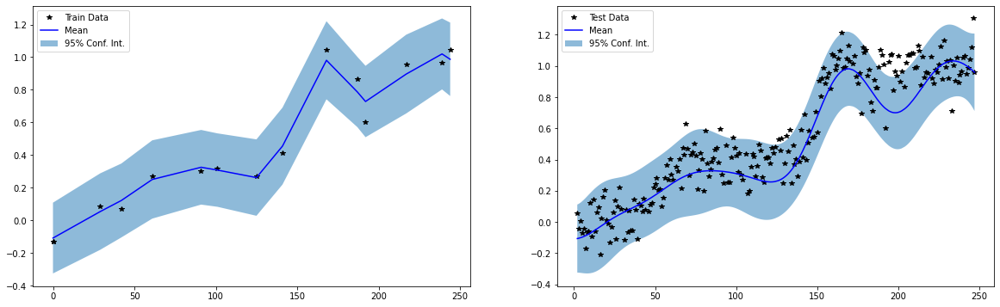

Train RMSE: 0.05401099845767021, Test RMSE: 0.146802619099617
BEFORE TRAINING
16 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


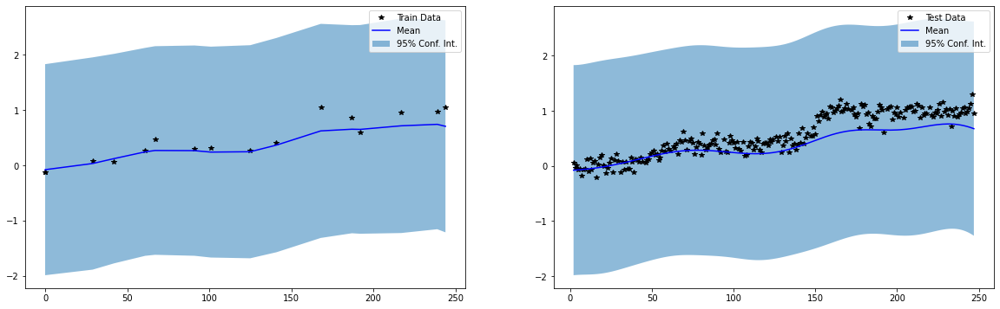

Iter 0/500 - Loss: 1.067   lengthscale: 25.100   noise: 0.644


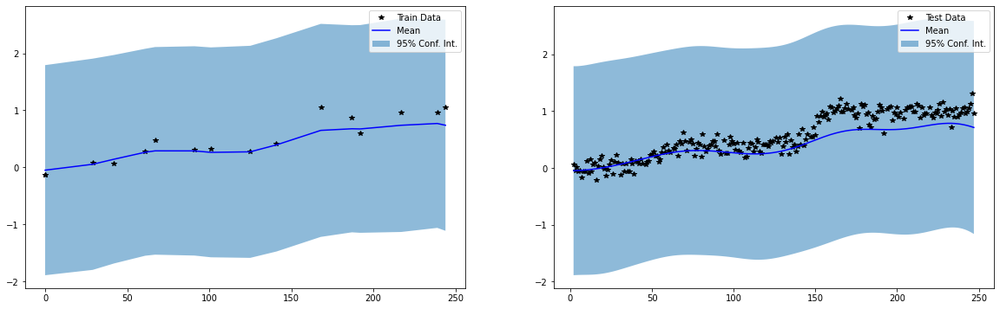

Iter 50/500 - Loss: -0.031   lengthscale: 29.841   noise: 0.013


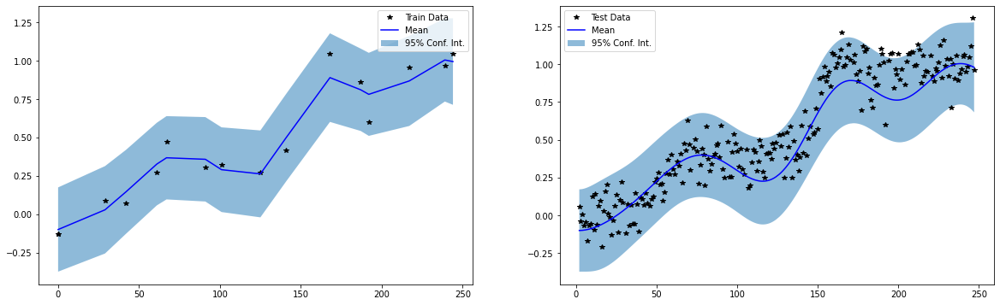

Iter 100/500 - Loss: -0.032   lengthscale: 28.537   noise: 0.013


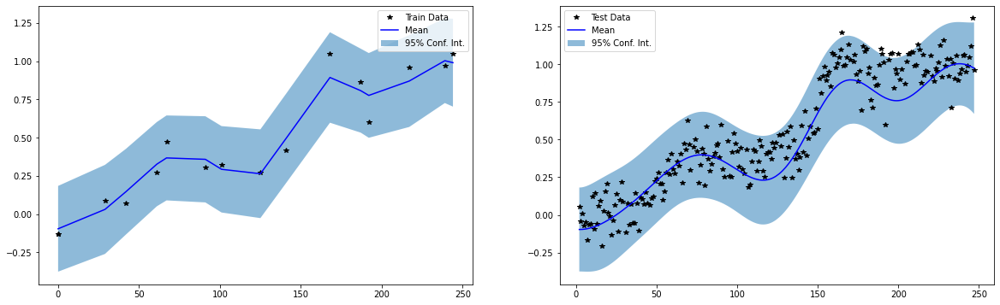

Iter 150/500 - Loss: -0.033   lengthscale: 27.487   noise: 0.012


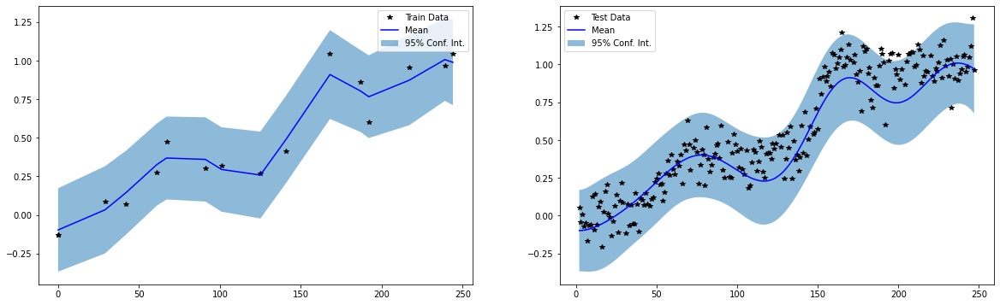

Iter 200/500 - Loss: -0.034   lengthscale: 25.985   noise: 0.011


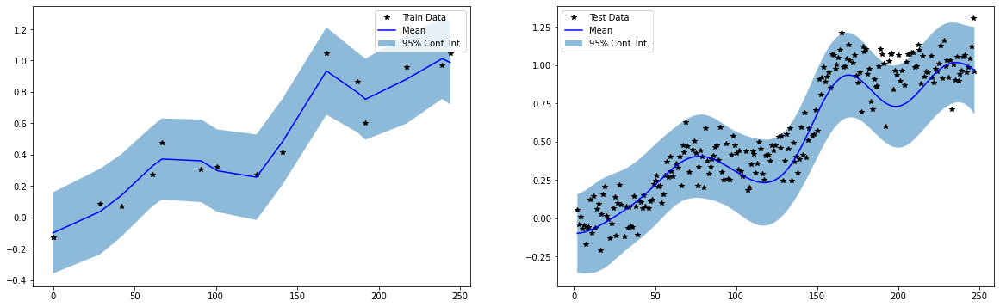

Iter 250/500 - Loss: -0.037   lengthscale: 23.564   noise: 0.009


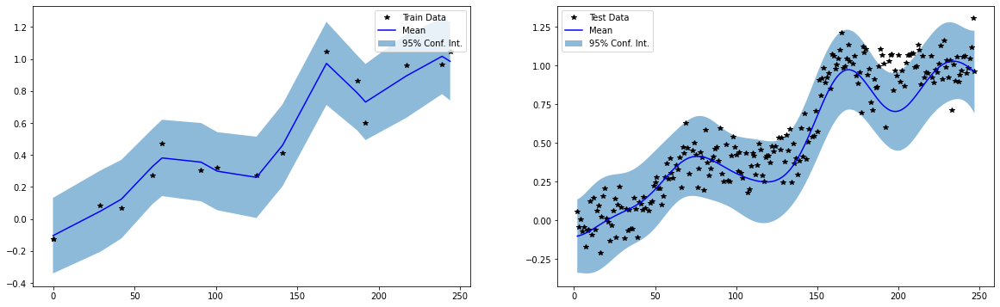

Iter 300/500 - Loss: -0.038   lengthscale: 22.418   noise: 0.008


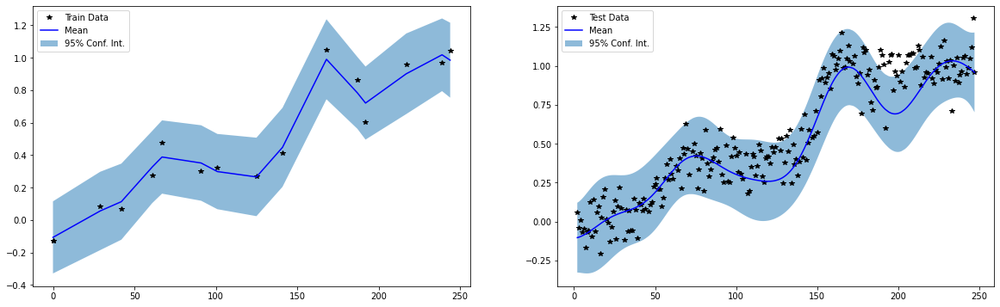

Iter 350/500 - Loss: -0.038   lengthscale: 22.485   noise: 0.008


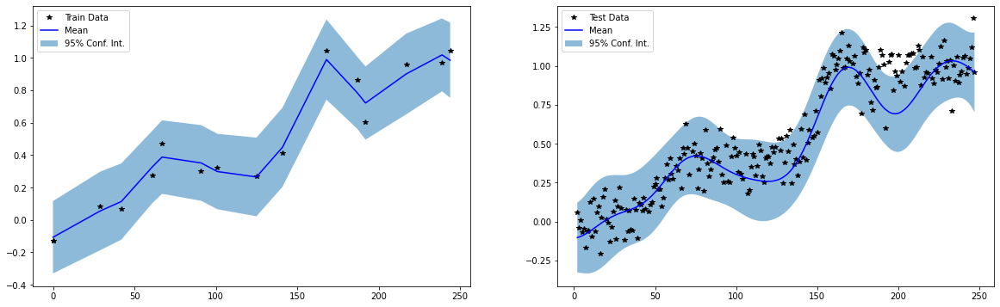

Iter 400/500 - Loss: -0.038   lengthscale: 22.480   noise: 0.008


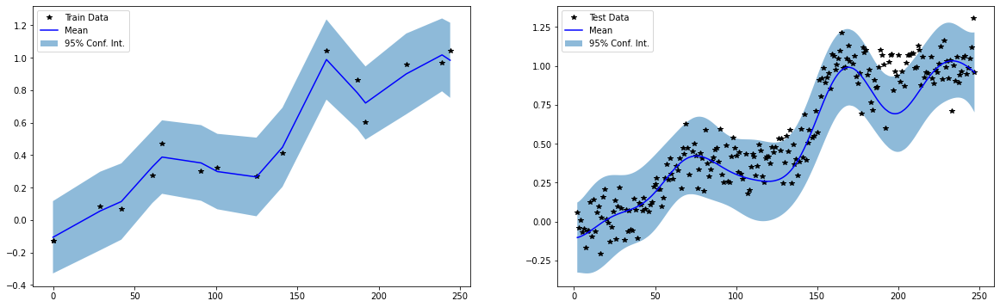

Iter 450/500 - Loss: -0.038   lengthscale: 22.480   noise: 0.008


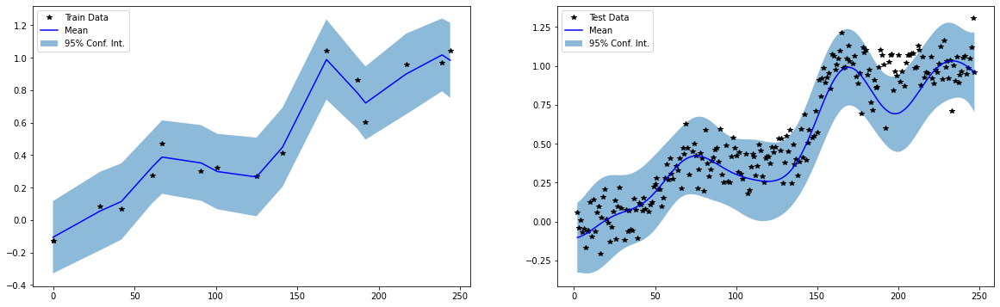

Iter 500/500 - Loss: -0.038   lengthscale: 22.480   noise: 0.008


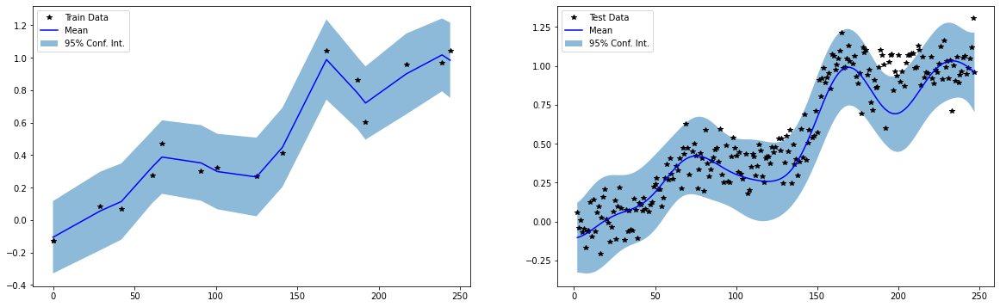

Train RMSE: 0.05682205408811569, Test RMSE: 0.14408519864082336
BEFORE TRAINING
17 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


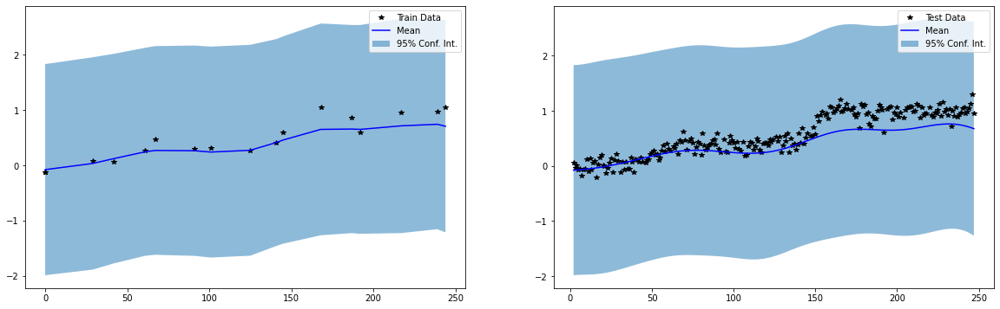

Iter 0/500 - Loss: 1.058   lengthscale: 25.100   noise: 0.644


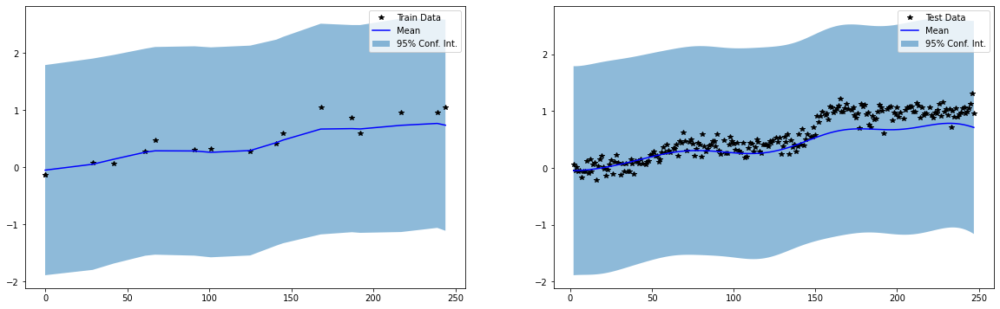

Iter 50/500 - Loss: -0.089   lengthscale: 29.820   noise: 0.012


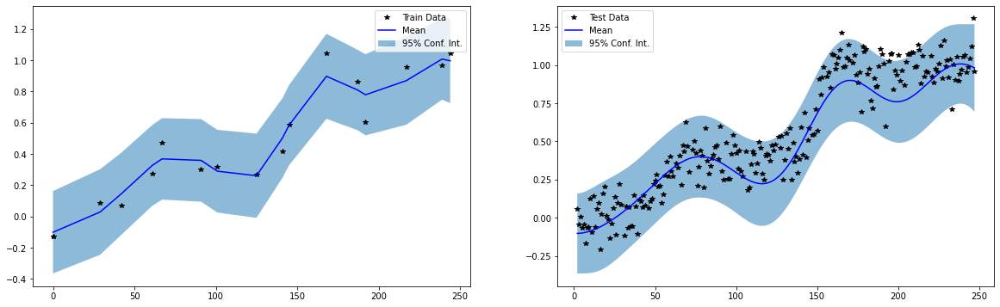

Iter 100/500 - Loss: -0.093   lengthscale: 27.477   noise: 0.011


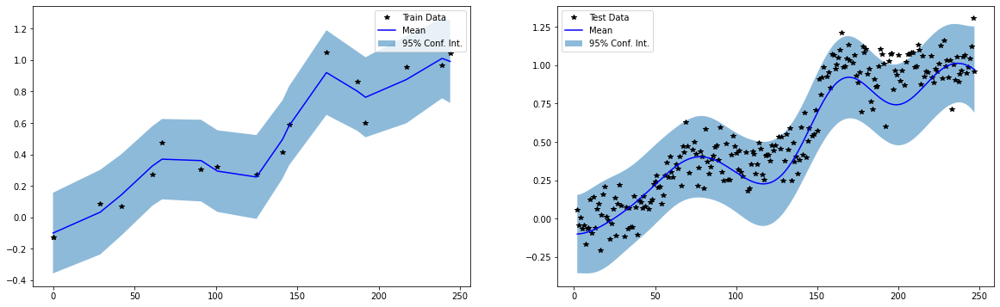

Iter 150/500 - Loss: -0.098   lengthscale: 24.829   noise: 0.009


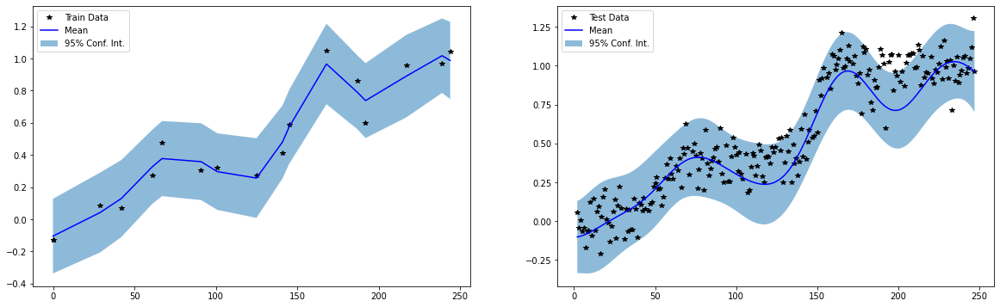

Iter 200/500 - Loss: -0.100   lengthscale: 22.899   noise: 0.008


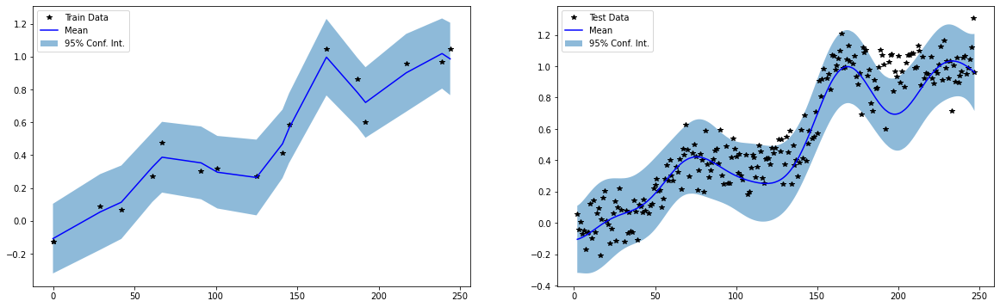

Iter 250/500 - Loss: -0.100   lengthscale: 22.938   noise: 0.008


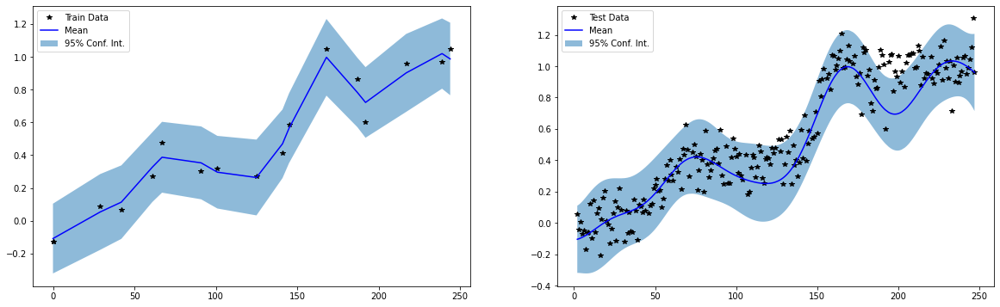

Iter 300/500 - Loss: -0.100   lengthscale: 22.933   noise: 0.008


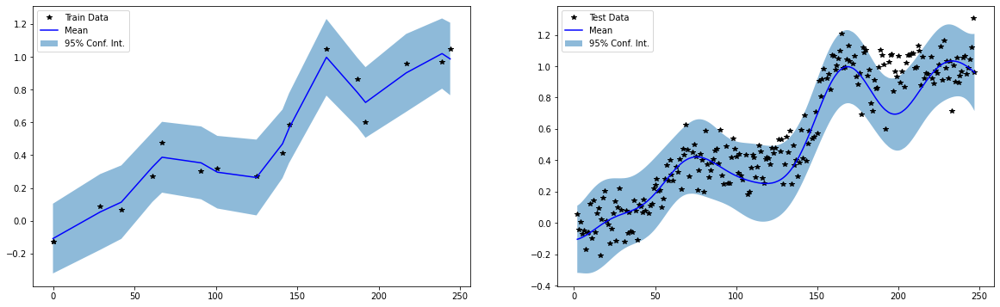

Iter 350/500 - Loss: -0.100   lengthscale: 22.934   noise: 0.008


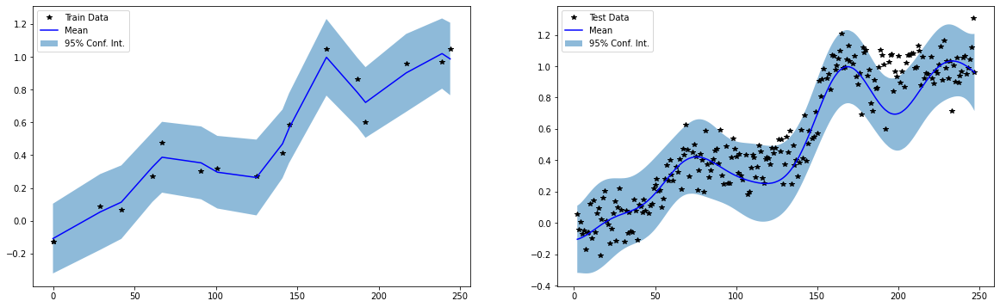

Iter 400/500 - Loss: -0.100   lengthscale: 22.934   noise: 0.008


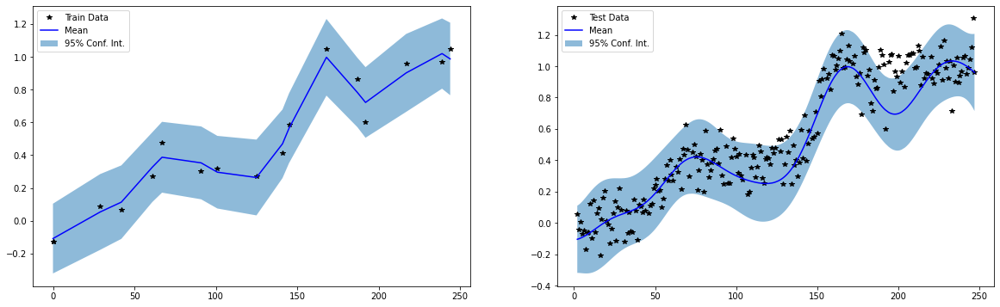

Iter 450/500 - Loss: -0.100   lengthscale: 22.934   noise: 0.008


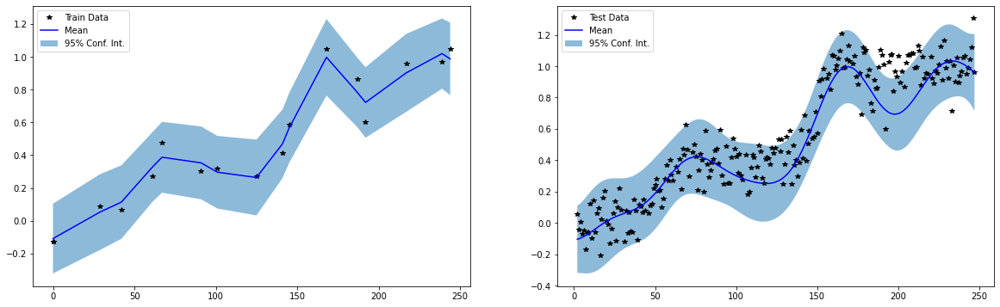

Iter 500/500 - Loss: -0.100   lengthscale: 22.934   noise: 0.008


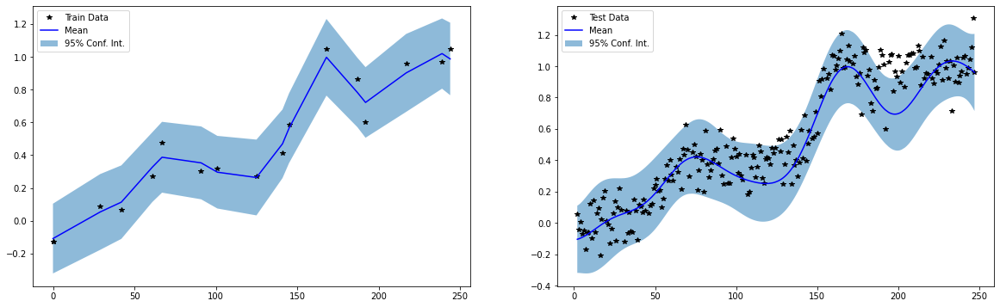

Train RMSE: 0.05619096755981445, Test RMSE: 0.14320817589759827
BEFORE TRAINING
18 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


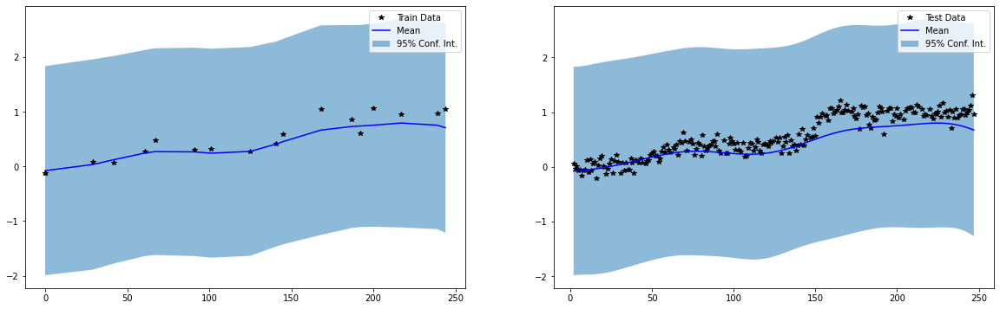

Iter 0/500 - Loss: 1.053   lengthscale: 25.100   noise: 0.644


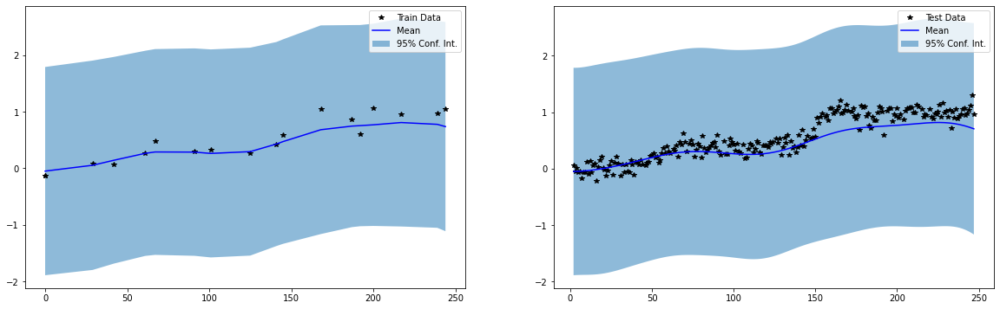

Iter 50/500 - Loss: -0.029   lengthscale: 30.430   noise: 0.015


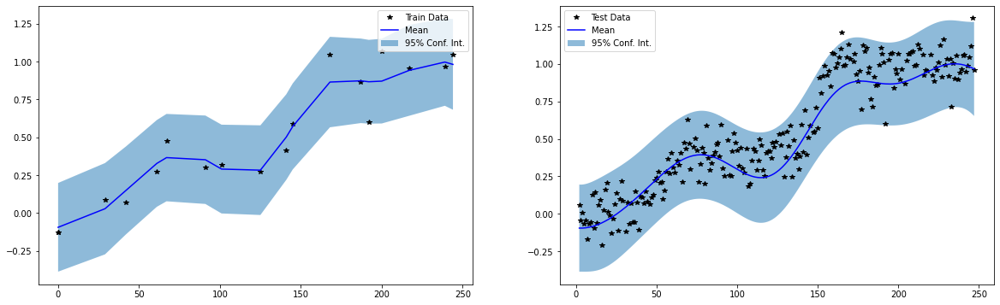

Iter 100/500 - Loss: -0.055   lengthscale: 34.913   noise: 0.019


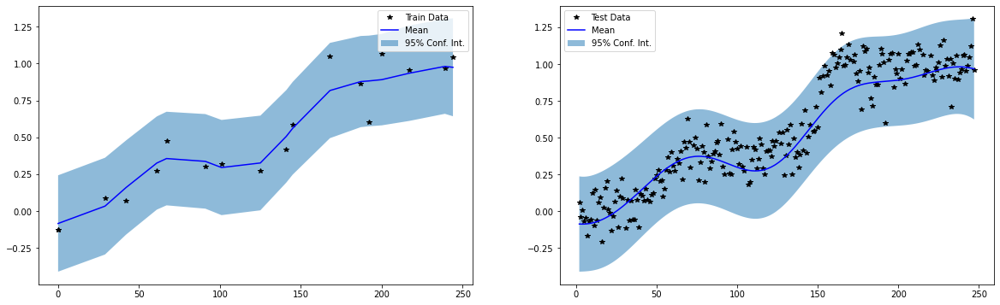

Iter 150/500 - Loss: -0.063   lengthscale: 38.116   noise: 0.019


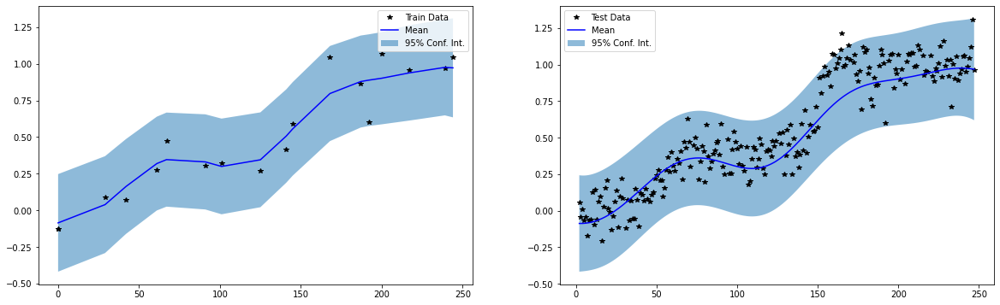

Iter 200/500 - Loss: -0.068   lengthscale: 40.588   noise: 0.020


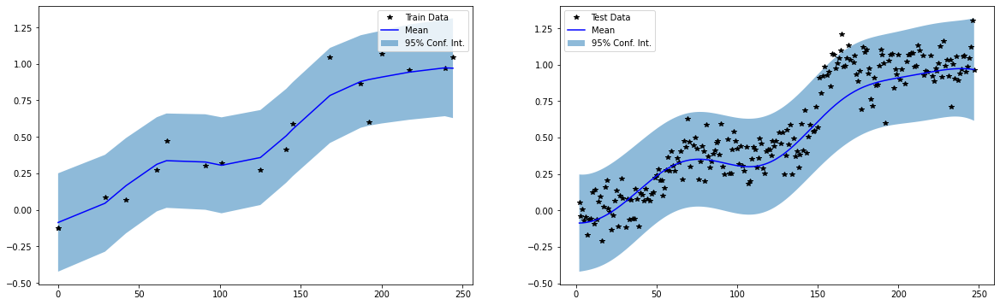

Iter 250/500 - Loss: -0.070   lengthscale: 42.631   noise: 0.020


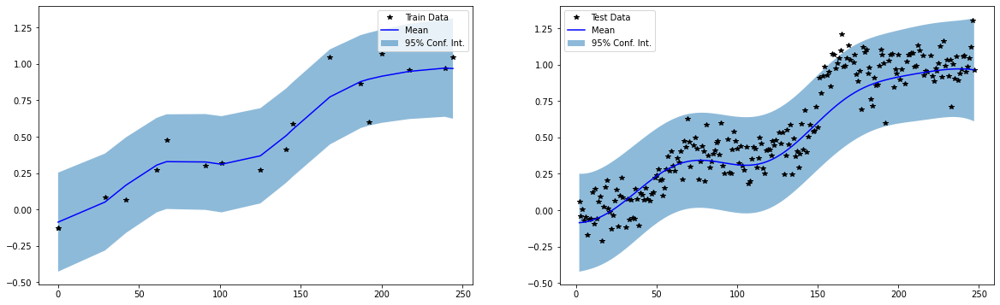

Iter 300/500 - Loss: -0.072   lengthscale: 44.445   noise: 0.021


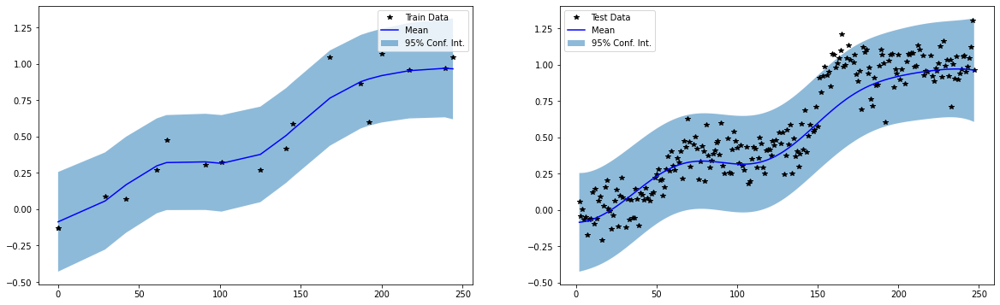

Iter 350/500 - Loss: -0.074   lengthscale: 46.169   noise: 0.021


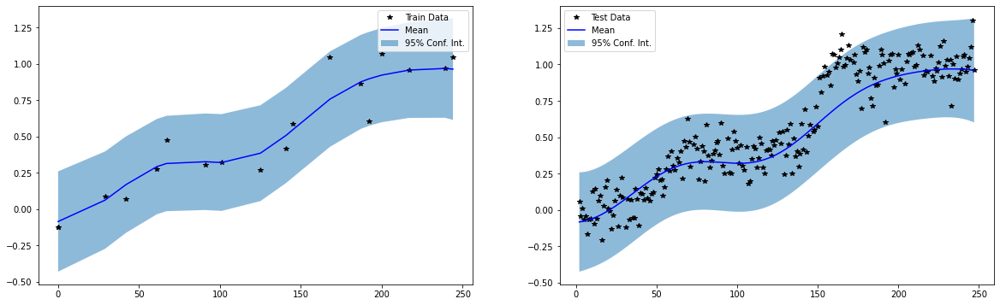

Iter 400/500 - Loss: -0.075   lengthscale: 47.898   noise: 0.021


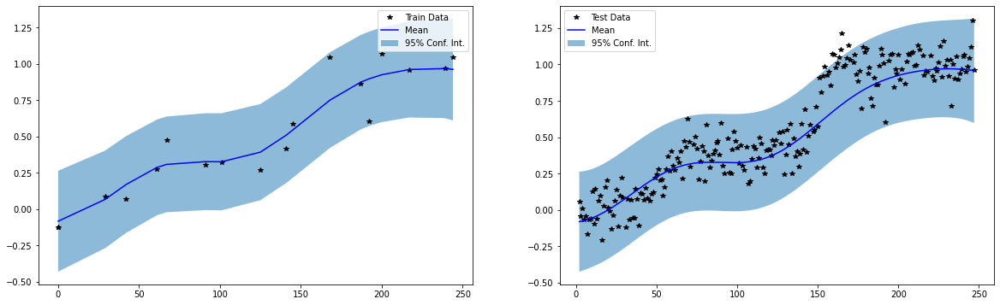

Iter 450/500 - Loss: -0.077   lengthscale: 49.696   noise: 0.022


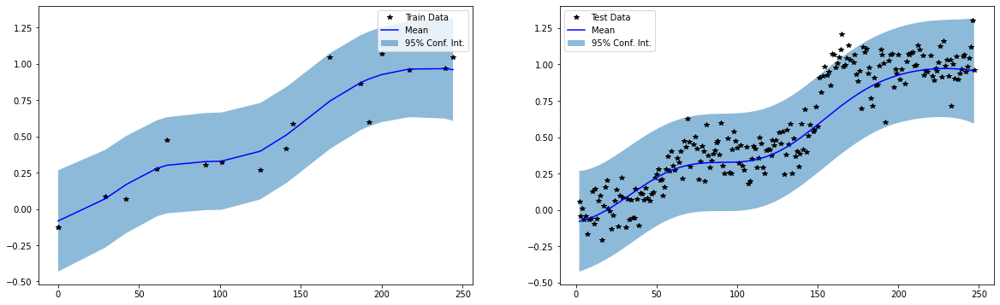

Iter 500/500 - Loss: -0.079   lengthscale: 51.590   noise: 0.022


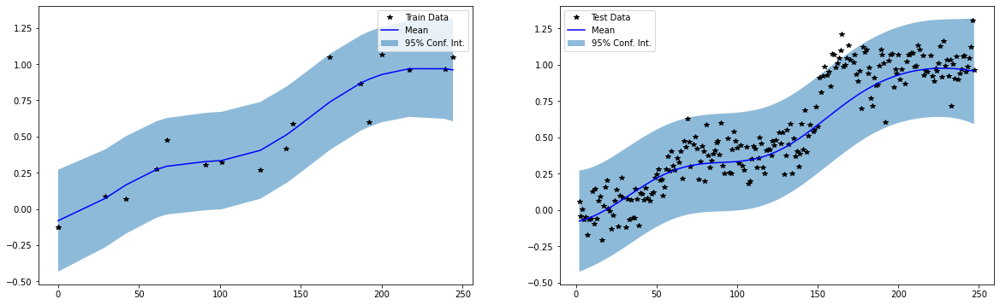

Train RMSE: 0.12560120224952698, Test RMSE: 0.14871633052825928
BEFORE TRAINING
19 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


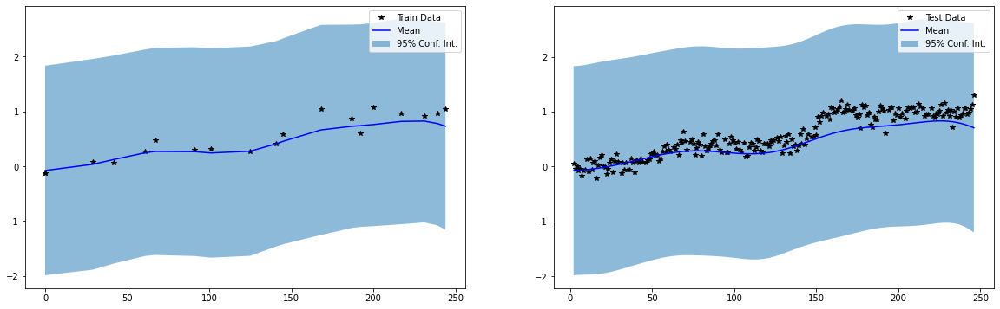

Iter 0/500 - Loss: 1.043   lengthscale: 25.100   noise: 0.644


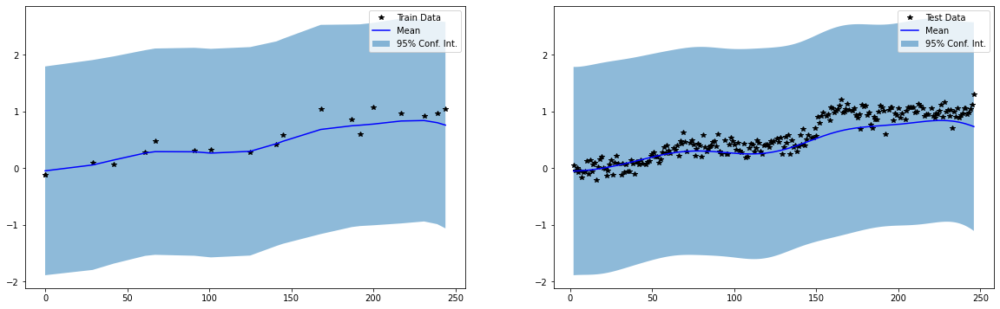

Iter 50/500 - Loss: -0.071   lengthscale: 30.452   noise: 0.014


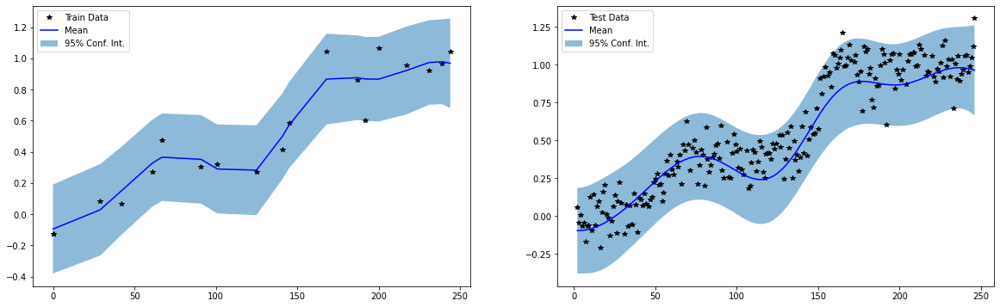

Iter 100/500 - Loss: -0.098   lengthscale: 35.046   noise: 0.017


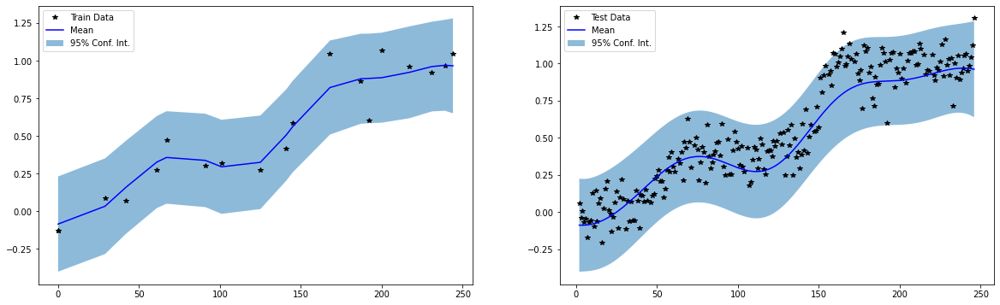

Iter 150/500 - Loss: -0.106   lengthscale: 38.164   noise: 0.018


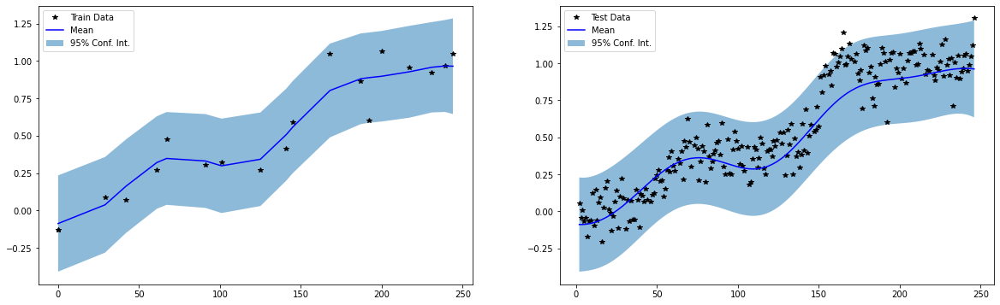

Iter 200/500 - Loss: -0.110   lengthscale: 40.466   noise: 0.019


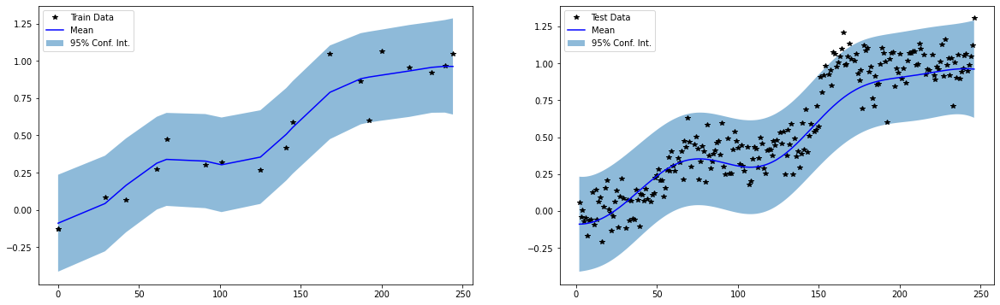

Iter 250/500 - Loss: -0.112   lengthscale: 42.277   noise: 0.019


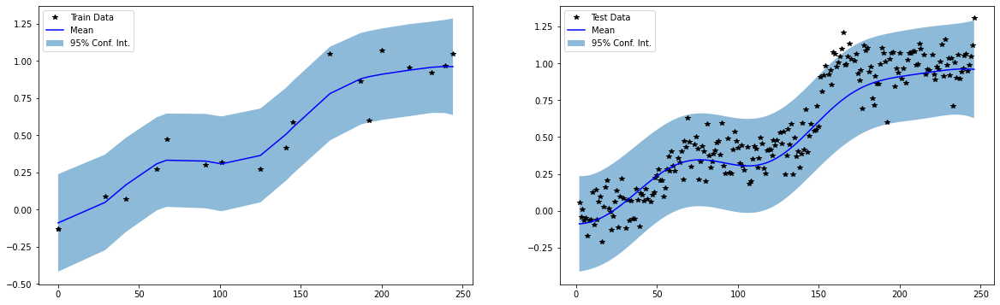

Iter 300/500 - Loss: -0.113   lengthscale: 43.797   noise: 0.019


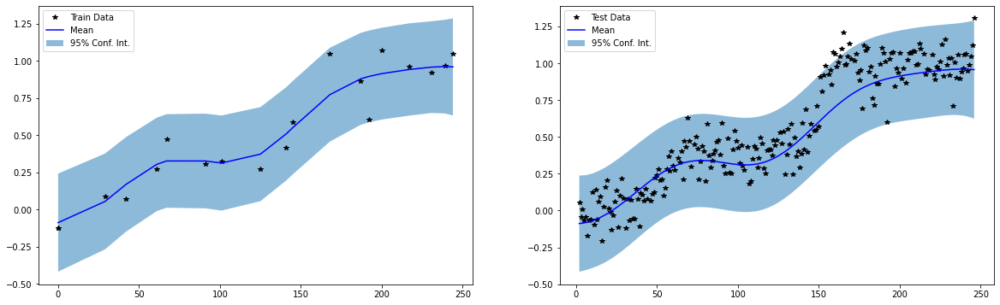

Iter 350/500 - Loss: -0.114   lengthscale: 45.156   noise: 0.019


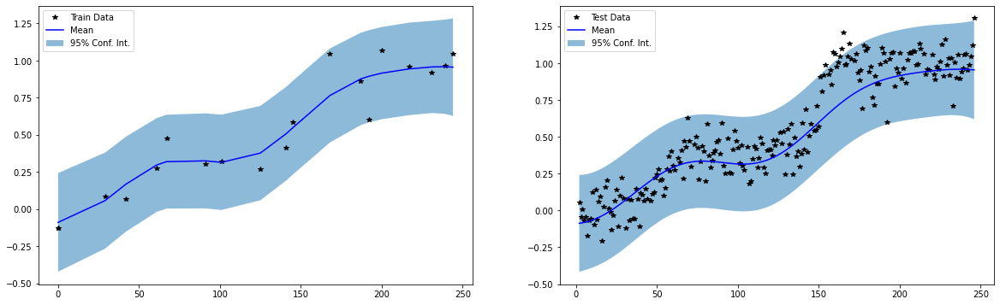

Iter 400/500 - Loss: -0.115   lengthscale: 46.441   noise: 0.020


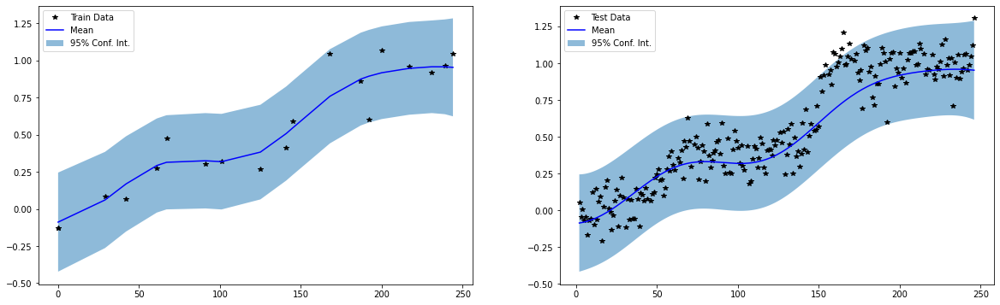

Iter 450/500 - Loss: -0.116   lengthscale: 47.717   noise: 0.020


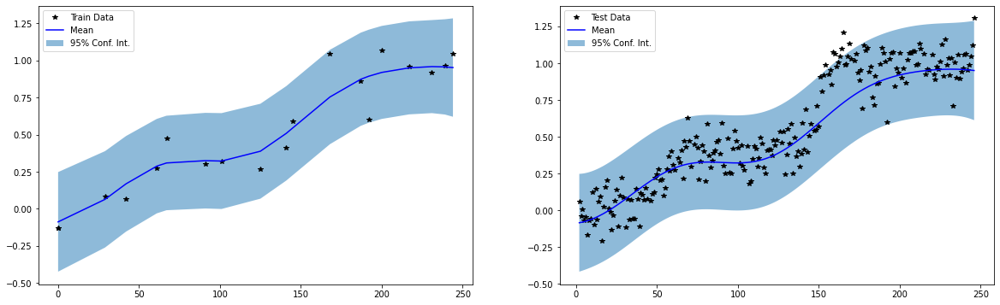

Iter 500/500 - Loss: -0.116   lengthscale: 49.030   noise: 0.020


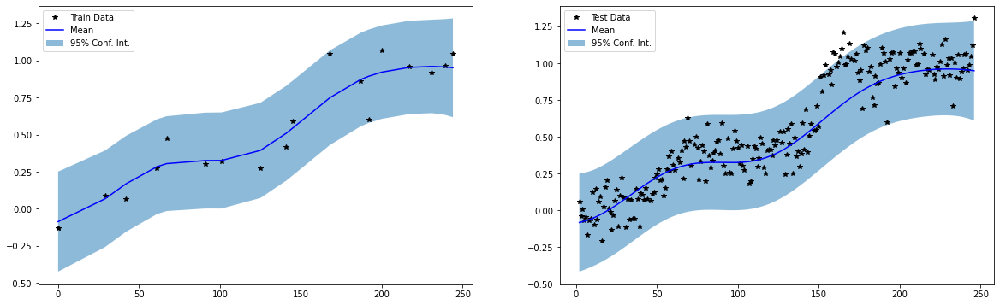

Train RMSE: 0.12026576697826385, Test RMSE: 0.1475387066602707
BEFORE TRAINING
20 TRAINING POINTS
lengthscale: 25.000   noise: 0.693


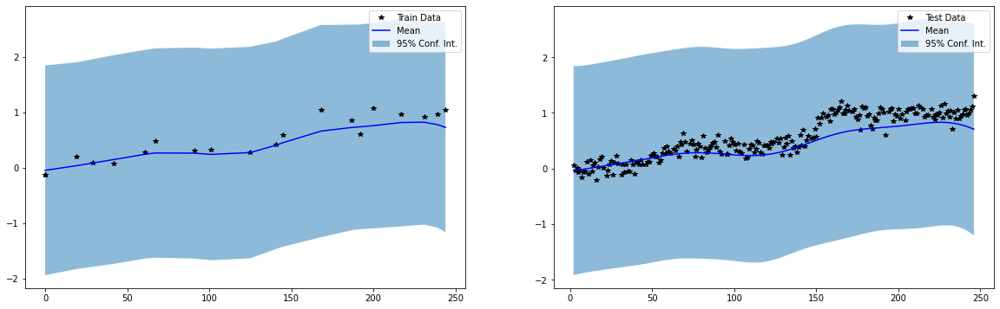

Iter 0/500 - Loss: 1.037   lengthscale: 25.100   noise: 0.644


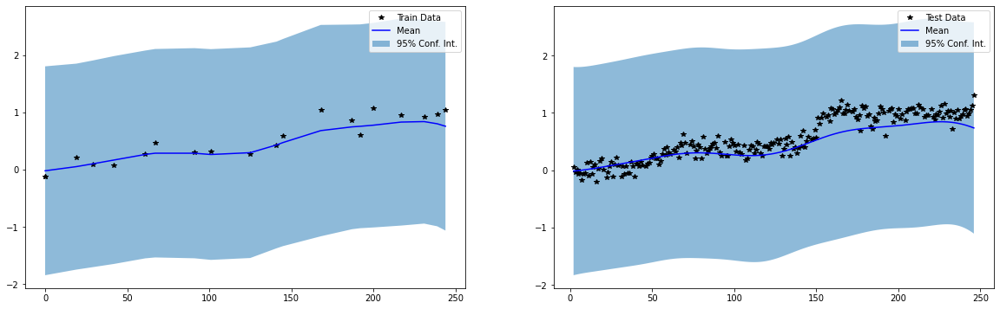

Iter 50/500 - Loss: -0.056   lengthscale: 30.334   noise: 0.016


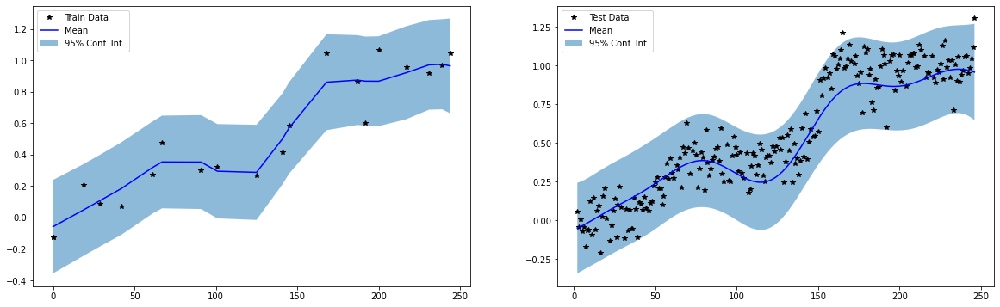

Iter 100/500 - Loss: -0.081   lengthscale: 34.816   noise: 0.020


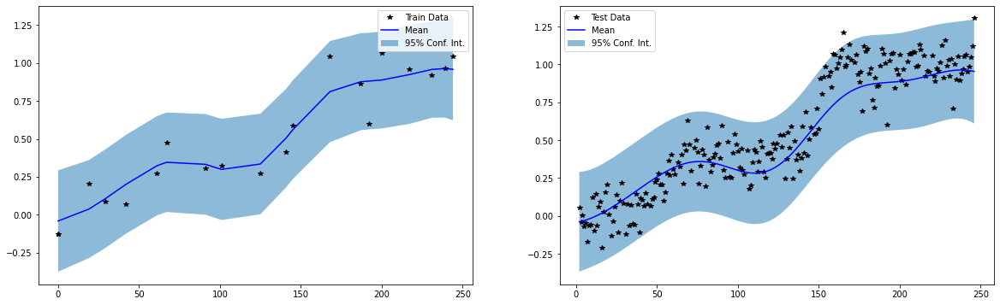

Iter 150/500 - Loss: -0.093   lengthscale: 38.688   noise: 0.021


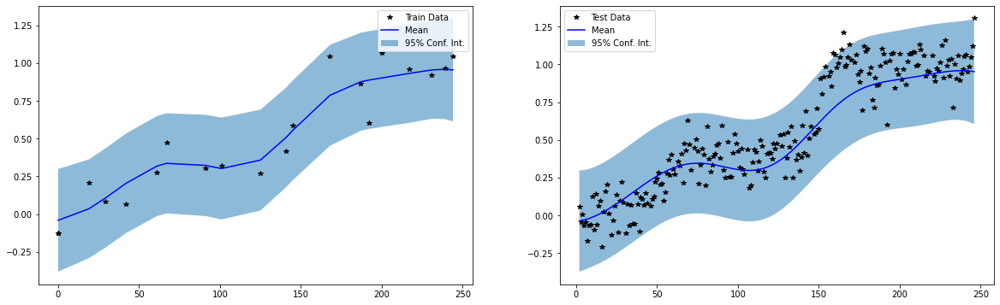

Iter 200/500 - Loss: -0.102   lengthscale: 42.199   noise: 0.021


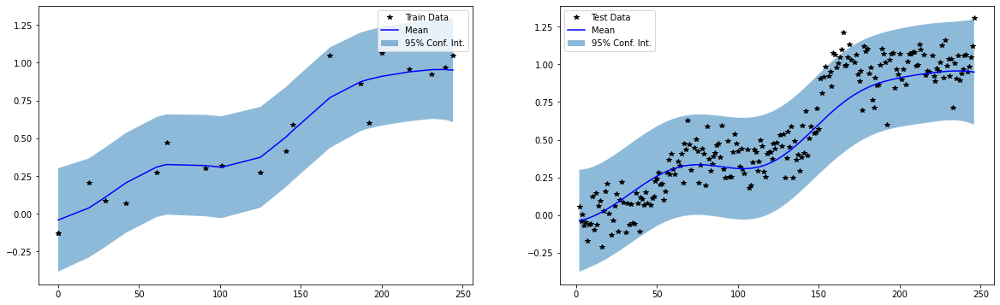

Iter 250/500 - Loss: -0.109   lengthscale: 45.415   noise: 0.022


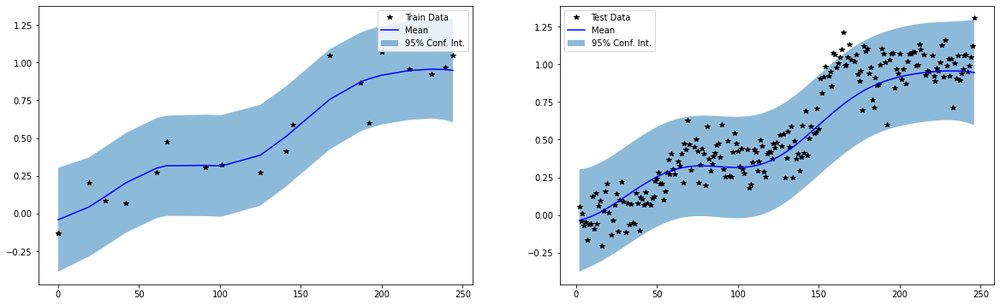

Iter 300/500 - Loss: -0.114   lengthscale: 48.369   noise: 0.022


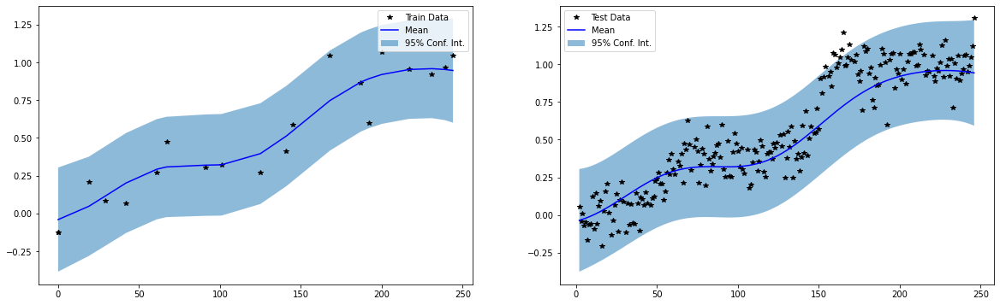

Iter 350/500 - Loss: -0.118   lengthscale: 51.097   noise: 0.022


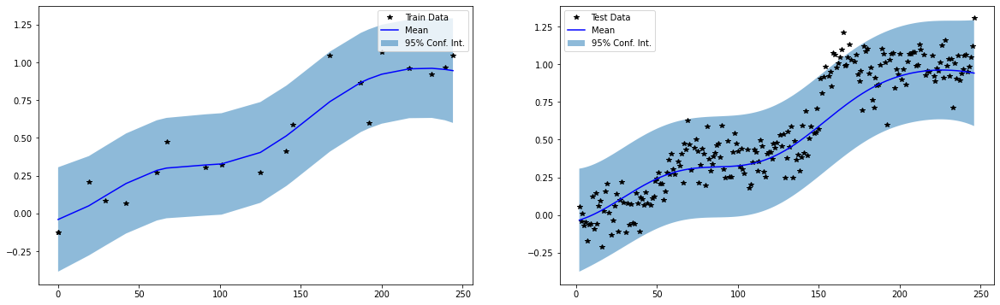

Iter 400/500 - Loss: -0.122   lengthscale: 53.621   noise: 0.022


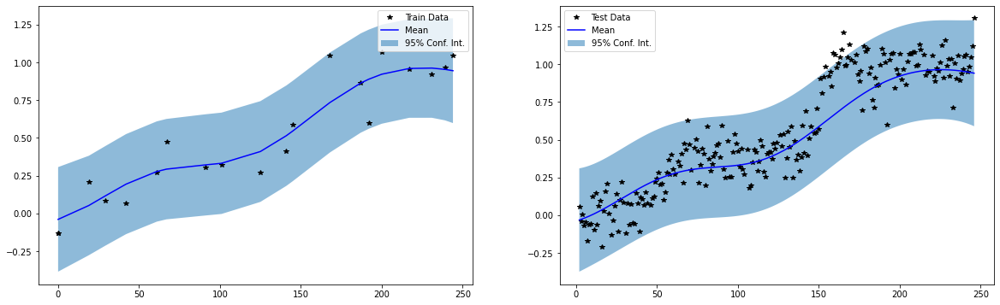

Iter 450/500 - Loss: -0.124   lengthscale: 55.951   noise: 0.022


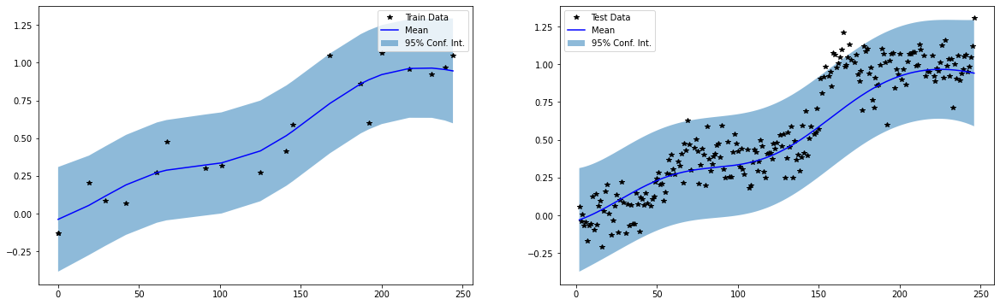

Iter 500/500 - Loss: -0.127   lengthscale: 58.089   noise: 0.022


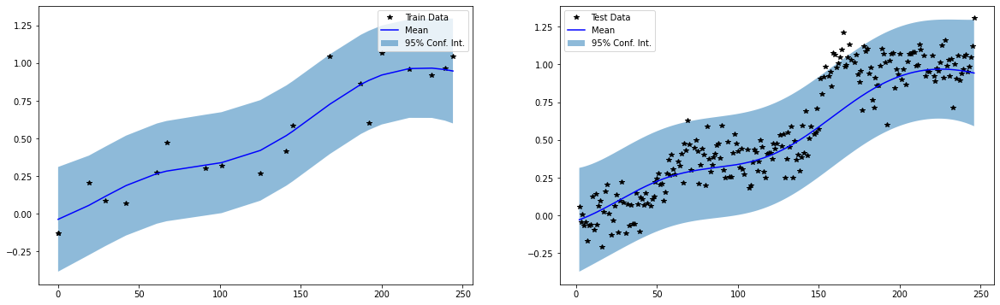

Train RMSE: 0.13069947063922882, Test RMSE: 0.15406855940818787


In [12]:
train_samples = [125]
test_samples = np.delete(x, 125).numpy()

train_means = []
train_pts = []
test_means = []
test_pts = []

for i in range(20):
    train_x, train_y, test_x, test_y = x[train_samples], y[train_samples], x[test_samples], y[test_samples]
    train_x, train_y = train_x[train_x.argsort()], train_y[train_x.argsort()]
    test_x, test_y = test_x[test_x.argsort()], test_y[test_x.argsort()]
    
    likelihood = gpytorch.likelihoods.GaussianLikelihood()
    model = ExactGPModel(train_x, train_y, likelihood)

    #set lengthscale
    model.covar_module.base_kernel.lengthscale = 25

    # Use the adam optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=0.1)  # Includes GaussianLikelihood parameters

    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)
    
    for i in range(501):
        if i == 0:
            print('BEFORE TRAINING')
            print('{} TRAINING POINTS'.format(len(train_samples)))
            print('lengthscale: %.3f   noise: %.3f' % (
                model.covar_module.base_kernel.lengthscale.item(),
                model.likelihood.noise.item()
            ))
            train_mean, test_mean, max_posterior_variance_test = plot_preds(model, likelihood, True)
            train_samples.append(max_posterior_variance_test)
            test_samples = np.delete(test_samples, max_posterior_variance_test)
            
        model.train()
        likelihood.train()
        
        optimizer.zero_grad()

        output = model(train_x)
        loss = -mll(output, train_y)
        loss.backward()
        
        optimizer.step()

        if i % 50 == 0:
            print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
                i , 500, loss.item(),
                model.covar_module.base_kernel.lengthscale.item(),
                model.likelihood.noise.item()
            ))
            
            train_mean, test_mean, max_posterior_variance_test = plot_preds(model, likelihood, True)
            
            train_rmse = np.sqrt(np.mean((train_mean-train_y.numpy())**2))
            test_rmse = np.sqrt(np.mean((test_mean-test_y.numpy())**2))
            
            if i == 500:
                print('Train RMSE: {}, Test RMSE: {}'.format(train_rmse, test_rmse))